In [1]:
from sklearn.datasets import fetch_20newsgroups
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']
twenty_train = fetch_20newsgroups(subset='train', categories=categories, shuffle=True,
                                  random_state=42, remove=('headers', 'footers'))
twenty_test = fetch_20newsgroups(subset='test', categories=categories, shuffle=True,
                                 random_state=42, remove=('headers', 'footers'))

In [2]:
i = 125
print("Class: {}".format(twenty_train.target_names[twenty_train.target[i]]))
print("-"*20); print()
sample = twenty_train.data[i]; print(sample)

Class: alt.atheism
--------------------

In article <1993Apr3.153552.4334@mac.cc.macalstr.edu>, acooper@mac.cc.macalstr.edu writes:
|> In article <1pint5$1l4@fido.asd.sgi.com>, livesey@solntze.wpd.sgi.com (Jon Livesey) writes
>
> Well, Germany was hardly the ONLY country to discriminate against the 
> Jews, although it has the worst reputation because it did the best job 
> of expressing a general European dislike of them.  This should not turn 
> into a debate on antisemitism, but you should also point out that Luther's
>  antiSemitism was based on religious grounds, while Hitler's was on racial 
> grounds, and Wagnmer's on aesthetic grounds.  Just blanketing the whole 
> group is poor analysis, even if they all are bigots.

I find these to be intriguing remarks.   Could you give us a bit
more explanation here?   For example, which religion is anti-semitic,
and which aesthetic?


In [2]:
import numpy as np
from scipy.spatial import distance
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [4]:
import eli5
from eli5.lime import TextExplainer

In [5]:
def predict_proba_len(docs):
    proba = [
        [0, 1.0, 0.0, 0] if len(doc) % 2 else [1.0, 0, 0, 0]
        for doc in docs
    ]
    return np.array(proba)

In [6]:
len(sample)

850

In [7]:
sample[:850]

"In article <1993Apr3.153552.4334@mac.cc.macalstr.edu>, acooper@mac.cc.macalstr.edu writes:\n|> In article <1pint5$1l4@fido.asd.sgi.com>, livesey@solntze.wpd.sgi.com (Jon Livesey) writes\n>\n> Well, Germany was hardly the ONLY country to discriminate against the \n> Jews, although it has the worst reputation because it did the best job \n> of expressing a general European dislike of them.  This should not turn \n> into a debate on antisemitism, but you should also point out that Luther's\n>  antiSemitism was based on religious grounds, while Hitler's was on racial \n> grounds, and Wagnmer's on aesthetic grounds.  Just blanketing the whole \n> group is poor analysis, even if they all are bigots.\n\nI find these to be intriguing remarks.   Could you give us a bit\nmore explanation here?   For example, which religion is anti-semitic,\nand which aesthetic?"

In [8]:
te2 = TextExplainer().fit(sample, predict_proba_len)
te2.show_prediction(target_names=twenty_train.target_names)

In [9]:
te2.metrics_

{'mean_KL_divergence': 0.7310681155875282, 'score': 0.5164787688769858}

# understand rf classifier

https://marcotcr.github.io/lime/tutorials/Lime%20-%20basic%20usage%2C%20two%20class%20case.html

In [3]:
import lime
import sklearn
import numpy as np
import sklearn
import sklearn.ensemble
import sklearn.metrics
from sklearn.model_selection import train_test_split
from __future__ import print_function

In [4]:
import pandas as pd
import pickle

In [5]:
df_train = pd.read_csv("./data/train.csv",encoding = "utf8")

In [6]:
y_response = df_train.label.values
fileObject = open('trigram_text','rb')  
tri_lem_comb2 = pickle.load(fileObject) 

In [7]:
x_train, x_test, y_train, y_test = train_test_split(tri_lem_comb2, y_response, test_size = 0.2, stratify = y_response)

In [20]:
df_train['text'][0]

'House Dem Aide: We Didn’t Even See Comey’s Letter Until Jason Chaffetz Tweeted It By Darrell Lucus on October 30, 2016 Subscribe Jason Chaffetz on the stump in American Fork, Utah ( image courtesy Michael Jolley, available under a Creative Commons-BY license) \nWith apologies to Keith Olbermann, there is no doubt who the Worst Person in The World is this week–FBI Director James Comey. But according to a House Democratic aide, it looks like we also know who the second-worst person is as well. It turns out that when Comey sent his now-infamous letter announcing that the FBI was looking into emails that may be related to Hillary Clinton’s email server, the ranking Democrats on the relevant committees didn’t hear about it from Comey. They found out via a tweet from one of the Republican committee chairmen. \nAs we now know, Comey notified the Republican chairmen and Democratic ranking members of the House Intelligence, Judiciary, and Oversight committees that his agency was reviewing emai

In [25]:
tri_lem_comb2[2]


'why the truth may get -PRON- fire october the tension_between intelligence_analyst and political policymaker have always be between honest assessment and desire result with the latter often overwhelm the former as in the iraq_war write lawrence davidson by lawrence davidson for those_who may wonder_why foreign_policy maker repeatedly make bad choice some insight may be draw from the follow analysis the action here play out in the united_states but the lesson be probably universal back in the early spring of george_w._bush initiate the invasion of iraq one of -PRON- key public reason for do so be the claim that the country ’s dictator saddam_hussein be on the verge of develop_nuclear_weapon and be hide other weapon of mass_destruction the real_reason go beyond that charge and include a long_range plan for regime_change in the middle_east president_george_w._bush and vice_president_dick_cheney receive an oval_office briefing from cia_director george tenet also present be chief of staff 

In [26]:
print(df_train['label'][2])

1


##### x_test

In [28]:
testing = []
testing_l = []
testing.append('americans include u.s._ambassador christopher_stevens be kill in a terrorist_attack in benghazi')
testing_l.append(0)
testing.append('they announce that the fbi be look into email that may be relate to hillary_clinton ’s email_s')
testing_l.append(1)
testing.append('hillary_clinton remain the big woman on campus in leafy liberal wellesley massachusetts')
testing_l.append(0)
testing.append(' the tension_between intelligence_analyst and political policymaker have always be between honest assessment and desire result with the latter often overwhelm the former as in the iraq_war')
testing_l.append(1)

In [29]:
testing

['americans include u.s._ambassador christopher_stevens be kill in a terrorist_attack in benghazi',
 'they announce that the fbi be look into email that may be relate to hillary_clinton ’s email_s',
 'hillary_clinton remain the big woman on campus in leafy liberal wellesley massachusetts',
 ' the tension_between intelligence_analyst and political policymaker have always be between honest assessment and desire result with the latter often overwhelm the former as in the iraq_war']

In [30]:
testing_l

[0, 1, 0, 1]

In [16]:

nb_model = pickle.load(open('./trained_models/nb_model_tfidf.sav','rb'))

C:\Users\DELL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\base.py:253: UserWarning: Trying to unpickle estimator TfidfTransformer from version 0.21.1 when using version 0.20.3. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
C:\Users\DELL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\base.py:253: UserWarning: Trying to unpickle estimator TfidfVectorizer from version 0.21.1 when using version 0.20.3. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
C:\Users\DELL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\base.py:253: UserWarning: Trying to unpickle estimator MultinomialNB from version 0.21.1 when using version 0.20.3. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
C:\Users\DELL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\base.py:253: UserWarning: Trying to unpickle estimator Pipeline from version 0.21

In [17]:
nb_model.best_params_

{'nb__alpha': 1e-05, 'tfidf__max_df': 0.95, 'tfidf__min_df': 0.001}

In [18]:
y_test

array([1, 1, 1, ..., 1, 0, 1], dtype=int64)

In [19]:
print(nb_model.predict_proba([x_train[0]]))

[[0.07668325 0.92331675]]


In [20]:
y_train[0]

1

In [97]:
class_names = ['0', '1']
from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)

In [22]:
matching = [i for i, j in enumerate(x_test) if "donald_trump" in j]

In [25]:
idx = 7
exp = explainer.explain_instance(x_test[idx], nb_model.predict_proba,num_features=200)


C:\Users\DELL\AppData\Local\Continuum\anaconda3\lib\re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


In [27]:
print('Document id: %d' % idx)
print('Probability =', nb_model.predict_proba([x_test[idx]]))
print('True class: %s' % class_names[y_test[idx]])

Document id: 7
Probability = [[0.32090819 0.67909181]]
True class: 1


In [28]:
exp.as_list()

[('feature_image_via', 0.3632360540741856),
 ('high_rank', 0.09569320884180046),
 ('gop_nominee', 0.06900272921164631),
 ('priebus', -0.0582235029107822),
 ('rudy_giuliani', 0.05599592070604756),
 ('who_request_anonymity', -0.05265084189496342),
 ('nbc', -0.050266854745685645),
 ('commerce_secretary', -0.038786213390132496),
 ('trump', 0.03777555104960564),
 ('national_security_adviser', -0.03621189593554254),
 ('adviser', -0.03369949831940004),
 ('hope_hicks', -0.031310499526659395),
 ('rnc', 0.030968517731445235),
 ('this_article', 0.030232210784598892),
 ('defense_secretary', -0.030189489577198806),
 ('source', 0.029131180415224434),
 ('reince_priebus', -0.028497452063666145),
 ('say', -0.02615196637369245),
 ('cart', -0.02365213111031337),
 ('republican_national_committee', -0.021761094743849137),
 ('focused_on', -0.020969306579638657),
 ('republicans', -0.01762455224594318),
 ('treasury_secretary', -0.01722798923953438),
 ('newt_gingrich', 0.017058401136420098),
 ('establishment',

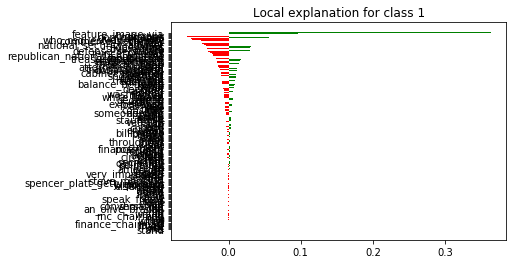

In [29]:
%matplotlib inline
fig = exp.as_pyplot_figure()

In [30]:
exp.show_in_notebook(text=True)

In [100]:
nb_model.steps[0]

AttributeError: 'GridSearchCV' object has no attribute 'steps'

In [ ]:
lr_model = pickle.load(open('./trained_models/lr_model_tfidf.sav', 'rb'))

In [ ]:
from nltk.corpus import stopwords

stop_words = stopwords.words("english")

In [ ]:
idx = 7
x_test[idx] = ' '.join([word for word in x_test[idx].split() if word not in stop_words])
exp_lr = explainer.explain_instance(x_test[idx], c.predict_proba,num_features=1000)
exp_lr.show_in_notebook(text=True)

In [ ]:
idx = 0
x_test[idx] = ' '.join([word for word in x_test[idx].split() if word not in stop_words])
exp_lr = explainer.explain_instance(x_test[idx], c.predict_proba,num_features=1000)
exp_lr.show_in_notebook(text=True)

## Debug black box example 2

lien : https://github.com/tsterbak/pydata2018-amsterdam/blob/master/presentation.ipynb
    
       https://www.youtube.com/watch?v=uCQtqzl8dn4
        

In [31]:
from sklearn.datasets import fetch_20newsgroups
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']
twenty_train = fetch_20newsgroups(subset='train', categories=categories, shuffle=True,
                                  random_state=42, remove=('headers', 'footers'))
twenty_test = fetch_20newsgroups(subset='test', categories=categories, shuffle=True,
                                 random_state=42, remove=('headers', 'footers'))

In [32]:
i = 125
print("Class: {}".format(twenty_train.target_names[twenty_train.target[i]]))
print("-"*20); print()
sample = twenty_train.data[i]; print(sample)

Class: alt.atheism
--------------------

In article <1993Apr3.153552.4334@mac.cc.macalstr.edu>, acooper@mac.cc.macalstr.edu writes:
|> In article <1pint5$1l4@fido.asd.sgi.com>, livesey@solntze.wpd.sgi.com (Jon Livesey) writes
>
> Well, Germany was hardly the ONLY country to discriminate against the 
> Jews, although it has the worst reputation because it did the best job 
> of expressing a general European dislike of them.  This should not turn 
> into a debate on antisemitism, but you should also point out that Luther's
>  antiSemitism was based on religious grounds, while Hitler's was on racial 
> grounds, and Wagnmer's on aesthetic grounds.  Just blanketing the whole 
> group is poor analysis, even if they all are bigots.

I find these to be intriguing remarks.   Could you give us a bit
more explanation here?   For example, which religion is anti-semitic,
and which aesthetic?


In [1]:

import numpy as np
from scipy.spatial import distance
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [34]:
# LSA features
vec = TfidfVectorizer(min_df=3, stop_words='english', ngram_range=(1, 2))
svd = TruncatedSVD(n_components=100, n_iter=7, random_state=42)
lsa = make_pipeline(vec, svd)

# SVM with rbf-kernel
clf = SVC(C=150, gamma=2e-2, probability=True, kernel="rbf")
text_clf = make_pipeline(lsa, clf)

text_clf.fit(twenty_train.data, twenty_train.target)
print("Accuracy: {:.1%}".format(text_clf.score(twenty_test.data, twenty_test.target)))

Accuracy: 89.0%


### Let's explain the predictions of this model

In [36]:
import random

def get_perturbed_sample(sample):
    '''Sample words from the text sample uniformly.'''
    words = sample.split(" ")
    n_words = random.randrange(0, len(words))
    idx = random.sample(list(range(0,len(words))), k=n_words)
    return " ".join([words[i] for i in sorted(idx)])

In [39]:
print(get_perturbed_sample(sample))

In article <1993Apr3.153552.4334@mac.cc.macalstr.edu>, writes:
|> In article <1pint5$1l4@fido.asd.sgi.com>, livesey@solntze.wpd.sgi.com (Jon Livesey) writes
>
> Well, Germany was hardly the country to discriminate the 
> Jews, although it has the reputation because it did best job of expressing a general European dislike them.  This not turn 
> into a debate on antisemitism, but you should also point out that Luther's
>  antiSemitism was based on religious grounds, while Hitler's was on racial 
> grounds, and Wagnmer's on grounds.  Just blanketing the whole 
> group is analysis, even they all are bigots.

I find these to be intriguing remarks.  Could you give us a bit
more explanation here?  For example, which anti-semitic,
and which aesthetic?


setup explainer model

In [99]:
explainer = Pipeline([
    ("BoW", CountVectorizer()),                       # interpretable representation
    ("selectK", SelectKBest(k=10, score_func=chi2)),  # limit the complexity of the explanation
    ("lr", LogisticRegression())                      # weighted interpretable model
])

Get a lot of perturbed samples and predict on them

In [41]:
perturbed_samples = [get_perturbed_sample(sample) for i in range(5000)]
perturbed_predictions = text_clf.predict(perturbed_samples)

Fit the explainer model on the predictions of the text classifier

In [43]:
vec = CountVectorizer(binary=True)
sigma = 1.0
samples_vec = vec.fit_transform(perturbed_samples); samples_vec = samples_vec.todense()
weights = np.nan_to_num([np.exp(-distance.cosine(vec.transform([sample]).todense()[0], s)**2 / sigma**2) for s in samples_vec])

C:\Users\DELL\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\spatial\distance.py:644: RuntimeWarning: invalid value encountered in double_scalars
  dist = 1.0 - uv / np.sqrt(uu * vv)


In [48]:
perturbed_samples[1]

"<1993Apr3.153552.4334@mac.cc.macalstr.edu>, acooper@mac.cc.macalstr.edu writes:\n|> In article <1pint5$1l4@fido.asd.sgi.com>, livesey@solntze.wpd.sgi.com (Jon Livesey) writes\n>\n> Well, Germany was hardly the ONLY country discriminate against the \n> Jews, although it the reputation because it did the best job \n> of expressing a general European dislike of them.  This should not turn \n> into a debate antisemitism, but should also out that  antiSemitism was based on religious grounds, while Hitler's was on racial \n> and Wagnmer's on aesthetic grounds.  blanketing the whole is analysis, even if they all are bigots.\n\nI find these intriguing remarks.   Could you give us a bit\nmore explanation here?   For example, which religion is anti-semitic,\nand which aesthetic?"

In [45]:
samples_vec

matrix([[0, 0, 0, ..., 0, 0, 0],
        [1, 1, 1, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        ...,
        [0, 0, 0, ..., 0, 0, 1],
        [0, 0, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1]], dtype=int64)

In [44]:
weights

array([0.50337765, 0.99796479, 0.94991829, ..., 0.86961188, 0.98821789,
       0.99747473])

In [49]:
explainer.fit(perturbed_samples, perturbed_predictions, lr__sample_weight=weights)

C:\Users\DELL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\DELL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


Pipeline(memory=None,
     steps=[('BoW', CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), preprocessor=None, stop_words=None,
        strip_...penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False))])

How well does it approximate the black-box model?

In [50]:
new_pert_samples = [get_perturbed_sample(sample) for i in range(1000)]
print("Score: {:.1%}".format(explainer.score(new_pert_samples, text_clf.predict(new_pert_samples))))

Score: 89.4%


Now get the important features/words

In [56]:
nv_vocab = {v: k for k, v in explainer.steps[0][1].vocabulary_.items()}


In [57]:
important_words = [nv_vocab[i] for i in explainer.steps[1][1].pvalues_.argsort()[:10][::-1]]

In [58]:
important_words

['it',
 'article',
 'writes',
 'was',
 'grounds',
 'livesey',
 'sgi',
 'com',
 'on',
 'the']

In [75]:
twenty_train.target_names

['alt.atheism', 'comp.graphics', 'sci.med', 'soc.religion.christian']

In [59]:
p = explainer.predict_proba([sample])[0]
for c in explainer.steps[2][1].classes_:
    print("> {}".format(twenty_train.target_names[c]))
    print(f"probability: {p[c]:.1%}"); print("-"*20)
    for w, v in zip(important_words, explainer.steps[2][1].coef_[c]):
        print(f"{w}: {v:.3}")
    print()

> alt.atheism
probability: 100.0%
--------------------
it: 1.01
article: 2.09
writes: 0.314
was: 0.328
grounds: 2.34
livesey: 0.142
sgi: 2.09
com: 0.15
on: 0.388
the: 1.55

> comp.graphics
probability: 0.0%
--------------------
it: -0.887
article: -1.63
writes: -0.285
was: -0.34
grounds: -1.4
livesey: -0.23
sgi: -1.63
com: 0.0686
on: -0.201
the: -1.0

> sci.med
probability: 0.0%
--------------------
it: 0.109
article: -1.57
writes: 0.0205
was: -0.173
grounds: -2.57
livesey: -0.107
sgi: -1.57
com: -0.317
on: -0.274
the: -0.774

> soc.religion.christian
probability: 0.0%
--------------------
it: -1.47
article: -1.36
writes: -0.306
was: 0.163
grounds: -1.5
livesey: 0.329
sgi: -1.36
com: -0.314
on: -0.28
the: -1.71



### Test Black Box on our own exampe

In [31]:
from sklearn.naive_bayes import MultinomialNB
explainer = Pipeline([
    ('tfidf', TfidfVectorizer()), ('nb', MultinomialNB())            
])

In [8]:

explainer.fit(x_train,y_train)

Pipeline(memory=None,
     steps=[('tfidf', TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.float64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm='l2', preprocessor=None, smooth_idf=True,...True,
        vocabulary=None)), ('nb', MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))])

In [101]:
explainer.fit(testing,testing_l)

Pipeline(memory=None,
     steps=[('tfidf', TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.float64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm='l2', preprocessor=None, smooth_idf=True,...True,
        vocabulary=None)), ('nb', MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))])

In [108]:
inv_vocab = {v: k for k, v in explainer.steps[0][1].vocabulary_.items()}


In [33]:
explainer.steps[0][1].get_feature_names()

['_ambassador',
 'always',
 'americans',
 'and',
 'announce',
 'as',
 'assessment',
 'be',
 'benghazi',
 'between',
 'big',
 'campus',
 'christopher_stevens',
 'desire',
 'email',
 'email_s',
 'fbi',
 'former',
 'have',
 'hillary_clinton',
 'honest',
 'in',
 'include',
 'intelligence_analyst',
 'into',
 'iraq_war',
 'kill',
 'latter',
 'leafy',
 'liberal',
 'look',
 'massachusetts',
 'may',
 'often',
 'on',
 'overwhelm',
 'policymaker',
 'political',
 'relate',
 'remain',
 'result',
 'tension_between',
 'terrorist_attack',
 'that',
 'the',
 'they',
 'to',
 'wellesley',
 'with',
 'woman']

In [ ]:

 
# just send in all your docs here
fitted_vectorizer=explainer.steps[0][1].fit(x_train)
tfidf_vectorizer_vectors=fitted_vectorizer.transform(x_train)

In [22]:
df = pd.DataFrame(explainer.steps[0][1].fit_transform([x_train[2]]).T.todense(), index=explainer.steps[0][1].get_feature_names(), columns=["tfidf"])
#inverse_transform(x_train)
df.sort_values(by=["tfidf"],ascending=False)

,tfidf
the,0.596302
of,0.361141
pron,0.327546
to,0.260357
be,0.243560
and,0.193168
mr,0.176371
in,0.176371
israel,0.159574
for,0.134378


In [84]:
df = pd.DataFrame(explainer.steps[0][1].fit_transform([testing[0]]).T.todense(), index=explainer.steps[0][1].get_feature_names(), columns=["tfidf"])
#inverse_transform(x_train)
df = df.sort_values(by=["tfidf"],ascending=False)

In [89]:
explainer.steps[0][1].idf_

array([1.91629073, 1.91629073, 1.91629073, 1.91629073, 1.91629073,
       1.91629073, 1.91629073, 1.22314355, 1.91629073, 1.91629073,
       1.91629073, 1.91629073, 1.91629073, 1.91629073, 1.91629073,
       1.91629073, 1.91629073, 1.91629073, 1.91629073, 1.51082562,
       1.91629073, 1.22314355, 1.91629073, 1.91629073, 1.91629073,
       1.91629073, 1.91629073, 1.91629073, 1.91629073, 1.91629073,
       1.91629073, 1.91629073, 1.91629073, 1.91629073, 1.91629073,
       1.91629073, 1.91629073, 1.91629073, 1.91629073, 1.91629073,
       1.91629073, 1.91629073, 1.91629073, 1.91629073, 1.22314355,
       1.91629073, 1.91629073, 1.91629073, 1.91629073, 1.91629073])

In [100]:
len(explainer.steps[0][1].get_feature_names())

50

In [85]:
df.transpose()

,in,_ambassador,americans,be,benghazi,christopher_stevens,include,kill,terrorist_attack
tfidf,0.57735,0.288675,0.288675,0.288675,0.288675,0.288675,0.288675,0.288675,0.288675


In [71]:
txt=[]
txt.append('Son nom est célébré par le bocage qui frémit, et par le ruisseau qui murmure, les vents l’emportent jusqu’à l’arc céleste, l’arc de grâce et de consolation que sa main tendit dans les nuages.')
txt.append('À peine distinguait-on deux buts à l’extrémité de la carrière : des chênes ombrageaient l’un, autour de l’autre des palmiers se dessinaient dans l’éclat du soir.')
txt.append('Ah ! le beau temps de mes travaux poétiques ! les beaux jours que j’ai passés près de toi ! Les premiers, inépuisables de joie, de paix et de liberté ; les derniers, empreints d’une mélancolie qui eut bien aussi ses charmes.')

In [72]:
explainer.fit(txt,[0,0,1])

Pipeline(memory=None,
     steps=[('tfidf', TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.float64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm='l2', preprocessor=None, smooth_idf=True,...True,
        vocabulary=None)), ('nb', MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))])

In [73]:
df = pd.DataFrame(explainer.steps[0][1].fit_transform([txt[0]]).T.todense(), index=explainer.steps[0][1].get_feature_names(), columns=["tfidf"])
#inverse_transform(x_train)
df = df.sort_values(by=["tfidf"],ascending=False)

In [75]:
df.transpose()

,arc,de,qui,par,les,et,le,emportent,est,tendit,...,nom,murmure,main,célébré,bocage,jusqu,grâce,frémit,dans,vents
tfidf,0.288675,0.288675,0.288675,0.288675,0.288675,0.288675,0.288675,0.144338,0.144338,0.144338,...,0.144338,0.144338,0.144338,0.144338,0.144338,0.144338,0.144338,0.144338,0.144338,0.144338


In [67]:
len(inv_vocab)

182368

In [94]:
explainer.steps[1][1].coef_[0]

array([-10.81269799, -11.12316759, -12.38247349, ..., -12.44968929,
       -12.43404542, -12.44244549])

In [95]:
p = explainer.predict_proba(x_test)[1]
for c in explainer.steps[1][1].classes_:
    print("> {}".format(c))
    
   
    
    print(f"probability: {p[c]:.1%}"); print("-"*20)
   
    for w, v in zip(inv_vocab, explainer.steps[1][1].coef_[0]):
        print(f"{w}: {v:.3}")
    print()
    

> 0
probability: 59.0%
--------------------
128737: -10.8
102229: -11.1
128739: -12.4
154482: -12.4
113411: -12.5
16543: -12.3
12927: -12.4
147866: -12.5
87631: -12.4
101421: -12.3
106755: -12.4
156323: -12.4
139094: -12.5
5294: -12.5
43165: -12.2
30504: -12.4
142690: -12.5
144369: -11.8
13335: -11.5
65101: -12.2
136346: -11.6
102934: -12.5
86751: -12.5
54150: -12.2
156467: -12.2
8897: -12.5
49525: -12.4
132586: -12.2
132096: -12.4
9435: -11.3
98948: -12.3
126901: -12.3
24749: -12.3
154793: -12.4
16695: -12.4
131937: -12.4
110551: -12.5
67672: -12.2
17195: -12.3
28721: -11.0
119590: -12.5
141278: -12.4
132058: -12.4
4551: -12.4
112235: -12.4
69902: -12.4
102204: -12.3
27314: -11.0
136796: -12.3
8042: -12.4
16920: -12.4
115518: -12.4
67648: -11.7
78236: -12.5
57040: -12.4
13849: -11.2
75842: -12.5
7052: -12.5
125989: -12.5
49997: -12.3
141252: -12.4
8489: -11.9
99874: -12.2
102457: -12.5
128176: -12.5
104033: -11.1
39871: -12.4
23089: -12.4
56050: -10.8
146993: -12.3
44915: -10.8
111899

163323: -12.5
163703: -12.4
166861: -12.4
165146: -12.5
164549: -12.1
165858: -12.3
163687: -12.5
163095: -12.5
168886: -11.8
172176: -12.5
178498: -12.5
179236: -12.5
163683: -12.5
161368: -12.4
178459: -12.5
163177: -12.5
164301: -12.5
179642: -12.5
168056: -12.5
163394: -12.5
160160: -12.5
68615: -12.5
45577: -12.5
162729: -12.5
166975: -12.5
167163: -12.5
161341: -12.5
164708: -12.5
163418: -11.6
165311: -12.5
178862: -12.5
177662: -12.5
164577: -12.5
169863: -12.5
176394: -12.1
175450: -12.5
165121: -12.1
168973: -12.5
178430: -12.5
161613: -12.5
174173: -12.5
163169: -12.4
170208: -12.3
176762: -12.5
160074: -11.5
174341: -12.5
166675: -12.5
94816: -12.5
127986: -11.9
85405: -12.5
47066: -12.5
164511: -12.3
162704: -12.5
163401: -12.5
167965: -12.5
165299: -12.5
178531: -12.5
177473: -12.5
164828: -12.5
164480: -12.5
163290: -12.4
163685: -12.2
166412: -12.1
164161: -12.5
172724: -12.5
178202: -12.5
168573: -12.5
173264: -12.5
169859: -12.5
165112: -12.5
171518: -12.5
172251: -12

87717: -12.5
79882: -12.4
41931: -12.4
96263: -12.4
26337: -12.5
99062: -12.4
41757: -12.5
73243: -11.8
90352: -12.4
57284: -12.4
41776: -12.2
19066: -12.0
57285: -12.4
7093: -12.3
112097: -12.5
21600: -12.4
72026: -12.3
109483: -12.5
114860: -12.2
29233: -12.3
77230: -12.0
10502: -11.5
26953: -12.4
148012: -11.9
109840: -12.5
106290: -12.1
101193: -11.7
86972: -12.4
4625: -12.5
137764: -12.3
135501: -11.7
46083: -12.2
57860: -12.4
43114: -12.1
122844: -12.5
77095: -12.4
77025: -12.5
129215: -12.4
129124: -12.5
81177: -12.5
124995: -12.5
14906: -12.4
96481: -10.8
42480: -12.5
150744: -12.5
148428: -12.5
153655: -12.5
137885: -12.4
50041: -12.4
67962: -12.5
96944: -12.5
40588: -11.7
135854: -12.5
67785: -12.4
143115: -12.5
53768: -12.5
143682: -11.5
141915: -12.5
46539: -12.5
78678: -12.3
61046: -12.0
47340: -12.5
54991: -12.3
25499: -12.5
20558: -12.4
54844: -12.1
97249: -12.4
41814: -12.5
38065: -12.4
1685: -12.5
8462: -12.4
42073: -12.5
121776: -12.5
74917: -12.4
109027: -12.4
152356

76723: -12.5
32998: -12.4
132424: -12.5
31893: -12.5
118290: -12.4
147755: -12.4
145424: -12.5
92013: -12.5
100288: -12.5
66690: -12.5
130018: -12.5
49869: -12.4
31164: -12.2
107269: -12.5
57220: -12.4
139303: -12.3
148873: -12.2
112545: -12.5
142855: -12.5
72278: -12.5
144846: -12.4
63024: -12.3
14468: -12.5
123924: -12.5
147085: -12.5
25404: -12.5
140098: -12.4
150725: -12.3
7540: -12.5
118291: -12.5
122543: -12.1
148683: -12.5
5066: -12.5
153321: -12.1
35305: -12.5
120625: -12.5
4750: -12.5
111164: -12.5
32192: -12.2
126545: -12.5
122770: -12.5
124587: -10.7
6362: -12.0
139759: -12.4
157061: -12.5
25921: -12.4
113238: -12.5
140512: -12.5
37405: -12.4
153411: -12.5
27364: -12.5
33148: -12.4
9007: -12.5
55386: -12.5
107383: -12.5
137175: -12.5
86066: -12.5
131476: -12.5
144457: -12.4
83992: -12.4
31157: -12.5
73323: -12.5
4066: -12.4
33142: -12.5
89592: -12.5
120242: -12.5
141270: -11.7
8798: -12.0
103812: -12.5
1787: -12.3
40211: -12.4
20521: -12.3
89618: -12.3
116053: -12.5
126926: 

151559: -11.9
147560: -12.2
36622: -12.5
12749: -12.2
4098: -12.1
50167: -12.0
30897: -12.4
30492: -12.5
42816: -12.5
106023: -12.5
113651: -12.4
21361: -12.2
85858: -12.4
85857: -12.4
87592: -12.4
138824: -12.5
63068: -12.5
84225: -12.5
19217: -12.5
78255: -8.88
105095: -12.2
29989: -11.4
104024: -12.4
66560: -12.2
123600: -12.2
13894: -12.3
120825: -12.4
85714: -12.1
34421: -12.2
107336: -12.2
97893: -12.3
18514: -12.3
28237: -12.3
130895: -12.3
64062: -12.5
142071: -12.5
110328: -12.5
16704: -12.4
97858: -12.5
95758: -12.4
46741: -12.5
51596: -12.4
89563: -12.4
26259: -12.3
95251: -12.3
52643: -12.2
62302: -12.1
94039: -12.2
120028: -12.4
85851: -12.5
68988: -12.4
141923: -12.4
114777: -12.4
73735: -12.5
26022: -12.4
8219: -12.4
8881: -12.4
81575: -12.4
126122: -12.4
13268: -12.4
13890: -12.5
105600: -12.5
147403: -12.5
153842: -12.5
153138: -12.5
63214: -12.2
90504: -12.5
71015: -12.5
45850: -12.5
117103: -12.5
104483: -12.5
122282: -12.5
121580: -12.5
58215: -12.4
47691: -12.4
715

44171: -12.4
135660: -12.4
9339: -12.4
102220: -12.5
49594: -12.5
83271: -12.4
60060: -12.5
102830: -12.5
142905: -12.1
13031: -11.5
99227: -12.0
126603: -10.8
138270: -12.4
138272: -12.5
30407: -12.4
74160: -12.4
44258: -12.3
111245: -12.5
137157: -12.4
99796: -12.4
4786: -12.1
111729: -12.5
147802: -12.5
90849: -12.2
28892: -12.4
58547: -12.5
140482: -12.4
108491: -12.4
74554: -12.4
44349: -12.5
5432: -12.5
135875: -12.4
86942: -12.5
86402: -12.4
138003: -12.2
114799: -12.5
100379: -11.6
119902: -12.3
119903: -12.5
126222: -12.5
4277: -11.6
113872: -12.5
15412: -12.1
6168: -12.3
94267: -12.5
143979: -12.4
130057: -12.4
104088: -12.2
81554: -12.4
70607: -10.7
123227: -10.3
89885: -11.9
10683: -12.3
123167: -12.4
127838: -12.5
129647: -11.3
97012: -12.5
114944: -12.1
150100: -12.5
92552: -12.4
72132: -12.5
123200: -12.0
150828: -12.4
118280: -12.5
5515: -12.5
99778: -12.5
97021: -12.5
102690: -9.84
101229: -12.2
99006: -12.4
154230: -12.4
101470: -12.5
37283: -12.4
123148: -12.5
80224:

109639: -12.5
27983: -12.3
133463: -12.5
7921: -12.5
49751: -12.3
42124: -12.5
114688: -11.3
47272: -12.3
32137: -12.5
21136: -12.5
98321: -12.4
154739: -12.3
50082: -11.0
148649: -12.5
109019: -12.5
4377: -12.5
19318: -12.5
124233: -12.5
69980: -12.3
111232: -12.5
34319: -12.4
58211: -12.1
122336: -12.5
82727: -12.4
111295: -12.5
40878: -12.4
83235: -12.4
148651: -12.3
40204: -12.5
117051: -12.5
111994: -12.4
59797: -12.5
145248: -12.5
145252: -12.5
156608: -12.3
28945: -12.3
117229: -12.5
147633: -12.4
127188: -12.5
93853: -12.4
74846: -12.5
65107: -12.5
11639: -12.5
139797: -12.5
137248: -12.3
56327: -12.5
58154: -12.3
152099: -12.5
108800: -12.5
82752: -12.4
151539: -12.5
83325: -12.5
69509: -12.5
126178: -12.1
147531: -12.5
82519: -12.4
123991: -12.5
64979: -12.2
24553: -12.4
11228: -12.5
51691: -12.5
130388: -12.5
108914: -12.3
142460: -12.5
69377: -12.2
74276: -12.5
112014: -12.5
41041: -12.5
17255: -12.4
31003: -12.5
89969: -12.5
121839: -12.5
34974: -12.4
125000: -12.5
108243:

126591: -12.2
87896: -12.5
57395: -12.4
78079: -12.5
38293: -12.5
50026: -10.7
109439: -12.3
18368: -12.4
126861: -12.3
75457: -11.8
95164: -12.5
93947: -12.5
48879: -12.4
58196: -12.5
16307: -10.5
98950: -12.3
27294: -12.5
15899: -12.5
100992: -12.5
31234: -12.5
29759: -12.5
86292: -12.5
69554: -12.5
153019: -12.4
33923: -12.2
59072: -12.5
54404: -12.4
143410: -12.5
106028: -12.4
141458: -12.5
97604: -12.4
89219: -12.5
99017: -12.5
103571: -12.4
58610: -12.4
146282: -11.8
123142: -12.5
10279: -12.5
115930: -12.5
60113: -12.3
106069: -12.4
139729: -12.4
8400: -12.4
32652: -12.5
132927: -12.5
93957: -12.5
46849: -12.5
34468: -12.5
111339: -12.4
126138: -12.5
133861: -12.5
110360: -12.2
93207: -12.4
122434: -12.4
148767: -12.5
26800: -12.3
71122: -12.5
157482: -12.5
48261: -12.5
144602: -12.5
49963: -8.96
153990: -12.3
42390: -12.5
61407: -11.7
32666: -12.5
123309: -12.5
91484: -12.3
108266: -11.9
13874: -12.4
109343: -12.2
36567: -12.2
85466: -12.0
151808: -12.1
144813: -12.2
140030: -1

58530: -12.2
78378: -12.5
128593: -12.4
133104: -12.5
104883: -12.5
8316: -12.5
97258: -12.3
146438: -12.2
24486: -12.5
11245: -12.5
115244: -12.5
168: -12.5
52559: -12.4
106928: -12.4
124523: -12.5
46619: -12.5
91073: -12.5
186: -12.5
76415: -12.5
7832: -11.6
144029: -12.4
143932: -12.0
100223: -12.4
80973: -12.5
12690: -12.4
28616: -12.4
73636: -10.4
77369: -12.5
144022: -12.5
134690: -12.1
99938: -12.2
21627: -12.4
81352: -12.4
119896: -12.5
83156: -11.5
49208: -12.5
74727: -12.2
43606: -12.3
134626: -12.4
34631: -12.5
9579: -11.9
143898: -12.4
20826: -12.2
130410: -12.4
70302: -12.4
27791: -12.5
11010: -12.5
91184: -12.3
151605: -12.5
82474: -12.5
106730: -12.5
158829: -12.4
51429: -12.5
113710: -12.5
74828: -12.5
54262: -12.5
29340: -11.6
105021: -12.5
131752: -12.5
47130: -12.5
9414: -12.5
50907: -12.5
130494: -12.5
141618: -12.5
72118: -12.5
93494: -12.4
24391: -12.2
50038: -12.3
133357: -12.4
19172: -12.4
12864: -12.5
137522: -12.5
102143: -8.93
135888: -12.3
95840: -12.2
13004

142307: -12.1
42674: -12.2
120391: -12.5
53576: -12.1
137884: -12.2
114349: -12.2
15981: -12.4
114343: -12.3
22448: -11.1
127187: -12.5
126635: -12.3
61664: -12.3
5249: -12.3
23775: -12.2
132592: -12.5
13795: -12.4
35903: -12.5
126608: -12.5
61534: -12.5
41909: -12.4
102855: -12.5
89971: -12.3
63768: -12.3
127180: -12.5
85114: -12.4
137352: -10.9
22518: -12.5
130976: -12.3
119190: -12.5
147940: -12.4
21328: -12.1
56292: -12.5
53296: -11.9
38131: -12.5
58932: -12.5
117990: -12.5
120093: -12.5
97957: -12.0
104089: -12.3
60706: -12.5
124744: -12.5
156863: -11.1
156032: -12.3
32747: -12.2
130461: -12.5
134037: -12.5
15385: -12.4
127757: -7.6
11104: -11.1
14883: -11.0
37808: -11.9
84275: -12.4
108047: -12.5
15869: -12.4
77902: -12.5
64499: -12.5
125232: -11.7
110548: -12.5
44917: -12.3
76296: -12.4
49823: -12.4
91153: -12.5
105145: -12.5
83101: -12.5
28586: -12.5
31409: -12.5
28749: -11.6
103839: -12.5
29557: -12.5
51037: -11.3
75361: -12.5
127157: -11.7
63527: -12.0
4993: -12.5
19832: -12.

71743: -12.3
25224: -12.4
154633: -12.5
154653: -12.3
41535: -12.5
121589: -12.5
8573: -12.5
3673: -11.9
144071: -12.5
53437: -12.5
113697: -12.4
69870: -12.5
84508: -12.3
145043: -12.5
59831: -12.4
37794: -12.4
21021: -12.4
111599: -12.5
35170: -12.5
107141: -12.4
27431: -12.5
127909: -12.5
103976: -12.5
89648: -12.5
52881: -12.5
119171: -12.4
96479: -12.3
95457: -12.5
71142: -12.0
150753: -12.3
99215: -11.7
145023: -12.3
82901: -12.4
69914: -11.6
156382: -11.5
120608: -12.4
37793: -12.5
107065: -12.4
59850: -12.5
59858: -12.4
98738: -11.0
81523: -12.4
119666: -12.3
76974: -12.4
135777: -12.5
74563: -12.5
52977: -11.3
144727: -12.5
8142: -12.5
7644: -12.1
136384: -12.3
103070: -12.4
145450: -12.1
88140: -12.5
96706: -12.4
59722: -12.5
26885: -12.5
37668: -11.5
20768: -12.5
31299: -12.4
116718: -12.5
132771: -12.0
42434: -12.4
46673: -12.4
75778: -12.5
7914: -12.5
109808: -12.5
155686: -12.5
52978: -12.5
55193: -12.5
39721: -12.2
8691: -12.5
97719: -12.4
34640: -12.5
114712: -12.5
6316

171762: -12.5
167988: -12.5
168761: -12.3
180137: -12.5
160272: -12.3
176544: -12.4
167779: -12.4
178674: -12.1
172582: -12.2
169848: -12.4
160632: -12.0
167161: -12.1
166115: -12.5
168727: -12.4
170805: -12.3
178717: -12.1
174442: -12.5
179411: -12.5
175403: -12.4
168677: -12.4
177834: -12.5
168726: -12.4
175303: -12.5
171773: -12.1
161804: -12.5
173838: -12.5
166793: -12.2
174111: -12.4
170220: -12.4
177390: -12.5
161891: -12.5
166827: -12.5
166645: -12.5
178617: -11.5
168721: -12.1
173246: -12.5
162996: -12.5
160579: -12.5
173500: -12.5
175018: -12.5
178146: -12.5
171833: -12.5
171510: -11.7
173541: -12.0
175827: -12.3
171212: -9.67
175901: -12.3
160580: -11.9
169842: -12.5
169431: -12.5
174238: -12.2
171641: -12.4
163991: -12.5
170109: -12.5
179495: -12.5
172808: -11.8
160675: -12.5
171568: -12.3
160797: -12.5
176698: -12.2
163073: -12.5
162171: -12.5
151274: -12.5
178727: -12.4
164940: -12.5
171861: -12.5
175506: -12.5
176474: -12.4
176821: -12.4
175793: -12.5
177664: -11.3
163623

11972: -12.5
108943: -12.4
140924: -12.4
159113: -12.5
25749: -12.4
78328: -12.4
34367: -12.5
99707: -12.5
10538: -12.5
136142: -12.4
67875: -12.4
38369: -11.1
8743: -12.3
31899: -12.4
142241: -12.5
19139: -12.4
154634: -12.5
45693: -12.4
96541: -12.4
91448: -11.9
8744: -12.5
49841: -12.5
147055: -12.2
82871: -12.4
152915: -12.5
109596: -11.1
103974: -12.2
126247: -12.5
97289: -12.5
30737: -12.4
103073: -12.4
84919: -12.5
153981: -12.4
66289: -12.5
119738: -12.3
37531: -12.1
55235: -12.0
18013: -12.5
95648: -12.5
112357: -12.5
71261: -11.5
37510: -11.8
67961: -11.9
106285: -12.5
90884: -11.5
122227: -11.9
62794: -12.5
101104: -12.5
114566: -12.5
32762: -12.4
149855: -12.5
148099: -10.7
69934: -12.0
102879: -12.3
25385: -12.5
86243: -12.3
114163: -12.3
62328: -12.5
141647: -12.5
103604: -12.4
116978: -12.3
102460: -9.5
113209: -10.7
131674: -12.2
115691: -12.4
39540: -12.4
85854: -11.0
31476: -10.9
85852: -12.2
154564: -12.4
10418: -12.5
59945: -12.5
55708: -12.2
25901: -12.2
39541: -12

136770: -12.1
96662: -12.3
96636: -11.4
31317: -12.5
61571: -8.27
127981: -12.3
80060: -12.5
78548: -12.2
84052: -12.5
73348: -12.4
64249: -12.1
99136: -12.4
67062: -11.7
21087: -12.5
132984: -12.5
9005: -12.3
105872: -12.5
85142: -10.1
90233: -12.5
150671: -12.1
87633: -12.2
77567: -12.5
120614: -12.4
53681: -12.5
148304: -12.3
124767: -12.4
8385: -12.3
142808: -12.5
146753: -12.5
112983: -12.3
135527: -12.5
118274: -12.4
52678: -12.2
52249: -12.2
152930: -12.5
144410: -12.4
34332: -12.3
82053: -12.3
48736: -10.3
22751: -12.0
107261: -11.7
67145: -12.5
138285: -12.4
36940: -12.3
7993: -12.2
67676: -12.5
96235: -12.4
142853: -10.0
112517: -12.4
119920: -12.5
80321: -12.5
20369: -12.5
139138: -12.4
56748: -12.5
21862: -12.3
148588: -12.0
107761: -12.5
143273: -12.3
110857: -12.5
114275: -12.4
78430: -10.9
119931: -11.9
85738: -12.3
131042: -12.4
105161: -12.5
61255: -12.4
83410: -12.3
27398: -12.5
144755: -12.4
41396: -12.5
16997: -12.5
20297: -12.4
5663: -9.15
52048: -12.4
88807: -12.5

52829: -12.4
128078: -12.1
142032: -12.0
96197: -12.4
75912: -12.5
49082: -12.4
60453: -12.5
53419: -12.5
131497: -12.5
68239: -12.5
61246: -12.5
132733: -12.5
115218: -11.8
21140: -12.5
89630: -12.5
61213: -12.5
27639: -12.5
42239: -12.5
47754: -12.2
8964: -12.5
118903: -12.4
29164: -12.5
91967: -12.5
23125: -12.4
106742: -12.5
81295: -12.5
90603: -12.5
92399: -12.5
86885: -12.5
130884: -12.5
11919: -12.5
112254: -12.5
95282: -12.1
94328: -12.5
145778: -12.5
125105: -12.4
27683: -12.3
57488: -12.5
21864: -12.4
128804: -11.2
121630: -12.5
54742: -12.1
27645: -12.4
118865: -12.3
131437: -12.4
18371: -12.1
135438: -12.5
87970: -12.4
77947: -12.1
154732: -12.1
153559: -12.5
11992: -12.5
68801: -12.5
117130: -12.4
24541: -12.4
30433: -12.4
18363: -12.5
63425: -12.5
132336: -12.4
91802: -12.4
33263: -12.5
61098: -12.5
7147: -12.5
118895: -12.5
133590: -12.4
31060: -12.4
52935: -12.5
103009: -12.5
61209: -12.5
63151: -11.6
59924: -12.4
158348: -12.5
68800: -12.1
131137: -12.5
96413: -12.3
45

9640: -12.4
32956: -12.4
107509: -12.2
42589: -12.2
114481: -12.5
103500: -10.6
98085: -12.3
74976: -12.2
13275: -12.4
85982: -12.2
114480: -12.5
60819: -12.5
106256: -12.5
30413: -12.5
51796: -12.3
11781: -12.5
51047: -12.5
128139: -12.5
45254: -12.4
42033: -12.5
105337: -12.4
32501: -12.5
114482: -12.4
97576: -12.4
116269: -12.4
29936: -12.5
87782: -12.4
5237: -12.2
110151: -12.5
54253: -12.5
137281: -12.5
55614: -12.2
45223: -12.5
124479: -12.5
87899: -12.5
21105: -12.3
15124: -12.5
102681: -12.3
4192: -12.5
7799: -12.5
154573: -12.5
15914: -12.5
115098: -10.9
10378: -12.5
92865: -12.5
82898: -12.4
92866: -12.3
78067: -12.5
17070: -12.3
45877: -12.4
103868: -12.4
96284: -11.9
76617: -12.3
107748: -12.4
127847: -12.5
99654: -12.2
51995: -11.8
70333: -12.2
28723: -12.1
37215: -12.5
116802: -12.2
29883: -12.3
37584: -12.2
116283: -12.5
72113: -12.4
67351: -11.9
65801: -11.9
146900: -11.7
145044: -12.5
77948: -11.9
33019: -12.5
139857: -12.5
20523: -12.4
46287: -12.4
92764: -12.4
40526:

40916: -12.3
30156: -12.3
71010: -12.4
142627: -12.4
108442: -12.5
70340: -12.4
104231: -12.5
127415: -12.5
2901: -12.5
54545: -12.4
47376: -12.3
24076: -12.4
82253: -12.4
2876: -12.4
153106: -12.5
96888: -12.5
21283: -12.5
124318: -12.4
62410: -12.4
81733: -12.3
130292: -12.4
88350: -12.5
149025: -12.5
141654: -12.5
10087: -12.5
20727: -12.5
153468: -12.5
149653: -10.7
32840: -11.8
118107: -12.5
101219: -12.4
133105: -11.9
109532: -12.5
35137: -12.4
115473: -12.4
111443: -12.5
128553: -12.5
82728: -12.5
29697: -11.9
146722: -12.5
18311: -12.4
54971: -12.5
18310: -12.5
158501: -12.4
106988: -12.4
34065: -12.5
153756: -12.2
74477: -12.4
23315: -12.4
153722: -12.3
8236: -12.3
56170: -12.4
19897: -12.4
127364: -12.2
158054: -12.5
78071: -12.5
27708: -12.5
105029: -12.5
53930: -12.4
119731: -12.5
17450: -12.5
144367: -12.5
54916: -12.2
24065: -12.5
65253: -12.4
67538: -12.5
27262: -12.4
37652: -12.5
83481: -12.1
135295: -11.7
80304: -12.5
43536: -12.4
68018: -12.5
14951: -12.5
108011: -12.

8996: -12.3
79702: -12.4
14007: -12.5
25197: -12.4
9083: -12.3
57562: -12.4
27151: -12.5
80588: -12.3
130133: -12.5
70822: -12.5
12654: -11.2
130209: -11.8
124289: -11.6
147715: -12.0
93969: -12.5
107140: -12.5
156656: -12.5
117255: -12.5
53833: -12.5
55070: -12.5
96735: -12.5
81082: -8.94
120449: -11.6
27265: -12.3
135420: -12.3
15895: -12.2
134376: -12.5
146809: -12.4
85921: -12.4
149880: -12.3
30680: -12.3
136035: -12.5
82684: -12.4
20635: -12.5
147446: -12.5
140130: -12.5
145103: -11.9
131347: -12.3
22580: -12.5
123106: -12.1
135161: -12.5
70418: -12.5
30622: -12.2
103218: -12.5
107528: -12.5
88213: -12.3
5884: -12.0
141480: -12.5
155328: -12.5
149218: -12.5
88089: -12.4
49054: -10.7
82911: -12.2
102607: -12.2
64894: -12.2
30368: -12.4
81283: -12.5
4716: -12.5
40413: -12.3
16705: -11.5
38763: -12.3
72746: -12.5
22660: -11.8
153058: -12.5
35820: -12.4
119243: -12.4
128054: -12.5
13899: -11.9
117474: -12.4
102444: -12.5
143599: -12.5
87533: -12.5
107930: -12.5
114426: -12.4
109521: -

3810: -12.4
141715: -12.5
18035: -12.5
105362: -12.0
84206: -11.8
134829: -11.7
141106: -12.0
143099: -12.5
29497: -11.8
40300: -12.5
104186: -12.3
24932: -12.4
62317: -12.5
122771: -9.3
67660: -12.5
89734: -12.4
80154: -12.3
154505: -12.5
21359: -12.5
68556: -12.5
27756: -12.5
143557: -12.4
43216: -12.3
79795: -12.5
79727: -12.3
127398: -12.5
85600: -12.5
128038: -12.5
106750: -12.4
170: -12.5
34525: -12.4
5442: -12.4
99690: -12.5
92957: -12.5
48985: -12.2
36132: -12.5
141352: -12.5
1418: -12.3
1417: -12.4
65099: -12.4
60532: -12.5
58251: -12.4
482: -12.4
11885: -12.4
44916: -12.5
106934: -12.4
23226: -12.4
76719: -12.4
88013: -12.4
27713: -12.5
47164: -12.3
23807: -12.5
147027: -12.1
93316: -12.3
132758: -12.3
155911: -12.5
46470: -12.5
85635: -12.5
114767: -12.4
29602: -12.4
95518: -12.4
95515: -12.5
97899: -12.4
85223: -12.5
109252: -12.2
83535: -12.5
125409: -11.0
23883: -12.5
52630: -12.5
151705: -12.2
133378: -12.3
9365: -12.4
84834: -12.5
84802: -12.5
129513: -12.5
44235: -12.5

71679: -12.5
95209: -12.5
129242: -12.4
40412: -12.5
90033: -12.0
53461: -12.4
126444: -12.5
47343: -12.4
137749: -12.4
65708: -12.5
23932: -12.5
139404: -12.5
59286: -12.5
120759: -12.4
19242: -12.4
134150: -12.1
22059: -12.5
24976: -12.5
54343: -12.4
4646: -12.5
140715: -12.4
23480: -12.5
26362: -12.5
134560: -12.5
116229: -12.4
64824: -12.4
97098: -10.7
105242: -12.3
45130: -12.5
112292: -12.5
81524: -12.5
138293: -12.4
81474: -12.0
2703: -12.5
71677: -12.4
71681: -12.4
42670: -12.4
131500: -12.5
68864: -11.5
71249: -12.0
78428: -12.3
42529: -12.2
127307: -12.5
77392: -12.3
154207: -12.5
23192: -12.5
55446: -12.4
44749: -12.5
67572: -12.5
61024: -12.4
108262: -12.3
44249: -12.5
55261: -12.5
23023: -12.5
156632: -12.5
156041: -12.4
95281: -12.4
11930: -12.5
127287: -12.4
78512: -12.5
121800: -12.4
5876: -12.3
2733: -12.4
124563: -12.4
36073: -12.4
67056: -12.4
156803: -12.5
62018: -12.4
130463: -12.4
85648: -12.4
68477: -12.4
80265: -12.5
78987: -12.4
125667: -12.4
121810: -12.3
1224

7286: -11.9
90227: -11.6
107441: -12.5
104385: -12.4
65198: -12.5
104514: -12.2
34950: -12.3
138709: -11.7
29807: -12.5
132044: -12.5
90440: -10.8
93686: -12.5
112045: -12.5
72899: -12.5
85607: -11.1
60940: -12.4
102708: -12.2
74486: -12.4
24626: -12.5
96764: -9.65
107853: -11.3
41034: -12.3
44911: -12.4
102403: -11.7
35079: -12.0
21285: -12.4
154858: -12.5
41995: -12.4
23511: -12.2
91171: -12.4
3563: -12.5
142555: -12.4
55462: -11.1
49279: -12.4
101991: -11.9
130280: -12.5
153381: -12.5
92403: -12.5
56479: -12.3
35182: -12.3
44926: -12.4
62483: -12.5
56002: -12.5
73730: -12.5
17432: -9.73
51289: -12.4
22895: -12.3
88530: -12.2
113512: -11.8
41320: -12.1
118934: -12.3
52972: -12.4
61216: -12.4
71012: -11.8
72148: -12.4
38282: -12.4
93984: -12.4
4247: -12.2
144753: -11.6
25464: -12.4
69445: -12.5
128412: -12.5
17686: -12.5
34553: -12.3
39963: -12.4
27894: -11.2
10588: -12.5
73263: -12.5
113332: -9.29
60625: -10.9
9655: -10.6
61144: -12.4
2472: -12.5
120944: -12.4
110713: -12.4
81643: -1

145267: -12.2
10261: -12.5
155282: -12.5
156674: -12.4
145953: -12.2
44968: -12.4
111618: -12.4
142227: -11.9
22436: -12.3
129419: -12.5
134949: -12.5
50777: -11.9
89420: -12.4
91950: -12.4
155281: -12.2
26465: -12.1
26921: -12.3
33390: -12.5
94012: -12.1
89489: -12.4
102096: -10.9
8973: -12.5
63924: -12.3
122765: -12.0
109684: -12.4
118379: -12.5
134013: -12.2
92169: -12.5
99884: -11.7
109312: -12.4
21822: -12.5
102026: -12.3
50255: -12.2
78524: -12.5
157938: -12.5
129390: -9.41
63724: -12.2
12694: -12.4
123867: -11.9
77949: -12.4
21542: -12.5
2053: -12.5
86685: -11.7
82018: -12.2
116212: -12.5
11685: -12.4
155892: -12.5
155914: -12.3
44621: -12.0
116221: -12.5
24870: -12.4
29347: -12.4
29341: -12.3
29804: -12.3
104070: -12.4
148140: -12.5
16750: -12.3
69197: -12.3
81465: -12.2
111535: -12.2
22679: -12.3
86011: -11.9
40525: -12.4
55259: -11.8
20040: -12.5
56362: -12.5
126680: -11.9
32791: -11.9
22604: -12.5
126249: -12.5
61525: -12.5
53257: -12.5
37484: -12.4
24113: -10.2
76558: -11.7

104201: -12.5
70150: -12.5
47636: -12.5
53728: -12.4
75607: -12.4
25064: -12.4
123343: -12.5
148780: -12.2
31555: -12.5
117158: -12.4
33805: -12.3
28701: -12.4
85314: -12.5
30717: -12.1
13943: -12.4
30720: -11.5
68404: -11.2
5685: -12.3
46560: -12.5
131009: -12.5
136152: -12.3
132292: -11.8
18505: -12.4
57553: -11.8
65024: -12.1
80920: -12.1
8807: -12.5
101419: -12.5
57282: -12.5
80959: -12.5
24589: -12.3
10962: -12.5
73973: -12.0
2271: -12.5
2453: -12.5
153194: -12.5
23190: -12.5
147562: -12.5
100567: -12.5
4408: -12.0
2673: -10.3
148365: -12.5
65308: -12.2
66042: -12.4
51775: -12.3
157892: -12.4
126363: -12.5
95154: -12.3
44686: -12.4
122299: -11.9
9753: -12.5
64581: -12.5
48821: -12.2
21194: -12.2
77913: -12.5
78564: -12.5
140861: -11.5
101259: -12.5
134334: -12.5
139922: -12.5
79031: -12.2
31246: -12.4
87560: -12.4
128655: -12.5
98804: -12.5
96159: -12.5
25612: -12.5
142782: -12.4
29241: -12.5
4480: -12.4
124037: -12.4
82613: -12.5
23248: -12.5
154603: -12.4
88059: -12.4
110235: -1

148157: -12.4
127369: -12.5
94020: -12.4
108149: -12.3
96745: -9.85
72183: -11.9
41789: -12.0
72046: -12.3
23276: -12.4
104630: -12.0
132415: -12.3
134673: -12.4
25070: -12.4
18196: -12.4
124843: -12.3
92593: -12.0
85124: -12.1
89874: -12.0
81661: -12.4
60184: -12.3
82455: -12.3
41840: -12.5
110906: -12.5
114265: -12.5
97447: -12.4
89881: -12.4
17198: -12.5
21319: -12.0
154388: -12.5
28228: -12.5
44290: -12.4
4390: -12.5
146535: -12.5
150873: -12.5
98311: -12.4
106554: -12.5
136231: -12.4
115344: -12.5
135262: -12.5
101286: -12.5
68254: -11.5
25431: -12.1
131174: -12.4
4136: -12.0
82423: -12.5
128090: -10.1
21323: -12.5
60722: -12.5
126113: -12.5
41797: -12.4
59552: -12.5
73574: -12.5
177: -12.5
1116: -12.5
56923: -12.4
11824: -12.3
75044: -12.5
73442: -12.4
24151: -12.5
114129: -12.5
113366: -12.5
24150: -11.4
66399: -12.5
116624: -12.5
111158: -12.5
154448: -12.5
121219: -12.5
158355: -12.5
109805: -12.4
117653: -12.5
130658: -12.5
21011: -12.5
98247: -12.4
155576: -12.5
76245: -12.3

151714: -12.0
145558: -12.4
55878: -12.5
153159: -12.5
155792: -12.5
608: -12.5
86: -12.5
17959: -11.9
60294: -11.4
43515: -12.5
131983: -12.1
125625: -12.5
29308: -12.0
22207: -12.5
102582: -12.5
36956: -12.5
114309: -11.6
74593: -12.4
130548: -12.4
87948: -12.4
112787: -12.5
110864: -12.4
115896: -12.5
4176: -12.5
144082: -12.4
107113: -11.0
70462: -12.4
114178: -11.5
17746: -12.1
79087: -12.3
90477: -12.5
101703: -12.5
67254: -12.5
114268: -12.4
126374: -12.4
112465: -12.4
147096: -12.5
92505: -12.5
29156: -12.5
27055: -12.5
66061: -12.5
135707: -12.1
107983: -12.4
52150: -12.0
82548: -12.4
116239: -12.2
47034: -12.3
105339: -12.3
119764: -12.5
83110: -12.5
14168: -12.5
133917: -12.5
85007: -12.5
139716: -12.5
3295: -12.5
122984: -12.4
148586: -12.5
111056: -12.4
56167: -12.1
112350: -12.1
67542: -12.5
31552: -12.5
100841: -12.5
108403: -12.5
156135: -12.4
90953: -12.5
62233: -12.4
5357: -12.3
64815: -12.4
141098: -12.3
3561: -12.3
127787: -12.4
62642: -12.4
86566: -12.5
134647: -12

41368: -12.5
137888: -12.4
22345: -12.2
134900: -12.5
1515: -12.4
64433: -12.5
93373: -12.5
74: -12.1
77995: -12.5
17939: -12.4
116021: -12.4
85753: -12.5
90727: -11.7
158239: -12.4
101304: -12.5
102880: -12.5
153581: -12.2
35947: -11.8
138207: -12.3
54365: -12.5
153594: -12.0
30939: -12.4
85368: -12.5
118578: -12.4
75122: -12.5
95005: -12.5
15696: -12.5
54616: -12.5
114621: -12.4
73617: -12.5
75874: -12.5
143918: -12.5
41279: -12.3
50433: -12.3
1922: -12.5
119599: -12.4
149651: -12.5
135246: -11.7
67689: -12.5
29223: -12.4
143185: -10.3
3636: -12.4
127383: -12.4
31914: -12.3
140324: -12.4
72572: -12.4
38291: -12.4
138266: -12.4
147098: -12.4
117093: -12.0
127403: -12.4
112542: -12.5
28188: -12.5
117184: -12.4
3056: -12.5
140349: -12.5
3427: -12.3
114934: -12.5
122169: -12.3
26382: -12.5
155071: -12.3
143327: -12.5
158366: -12.5
91278: -12.2
107816: -12.0
39757: -12.2
31805: -12.5
147813: -12.5
142525: -12.5
89475: -12.5
120250: -11.7
2961: -12.5
130369: -11.2
9225: -12.3
107084: -12.2

168887: -12.5
165806: -12.4
170883: -12.5
167281: -12.4
167556: -12.5
179077: -12.5
180338: -12.5
165870: -12.5
162051: -10.9
173962: -11.8
166687: -12.3
168655: -12.5
165621: -12.5
177833: -12.4
174023: -12.5
178145: -12.5
171606: -12.4
174383: -12.5
165996: -12.5
178272: -12.5
162482: -12.5
167066: -12.5
165995: -12.2
175625: -12.4
173461: -11.5
162169: -12.0
168362: -12.4
180148: -12.4
169148: -12.3
162675: -12.5
165920: -12.4
162063: -12.4
160168: -12.5
174621: -12.5
176171: -10.9
169700: -12.3
171344: -12.4
179041: -12.1
177845: -12.4
178187: -12.5
175540: -12.5
160517: -12.4
166365: -12.5
165479: -12.4
165704: -11.9
162577: -12.3
171286: -12.5
163100: -12.5
23244: -12.5
100922: -12.5
77785: -12.2
103141: -12.4
100377: -12.5
54680: -12.4
76987: -12.5
111751: -12.5
19702: -12.5
18903: -12.5
107623: -12.5
126916: -12.5
105004: -12.5
114773: -12.5
140669: -12.5
150261: -12.5
102077: -12.5
74260: -12.4
71112: -12.5
2115: -12.5
4727: -12.5
23042: -12.3
153670: -12.4
67943: -12.5
53310:

174199: -12.0
177632: -12.0
163383: -12.0
178039: -12.2
163595: -12.3
178171: -12.3
167037: -12.1
166254: -11.5
168657: -11.1
161467: -11.9
171076: -12.2
179703: -12.3
162801: -12.1
179433: -12.1
173868: -12.2
164733: -12.0
170793: -12.4
166573: -12.2
165356: -12.4
172934: -12.4
161556: -12.4
169450: -12.4
167478: -12.4
178417: -12.2
178547: -11.8
165288: -12.3
178732: -12.1
176193: -12.2
165105: -12.5
164891: -12.3
178815: -12.4
160098: -12.3
174906: -12.5
176490: -12.3
48225: -12.4
145737: -11.9
136208: -12.3
137394: -12.5
149155: -12.5
126207: -12.4
30776: -12.2
151913: -12.5
44326: -12.5
137435: -12.5
147622: -12.5
104082: -12.5
70361: -12.2
99013: -12.5
116496: -12.3
28630: -12.5
104255: -12.4
151745: -12.4
92023: -12.1
12115: -12.4
17227: -12.5
27849: -12.3
29545: -12.3
115032: -12.4
141772: -12.3
107834: -12.5
58319: -12.2
54411: -12.5
47895: -12.5
32594: -12.3
8674: -12.4
118375: -12.5
136173: -12.4
76527: -12.5
30883: -12.5
72146: -12.5
56016: -12.5
46953: -12.5
93158: -12.4
3

103451: -12.3
82317: -12.5
120490: -12.5
77797: -12.5
144785: -12.5
92084: -12.5
2900: -12.5
3283: -12.4
70796: -12.5
65161: -12.5
106086: -12.5
130285: -11.7
16487: -12.1
22403: -12.3
17838: -12.1
154668: -12.4
10918: -12.5
40277: -12.5
93782: -12.2
89523: -12.4
3135: -12.5
139122: -12.5
147641: -12.3
37942: -12.5
42751: -12.4
53809: -12.5
126703: -12.5
72558: -12.5
68060: -12.4
2495: -12.4
27828: -12.5
136450: -12.4
84686: -12.4
127708: -12.4
103789: -12.3
55490: -12.5
3685: -12.2
108037: -12.4
101358: -12.1
123665: -12.2
52780: -12.5
146287: -12.5
110677: -12.5
24128: -12.5
85086: -12.5
134887: -10.9
38726: -11.7
96953: -11.7
147868: -12.5
81300: -12.5
130825: -12.5
71627: -12.3
13144: -12.5
123016: -12.5
21507: -12.5
125857: -12.4
150707: -12.5
59378: -12.2
5418: -12.5
98073: -11.2
108360: -12.4
149757: -11.9
21338: -11.6
87715: -12.4
87712: -12.3
93736: -12.5
26174: -12.5
91432: -12.5
131358: -12.5
60904: -12.5
108954: -12.5
133792: -12.5
153600: -12.5
77735: -12.5
17110: -12.4
15

148459: -12.5
18355: -12.4
22369: -12.5
148480: -12.5
135451: -12.5
62740: -12.5
40575: -12.4
48190: -12.5
83437: -12.3
39995: -12.5
125696: -12.4
12049: -12.5
123530: -11.7
9681: -12.4
10085: -11.8
152158: -12.5
96080: -12.2
158269: -12.4
150628: -12.3
9922: -12.0
150391: -11.8
156711: -12.5
96100: -12.4
158006: -12.5
117565: -12.3
79533: -12.5
11127: -12.4
47943: -12.3
86138: -12.5
59390: -12.4
45235: -12.4
13767: -12.5
58079: -12.4
16841: -12.3
93790: -12.4
135738: -11.3
134957: -12.2
94026: -12.5
62534: -12.3
146256: -12.4
81552: -12.4
133309: -12.5
133313: -12.5
99774: -12.4
25031: -12.5
45169: -9.71
36364: -11.8
63043: -12.5
96255: -12.3
156756: -12.4
104785: -12.4
104814: -10.3
26500: -12.3
66670: -12.3
26366: -12.2
27792: -12.5
75514: -12.4
51096: -12.1
85747: -12.5
135425: -11.9
151920: -12.4
132938: -12.4
74952: -10.7
114962: -11.5
50764: -12.3
94632: -12.5
107476: -12.2
117882: -12.3
125633: -12.3
42044: -12.4
16629: -11.8
64779: -12.5
77831: -12.5
60104: -12.4
42277: -12.4


33064: -12.4
121544: -12.5
90178: -12.3
104997: -12.5
102287: -12.5
1845: -12.4
125307: -12.5
31380: -12.5
113315: -12.4
10205: -12.2
76429: -12.4
86844: -12.2
11036: -12.3
55492: -12.5
112479: -12.5
106400: -12.5
136877: -12.4
79801: -12.3
88940: -12.4
118136: -12.5
58147: -12.2
127700: -12.5
96078: -12.5
45415: -12.5
92479: -12.5
23954: -12.5
118137: -12.5
118130: -12.4
132023: -12.4
132435: -12.4
48436: -12.3
63195: -11.9
24409: -12.3
83285: -12.5
114676: -12.5
58517: -12.5
24602: -12.5
13995: -12.5
54729: -12.5
7603: -12.5
101039: -12.5
39481: -12.3
31127: -12.5
91465: -12.5
124206: -12.5
69040: -12.5
123702: -12.5
90306: -12.5
159270: -12.3
27212: -12.4
101153: -12.5
46407: -12.4
132673: -12.2
142747: -12.4
115497: -12.4
14111: -12.5
37268: -12.5
71999: -12.4
30974: -12.5
100738: -12.4
33991: -12.3
48725: -12.5
50010: -12.5
19059: -12.5
62782: -12.4
7207: -12.5
91805: -12.4
45414: -12.2
32197: -12.5
28058: -12.4
46812: -12.5
59440: -12.5
76314: -12.5
111801: -12.5
113320: -12.3
10

146017: -12.5
66525: -12.5
116903: -12.5
150428: -12.4
3961: -12.2
3965: -12.3
159298: -12.4
10081: -12.5
102713: -12.3
36316: -12.5
58869: -12.5
3960: -12.5
18636: -12.5
22530: -12.4
67804: -12.0
68635: -12.4
96582: -12.1
79827: -12.5
17812: -12.5
14035: -12.5
17933: -12.4
107653: -12.5
46519: -12.4
64196: -12.5
16972: -12.4
74543: -12.3
46944: -12.4
98497: -12.4
133711: -12.3
68918: -12.4
129649: -12.4
55166: -12.4
91361: -11.8
128285: -12.4
90453: -12.2
53159: -11.6
152749: -12.4
68606: -12.3
43261: -12.4
90425: -12.4
62516: -12.4
61845: -12.5
7304: -12.5
84027: -12.4
49276: -12.5
47070: -12.5
67034: -12.5
94208: -12.5
59996: -12.5
67033: -12.4
99228: -12.2
60001: -12.4
80168: -12.3
92809: -12.5
108325: -12.5
105279: -12.5
26190: -12.3
111963: -12.5
56298: -12.4
17537: -12.5
113509: -12.5
17539: -12.5
60022: -12.5
148168: -12.5
44451: -12.4
25580: -12.3
137369: -12.5
42890: -12.4
118372: -12.0
78905: -12.4
98205: -12.5
18606: -12.4
67379: -12.3
137185: -12.5
137319: -12.3
16184: -12

159906: -12.5
159606: -12.3
160055: -12.4
160033: -12.4
159990: -12.5
159795: -12.5
159889: -12.4
159749: -12.5
160031: -12.5
160034: -12.5
160016: -12.4
159804: -12.5
159720: -12.5
159980: -12.5
160067: -12.5
159628: -12.5
159641: -12.5
159589: -12.5
159721: -12.3
159780: -12.5
160040: -12.5
160070: -12.4
159887: -12.5
159796: -12.5
159672: -12.5
160065: -12.5
159810: -12.5
159709: -12.4
159927: -12.4
159957: -12.5
160001: -12.5
96462: -12.5
159981: -12.5
159845: -12.4
159888: -12.5
159978: -12.5
159604: -12.4
159946: -12.5
159634: -12.4
159648: -12.4
159715: -12.5
159883: -12.5
159755: -12.4
159819: -12.5
159903: -12.4
159989: -12.5
159599: -12.5
159872: -12.5
159635: -12.5
159863: -12.5
160029: -12.5
160032: -12.5
159969: -12.5
159934: -12.5
159637: -12.5
159607: -12.5
160048: -12.5
159814: -12.2
159865: -12.5
159894: -12.4
159750: -12.4
37639: -12.5
159970: -12.5
160035: -12.4
159907: -12.3
160023: -12.5
159639: -12.5
160028: -12.5
159719: -12.5
159772: -12.4
160062: -12.5
159911: 

68675: -12.3
125563: -12.5
66133: -12.5
102515: -12.5
79241: -11.5
97831: -12.4
158253: -12.5
68349: -12.3
138109: -12.4
90841: -12.2
152699: -12.2
37477: -12.5
143803: -12.5
52431: -12.5
27648: -12.5
57691: -10.8
7670: -12.4
105469: -12.5
35092: -12.4
21731: -11.9
17515: -12.5
118924: -12.4
52563: -12.5
154170: -12.4
134430: -12.2
64284: -10.9
83047: -12.4
7175: -12.5
134858: -12.5
146267: -12.5
144178: -12.5
90043: -12.5
128288: -12.5
13078: -12.4
37046: -12.2
9114: -12.5
6610: -12.1
63891: -12.5
63626: -12.3
79923: -9.72
128576: -12.1
3421: -12.5
49232: -12.3
98483: -11.7
75350: -12.2
82718: -11.2
118352: -12.1
80656: -11.9
89525: -12.0
131382: -12.2
58192: -11.6
78530: -12.0
82150: -11.7
44983: -12.1
89950: -12.2
92246: -12.5
93072: -12.0
30750: -12.5
113838: -12.0
106161: -12.2
57832: -12.5
43437: -12.3
55869: -12.5
2282: -12.5
158024: -12.5
57754: -12.5
126905: -11.2
51626: -12.3
114995: -12.5
70961: -12.3
129072: -12.5
148390: -12.3
65155: -12.3
156267: -12.3
49432: -12.5
124471

15608: -12.3
52510: -12.3
93070: -12.5
126427: -12.4
14250: -10.8
45037: -12.4
24047: -12.4
138613: -12.0
39744: -12.4
43996: -12.4
82998: -12.1
24453: -11.8
56784: -12.5
4832: -12.5
107916: -12.2
69110: -12.3
92548: -12.3
57466: -12.4
49657: -12.4
51268: -12.2
29486: -11.8
117576: -12.1
115417: -12.5
92275: -12.4
126992: -12.5
23959: -12.5
12577: -12.5
13091: -12.0
13095: -11.6
95084: -12.5
113899: -12.3
105853: -12.1
62058: -12.4
38464: -12.4
17695: -12.5
111515: -12.4
142746: -12.5
132480: -12.5
57632: -12.5
50102: -12.4
142773: -12.1
105356: -12.5
52184: -12.5
8799: -12.5
29726: -12.5
129825: -12.5
75899: -12.4
62723: -12.5
36688: -12.1
159362: -12.5
144791: -12.4
140643: -12.5
106773: -12.3
48430: -12.3
37230: -12.4
152100: -12.5
20136: -12.5
102066: -12.4
122047: -12.4
112521: -12.5
71233: -11.6
126727: -12.4
97105: -12.3
52412: -12.3
53058: -12.5
87464: -12.4
130288: -12.1
148045: -12.5
119184: -12.5
70797: -12.5
57338: -12.5
35781: -12.1
29649: -12.5
93429: -12.5
112197: -12.5


57897: -12.4
112942: -12.4
151703: -12.5
95595: -12.4
76862: -12.5
53798: -12.3
83200: -12.2
123125: -12.3
151704: -12.0
9750: -12.3
76661: -12.5
48035: -12.5
125783: -12.5
148489: -11.8
156585: -12.5
47348: -12.5
56401: -12.4
136380: -12.5
148329: -11.9
94552: -11.3
123997: -12.4
42937: -12.3
56400: -12.0
58002: -12.2
55405: -12.4
96093: -11.9
58135: -12.2
140925: -12.4
159301: -12.5
94554: -12.5
148488: -12.3
76855: -12.4
64998: -12.3
148332: -12.1
155859: -12.5
56665: -12.3
77611: -12.4
65002: -12.5
153285: -12.3
125716: -12.0
18009: -12.3
68666: -12.4
20250: -12.2
129990: -12.2
134471: -12.3
138789: -12.5
150486: -12.4
13593: -11.7
13204: -12.3
16813: -12.2
62753: -12.3
82981: -12.5
79318: -11.9
13561: -12.4
46522: -12.5
65525: -12.5
85516: -12.5
4084: -12.5
129965: -12.5
19382: -12.5
133224: -12.5
97822: -12.5
144411: -12.4
77598: -12.5
158873: -12.5
50794: -12.5
99076: -12.5
155837: -12.4
54111: -12.5
125684: -12.5
94288: -12.5
158934: -12.5
129856: -12.5
9923: -12.5
148453: -12.

80722: -12.3
34185: -12.5
64228: -12.5
133715: -12.4
56813: -12.5
41224: -12.0
16044: -12.5
1736: -12.5
86592: -12.4
101282: -12.4
149490: -12.5
30031: -12.4
82802: -12.5
117238: -12.2
17586: -10.9
37387: -12.5
25391: -12.4
52338: -12.3
118959: -12.4
45719: -12.5
45766: -12.5
117038: -12.2
126038: -12.4
138585: -12.4
35990: -12.5
30940: -12.3
33442: -12.4
7829: -11.6
127162: -12.4
112607: -12.5
8566: -12.2
77759: -12.3
84083: -12.5
97626: -12.4
10607: -12.5
113112: -12.3
103477: -12.5
98982: -12.4
101135: -12.4
73610: -12.4
14595: -12.4
16697: -12.5
34281: -12.5
34195: -12.5
30251: -12.3
123612: -12.4
9297: -12.5
93421: -12.4
114288: -12.5
5: -12.5
117477: -12.5
83651: -12.5
103060: -12.4
148978: -12.5
102418: -12.0
76391: -12.4
148981: -12.2
7652: -12.2
148960: -12.4
9021: -12.2
155640: -12.4
81829: -12.5
94407: -12.5
121956: -12.4
91867: -12.4
84949: -12.4
148974: -12.4
77535: -12.4
150748: -12.4
134827: -12.4
132490: -12.4
1808: -12.1
69326: -12.5
115298: -12.5
100944: -12.5
150442:

95065: -12.5
139274: -12.5
55559: -12.5
141138: -12.5
16471: -12.4
62687: -12.4
159059: -12.1
77074: -12.5
138796: -12.5
39614: -12.4
44766: -12.3
16469: -12.5
90706: -12.3
23421: -12.5
157259: -10.3
8166: -11.6
18883: -12.4
91833: -12.5
49357: -12.0
80220: -12.3
139165: -11.1
139275: -12.4
68678: -12.5
80156: -12.3
79205: -12.5
159096: -12.5
102340: -12.4
62650: -12.5
139282: -12.5
76763: -12.5
132714: -12.4
157180: -12.3
158741: -12.4
157181: -12.4
11316: -12.4
96024: -12.4
79268: -12.5
143206: -12.4
36500: -12.5
159322: -12.5
139681: -12.4
77204: -12.3
139817: -12.4
7268: -12.3
69224: -12.5
151833: -12.2
79271: -12.1
123753: -11.9
40544: -12.5
11315: -12.4
122056: -12.4
104501: -12.0
130204: -12.5
5818: -12.5
73010: -12.5
79367: -12.4
62686: -12.2
150387: -11.8
79144: -11.9
139753: -12.1
102019: -12.4
77208: -12.5
63794: -11.7
150359: -12.5
146011: -12.4
157046: -12.5
68679: -12.4
6920: -10.7
95066: -12.0
149339: -12.3
99144: -11.9
121995: -12.0
104500: -12.3
130205: -12.4
42706: -1

128784: -12.5
134715: -12.5
110545: -12.1
40840: -12.4
43654: -12.3
2079: -12.4
101071: -12.4
116620: -12.5
41928: -12.1
106718: -12.0
24875: -12.5
126593: -12.5
87773: -12.3
78885: -12.5
129402: -12.5
144434: -12.5
50973: -12.4
140446: -12.4
89154: -12.5
90759: -11.9
20203: -12.4
87736: -12.5
1936: -12.5
93080: -12.5
122620: -11.6
54688: -12.5
55159: -12.4
125396: -12.5
5413: -12.4
129345: -12.4
144469: -12.4
40334: -12.4
95499: -12.5
152646: -12.5
5828: -12.4
67128: -12.5
75451: -12.5
124027: -12.5
26798: -12.5
100430: -12.5
77979: -12.5
130128: -12.5
97625: -12.5
120032: -12.5
124707: -12.5
19240: -11.9
22874: -12.4
30619: -12.4
68346: -12.4
68345: -12.2
76502: -12.1
62825: -12.4
100227: -12.5
117708: -12.5
76328: -12.4
58491: -12.2
98922: -12.4
120087: -12.5
7536: -12.3
7790: -12.5
17458: -12.3
78687: -12.2
155907: -12.5
30029: -12.5
25269: -12.5
6128: -10.8
156593: -12.5
85962: -12.5
95388: -12.5
119971: -12.5
61425: -12.5
19903: -12.4
2695: -12.5
120075: -12.4
28885: -12.0
54746:

57755: -11.5
119241: -12.0
123689: -12.3
72424: -12.5
22055: -12.4
47452: -11.8
63970: -12.1
98231: -12.2
65465: -12.5
52415: -12.5
135171: -12.4
129872: -12.5
150557: -12.2
113081: -12.3
22476: -12.3
121089: -12.2
125802: -12.5
20374: -12.5
17043: -12.4
125804: -12.5
65492: -12.5
72875: -10.3
158923: -12.2
82970: -12.5
45238: -12.5
113083: -12.3
152156: -12.5
76728: -12.4
45861: -12.5
4109: -12.5
98546: -12.5
79531: -12.0
78444: -12.4
58832: -12.5
68629: -12.5
76727: -12.5
48065: -12.5
155529: -12.0
110826: -12.4
79213: -12.5
158820: -12.5
135680: -12.5
45355: -12.1
78445: -12.4
38556: -12.4
6934: -12.5
46614: -12.4
96090: -12.4
150630: -11.6
80380: -12.1
159394: -12.5
154077: -12.5
128108: -12.5
79215: -12.4
129971: -12.5
159395: -12.5
118569: -12.5
48162: -12.5
65371: -12.5
96351: -12.3
60662: -12.4
114985: -12.5
47050: -12.5
56807: -12.5
62664: -12.5
44073: -12.5
138760: -12.5
86852: -12.3
87137: -12.2
121292: -12.5
11253: -12.5
139849: -12.5
16900: -12.5
70517: -12.4
11251: -12.4


119218: -12.5
48119: -12.5
136740: -12.5
28972: -12.2
28968: -12.4
125392: -12.4
129237: -12.5
16703: -12.5
143498: -12.5
3440: -12.5
22095: -12.2
142099: -12.4
40967: -12.4
97378: -12.4
93796: -12.1
52673: -12.0
21901: -12.4
74748: -12.5
68400: -12.4
20907: -12.5
5892: -12.5
120195: -11.7
138351: -10.1
61980: -12.4
116072: -11.5
95750: -12.3
25266: -12.2
136737: -12.0
75885: -12.2
76311: -12.5
94888: -12.5
92581: -12.3
70095: -12.5
75273: -12.5
103015: -11.8
42292: -12.5
45777: -12.5
97778: -12.1
136662: -12.2
32120: -12.5
83933: -12.5
114207: -12.3
42032: -12.3
147647: -12.4
54222: -12.4
143544: -12.0
58755: -12.5
68107: -12.3
85912: -12.5
41079: -12.4
155496: -12.4
136838: -12.5
105709: -12.4
93838: -12.3
60315: -12.5
46865: -12.4
28116: -12.4
64202: -12.4
148059: -12.5
36590: -12.4
87884: -12.5
116973: -12.4
82042: -12.4
118685: -12.5
121504: -12.5
80995: -12.5
8766: -12.5
43579: -12.5
4295: -12.5
92922: -12.5
18906: -12.5
12851: -12.5
74575: -12.2
83382: -12.4
139597: -12.5
103849

60043: -12.2
71257: -12.5
79009: -12.5
64167: -11.1
147357: -12.3
64745: -12.4
67180: -12.5
84878: -12.4
43457: -12.5
92297: -12.3
94778: -12.4
141583: -12.5
158911: -12.1
153461: -12.1
53007: -12.5
116111: -12.5
104712: -11.6
111138: -12.5
84990: -12.5
34507: -12.3
56507: -12.4
32167: -12.3
89509: -12.4
67967: -12.5
71515: -12.4
142217: -12.4
97175: -8.95
19705: -12.3
79891: -12.2
44466: -12.4
75309: -12.1
119783: -12.3
120556: -12.5
141074: -12.5
112131: -12.3
28077: -12.2
131665: -12.5
26905: -12.5
6664: -12.2
146182: -12.5
31573: -11.6
58241: -12.4
6693: -12.1
7640: -12.5
50548: -12.3
27360: -11.2
50551: -12.2
46233: -11.7
68175: -11.9
95013: -11.4
35324: -12.4
87388: -12.4
61780: -12.4
103428: -12.5
122371: -12.5
100109: -12.4
152401: -12.4
149420: -12.4
77078: -12.4
152004: -12.4
112067: -12.5
20064: -12.5
43334: -12.3
76607: -12.4
106394: -12.4
107839: -12.4
31382: -12.4
146820: -12.4
121262: -12.5
6877: -12.5
79177: -12.5
128436: -12.5
110119: -12.5
41806: -11.9
77108: -11.9
96

83583: -12.3
129040: -11.9
140009: -12.1
12903: -12.0
36011: -12.1
118633: -11.6
80041: -12.5
2312: -11.4
122188: -11.9
144148: -12.3
131659: -11.9
134513: -12.0
158442: -12.0
26134: -11.5
136780: -12.4
114458: -10.4
155474: -12.1
63010: -12.5
79972: -11.6
15042: -12.5
120335: -12.5
113482: -12.5
129045: -12.5
156832: -12.5
9785: -12.5
41147: -12.5
50328: -12.4
131933: -12.4
115471: -12.5
158437: -12.5
156826: -12.1
5008: -12.5
135184: -12.5
157103: -10.8
38886: -11.9
18726: -12.4
127204: -12.5
14636: -12.5
155420: -12.5
155419: -12.5
82429: -12.5
50482: -12.5
140809: -12.5
108469: -12.4
155580: -12.5
62544: -11.9
50494: -12.4
155199: -12.3
43523: -12.3
137653: -11.5
108246: -12.1
62456: -12.4
2571: -12.5
156147: -12.5
40559: -12.3
133002: -12.5
26230: -12.3
114945: -12.4
27221: -12.5
32396: -12.5
80191: -12.5
90506: -12.5
13879: -12.4
3911: -12.4
156842: -12.5
152288: -12.5
64755: -12.4
101109: -12.5
14898: -11.5
77933: -12.5
39358: -12.5
127392: -12.5
2060: -12.5
153811: -12.5
117895

58605: -12.5
131755: -12.4
56822: -11.7
58654: -12.5
124777: -12.3
116142: -12.5
7013: -12.5
51652: -12.3
29009: -12.5
51262: -12.5
46867: -12.5
103654: -12.5
148562: -12.4
125972: -11.1
16275: -12.2
156561: -12.3
3721: -12.2
112386: -11.7
27310: -12.5
140005: -12.5
115695: -12.4
38750: -12.5
86805: -12.5
98674: -12.4
33056: -12.5
51816: -12.5
69634: -12.5
138690: -12.4
122947: -12.5
4027: -12.4
129561: -12.3
182359: -12.4
111564: -12.4
56352: -12.1
182357: -12.4
95498: -12.4
182364: -12.4
153818: -12.4
156591: -12.3
158102: -12.3
182362: -12.2
128704: -11.8
19959: -12.5
49835: -12.5
38690: -12.3
132299: -12.5
12344: -12.1
86199: -12.5
84169: -12.2
131823: -11.9
72523: -12.4
81316: -9.17
24099: -10.7
78010: -12.1
28080: -12.4
121317: -12.5
12672: -11.5
113023: -12.5
91117: -12.3
107129: -12.3
30058: -12.4
41182: -12.5
75858: -12.1
124473: -12.5
107180: -12.3
119059: -12.5
156016: -12.4
119757: -12.5
61763: -12.5
89721: -12.5
105056: -12.4
84551: -12.5
83355: -12.5
6123: -12.5
136520: -

110858: -12.5
48828: -12.5
72362: -12.3
80831: -12.5
139176: -12.0
83433: -12.5
122790: -11.5
13615: -12.5
89279: -11.6
50556: -12.4
111227: -12.4
133555: -12.2
136423: -12.4
136215: -12.5
136422: -12.5
55048: -12.4
55049: -12.5
56955: -12.4
47167: -12.5
27132: -12.5
137953: -12.5
123314: -12.5
153101: -12.5
87967: -12.3
82074: -12.4
90455: -12.5
86445: -12.5
108278: -12.0
86446: -12.5
63510: -12.0
117317: -12.5
103331: -12.5
81089: -12.5
92066: -12.1
32552: -12.0
59451: -12.5
60937: -12.3
38951: -12.5
42572: -12.5
71762: -12.5
98423: -12.5
68320: -12.5
97330: -12.5
135546: -12.5
35040: -12.4
138907: -12.5
9811: -12.4
50876: -12.4
65097: -12.5
143667: -12.5
130433: -12.4
76399: -12.2
126542: -12.5
97580: -12.2
142733: -11.4
114842: -12.5
114828: -12.4
107982: -12.4
104995: -12.2
108773: -12.4
143259: -11.5
87249: -11.8
107603: -12.4
53514: -12.5
90527: -12.5
36195: -12.4
146807: -12.3
131378: -12.5
70915: -12.5
115604: -10.3
50410: -12.4
17069: -12.5
73229: -12.3
133087: -9.51
76573: -

172774: -11.9
160335: -12.4
170453: -12.5
172495: -12.5
178488: -12.5
161029: -12.5
175483: -12.5
177042: -12.4
172503: -12.3
174600: -12.5
166124: -12.5
172388: -12.5
179822: -12.2
175847: -12.5
168739: -12.5
161547: -12.4
169735: -12.5
160337: -12.5
164579: -11.7
165795: -12.3
166957: -12.4
163237: -12.5
175850: -12.0
164696: -12.5
174981: -12.5
176676: -12.5
160336: -12.1
170725: -11.5
178348: -12.3
164691: -11.8
161159: -12.3
160927: -12.4
171619: -12.5
169851: -12.2
165602: -12.4
171482: -12.2
172347: -12.5
168754: -12.5
166820: -12.4
170022: -12.3
177826: -12.5
180352: -12.5
166442: -12.4
165096: -12.5
171647: -12.5
171268: -12.5
178492: -12.4
172549: -12.5
173447: -12.5
164437: -12.5
171712: -12.5
178363: -12.5
170650: -12.3
177143: -12.4
163739: -12.4
171267: -12.5
175623: -12.4
174262: -12.5
175081: -12.4
173306: -12.5
174060: -12.5
163912: -12.5
177781: -12.5
165869: -11.6
164434: -12.3
170857: -12.1
180050: -12.4
165863: -11.4
177784: -12.4
175853: -12.4
174222: -12.1
172534

73118: -12.3
24469: -12.3
153143: -11.8
15102: -12.5
17783: -12.2
124757: -12.2
51700: -12.5
106044: -12.5
98864: -12.4
126955: -12.2
134032: -12.5
142581: -12.5
42793: -12.2
56189: -11.2
110605: -12.5
62113: -12.4
17130: -12.5
102405: -12.5
68225: -12.5
53013: -12.5
122364: -12.4
53748: -12.4
36127: -11.7
155143: -12.5
155144: -12.4
139865: -12.4
20637: -12.4
61374: -12.4
17712: -12.5
33254: -12.5
146780: -12.4
62306: -12.4
126456: -12.5
36589: -12.5
84230: -12.4
134907: -12.2
58672: -12.3
104515: -12.5
148007: -12.5
8867: -12.5
114569: -12.5
49541: -12.4
57064: -12.4
52378: -12.4
21236: -12.4
107647: -12.5
144326: -12.4
23384: -12.5
35063: -12.5
52937: -12.5
103278: -12.5
101309: -12.3
11880: -12.4
33093: -12.3
46972: -12.4
37385: -12.4
48418: -12.5
12380: -12.3
118818: -12.5
109450: -12.4
23570: -12.3
4323: -12.5
39310: -12.5
49413: -12.5
43972: -12.5
26147: -12.5
19645: -12.4
71063: -12.4
156876: -12.2
129735: -12.5
103199: -12.4
38044: -12.5
7125: -12.4
4417: -11.2
137995: -12.4
1

125075: -12.1
60602: -10.7
101961: -12.3
105514: -10.2
128342: -12.1
88914: -11.8
115592: -12.5
120465: -12.5
117442: -12.5
152665: -12.3
124121: -12.5
113637: -12.5
93025: -12.4
137327: -12.4
22804: -12.5
15418: -12.2
15775: -12.5
38639: -12.4
3420: -12.5
66140: -12.5
55407: -12.4
29536: -12.5
129119: -12.5
54294: -12.5
68432: -12.5
145432: -12.4
120209: -12.5
146062: -12.5
83619: -12.4
61243: -12.2
107760: -12.2
104489: -12.5
134275: -10.4
58468: -12.3
7674: -12.4
118361: -10.8
154451: -12.4
147530: -12.4
26375: -12.3
114130: -12.5
57058: -12.5
37787: -12.5
126109: -12.5
107587: -12.2
2583: -12.4
153606: -12.5
94945: -12.5
139701: -11.8
5303: -12.5
113003: -11.8
14481: -12.5
106128: -12.4
73265: -12.5
121947: -11.1
35416: -12.4
3291: -12.3
125862: -12.3
77701: -11.7
108999: -11.9
59169: -12.2
48960: -12.3
39323: -9.96
16148: -12.2
67136: -12.2
35725: -12.3
87720: -12.3
108946: -12.4
54086: -12.3
83584: -11.8
61088: -12.4
43827: -12.5
124337: -12.4
70781: -12.5
35230: -9.83
138324: -1

121205: -12.3
6047: -12.1
100095: -12.5
48276: -12.4
93181: -12.5
29916: -12.4
128117: -12.2
140536: -12.4
145967: -12.5
13257: -12.4
69900: -12.3
48297: -11.1
75994: -11.9
49188: -12.5
101015: -12.5
139491: -12.4
23500: -12.5
152525: -12.4
120193: -12.5
25312: -12.5
33000: -11.8
126255: -11.9
37563: -12.3
9912: -12.3
104875: -12.1
113623: -12.5
6725: -12.5
133088: -12.5
27689: -12.5
14416: -12.5
157191: -12.4
47933: -12.4
154700: -12.3
152571: -12.5
19357: -12.2
6075: -12.5
142394: -12.5
149459: -12.5
47048: -11.5
147663: -12.4
84597: -11.7
79869: -12.4
18504: -12.4
124039: -12.3
126663: -12.4
101519: -12.5
113399: -12.5
51548: -12.5
85757: -12.5
121066: -12.5
51552: -12.2
158541: -12.3
89609: -12.4
68124: -12.5
77255: -12.5
103348: -12.5
56303: -12.5
64827: -12.5
20405: -11.8
15663: -10.6
104706: -12.3
21072: -12.0
48493: -11.7
88471: -12.3
59683: -12.4
145039: -12.5
87307: -12.5
66751: -12.3
25261: -12.5
55525: -12.5
108814: -12.5
82209: -12.4
131025: -12.5
60739: -12.5
133164: -11.

19342: -12.5
14732: -12.5
78761: -12.4
55194: -12.4
69573: -12.5
148656: -12.3
135816: -12.4
103919: -12.1
10738: -12.4
27584: -12.4
157609: -12.2
95803: -12.4
75959: -12.5
63582: -12.5
27678: -12.4
49466: -12.5
155954: -12.5
50865: -12.4
134452: -12.3
22977: -12.5
51488: -12.4
90102: -12.5
121447: -12.5
73307: -12.5
53141: -12.5
145535: -12.3
139751: -12.5
106173: -12.5
98489: -12.5
95029: -12.4
23075: -12.5
14043: -12.4
31150: -12.4
20202: -12.4
127320: -12.5
24261: -12.4
25651: -12.4
54985: -12.4
157667: -12.5
26028: -12.5
62566: -12.5
67233: -12.5
24901: -12.5
52177: -12.4
149998: -12.5
151761: -12.5
104044: -12.5
51243: -12.4
131060: -12.4
88819: -12.4
88818: -12.5
152009: -12.5
151863: -12.5
117288: -12.4
144180: -12.2
63234: -12.2
109429: -12.4
64141: -12.5
42774: -12.5
106909: -12.5
104416: -10.2
22955: -12.0
16606: -12.2
62450: -12.5
64143: -12.3
42773: -11.9
6722: -12.3
98597: -12.2
135627: -12.4
121505: -12.3
58770: -12.4
60692: -11.7
63160: -12.4
59310: -12.3
39972: -12.5
2

160771: -12.4
161039: -12.5
175833: -12.4
178812: -12.4
169344: -12.4
170039: -11.9
160811: -12.5
174824: -12.2
168738: -12.4
173820: -12.5
179050: -12.5
163105: -12.5
175492: -12.5
178150: -12.4
171278: -12.5
174019: -12.3
164957: -12.5
170918: -12.5
174007: -12.5
170983: -12.3
169042: -12.4
161188: -12.3
171592: -12.3
171024: -12.5
169379: -12.3
175034: -12.5
179152: -12.3
176849: -12.2
170197: -12.5
175298: -12.4
172414: -12.4
161852: -12.5
163185: -12.4
162123: -12.5
173616: -9.97
160142: -12.4
169495: -12.2
179333: -12.1
175421: -11.8
38176: -12.4
38175: -12.5
120856: -12.3
156049: -12.0
75574: -12.4
24866: -12.4
128440: -12.5
58568: -12.0
60607: -12.1
61585: -11.8
90639: -11.8
14661: -12.5
133931: -12.2
138469: -12.4
133929: -12.1
128940: -12.4
131170: -12.4
156972: -12.4
104166: -12.4
22602: -12.5
68533: -12.5
148667: -12.5
93048: -11.5
90010: -11.4
117984: -12.5
98428: -12.4
66773: -12.4
24966: -12.3
137584: -12.5
95345: -12.5
157202: -12.4
15611: -12.4
123657: -12.5
88227: -11

154821: -12.4
134587: -12.4
148478: -12.5
103082: -12.5
153918: -12.4
73023: -12.1
86170: -12.5
44483: -12.3
129866: -12.4
71071: -12.4
85544: -12.4
142764: -12.4
158623: -12.5
58146: -12.4
158624: -12.3
20238: -12.5
136473: -12.5
98470: -12.4
150615: -12.5
159039: -12.4
17819: -12.4
85543: -12.5
155929: -12.4
150677: -12.3
158879: -12.4
136493: -12.4
143422: -12.5
48036: -12.2
74788: -12.5
150509: -12.5
153268: -12.5
150329: -12.5
48131: -12.5
45329: -12.5
79399: -12.5
19958: -12.4
38844: -12.5
61870: -12.5
11283: -12.5
48881: -12.5
91991: -12.5
73021: -12.5
73025: -12.5
79757: -12.5
130509: -12.5
118979: -12.5
73445: -12.5
17114: -12.5
137330: -11.9
68634: -12.5
159406: -12.5
18101: -12.5
113343: -12.5
29505: -9.89
95042: -12.3
41666: -12.4
52685: -12.1
49115: -12.4
84758: -12.1
4409: -12.1
154399: -12.4
70641: -12.4
141870: -12.4
93445: -11.8
129689: -12.1
124070: -11.1
51452: -12.5
15725: -12.5
55311: -12.5
130613: -12.2
34529: -12.3
68761: -12.3
96886: -12.4
87732: -12.5
86007: -1

91319: -12.4
125024: -12.0
74932: -12.4
153523: -12.5
139420: -12.5
82554: -12.4
44638: -12.5
48253: -11.8
59652: -12.5
158603: -12.5
53238: -12.5
75366: -12.5
115208: -12.5
88233: -12.5
58793: -12.2
51412: -12.3
100263: -12.5
142705: -12.5
77876: -12.5
22270: -12.5
88994: -12.3
83982: -12.4
89314: -12.4
94873: -12.0
84966: -12.5
25474: -12.5
98237: -12.3
93583: -12.4
68125: -12.5
148275: -12.4
140605: -12.4
12870: -12.4
15337: -12.4
155194: -12.0
137203: -12.4
119846: -12.4
146957: -12.4
137538: -12.2
40387: -12.5
66080: -12.4
62606: -12.3
108766: -9.98
107395: -12.4
143309: -12.0
14083: -12.1
54122: -12.5
145815: -12.5
85330: -10.4
96867: -12.2
19463: -12.2
19345: -12.4
88578: -12.4
1702: -12.3
106507: -12.5
110439: -12.3
62739: -12.5
148130: -12.4
86961: -12.3
87291: -12.1
89100: -12.5
125515: -12.4
154439: -12.5
50882: -12.5
81047: -11.9
67449: -12.4
156619: -12.4
133843: -11.9
80735: -12.2
135379: -12.3
756: -12.0
908: -12.3
145380: -12.3
51888: -11.5
127703: -12.5
158758: -12.1
7

58071: -12.4
45420: -12.4
106062: -12.4
26278: -12.5
19775: -10.5
36110: -12.5
127837: -12.2
141318: -11.3
11168: -11.5
118755: -12.3
152249: -12.4
69420: -11.9
48451: -12.3
159277: -12.4
65136: -12.5
114033: -12.4
30894: -12.4
118754: -12.5
11169: -12.5
12372: -10.8
4410: -12.3
119471: -12.3
71615: -12.3
54806: -12.2
70291: -12.4
72836: -12.2
39104: -12.4
62479: -12.4
105083: -12.3
62710: -12.5
144566: -12.5
39255: -12.5
139771: -12.0
98283: -12.4
145215: -11.8
103873: -12.5
22410: -12.4
9254: -12.5
28750: -12.4
134429: -12.0
114611: -12.5
116082: -12.4
97405: -12.3
150456: -11.5
70564: -12.1
96964: -12.5
85329: -12.4
154033: -12.5
142712: -12.5
9872: -11.0
133965: -12.3
111613: -12.5
126657: -12.5
115192: -12.5
21833: -12.5
19576: -12.4
75620: -12.5
115164: -12.5
106798: -12.4
156798: -12.4
157599: -12.4
157812: -12.5
115183: -12.5
65266: -12.5
19161: -12.0
153885: -12.5
47145: -12.4
27410: -12.4
114675: -12.5
34511: -12.5
17718: -12.5
156841: -12.5
73206: -12.0
158258: -12.5
119509:

50409: -12.4
146004: -12.5
114045: -12.5
58818: -12.4
58885: -12.4
6314: -12.5
107613: -12.5
66197: -12.5
141371: -12.2
150581: -12.4
136289: -12.5
71626: -12.4
103169: -12.5
57907: -12.5
158279: -12.5
150514: -12.4
41474: -12.5
45302: -12.4
137938: -12.5
110208: -12.5
48038: -12.5
125967: -12.5
112217: -12.3
74787: -12.5
140320: -12.0
13539: -12.4
7719: -12.5
132348: -12.5
134421: -12.2
45188: -11.5
118619: -12.2
68969: -12.1
9618: -12.5
114216: -12.2
108371: -12.5
54220: -12.4
83244: -12.4
117569: -11.6
136487: -12.4
58857: -12.4
45299: -12.5
134426: -11.8
117562: -12.2
55844: -12.1
58854: -12.5
72381: -11.9
156704: -12.5
79124: -12.3
150307: -12.5
87277: -12.2
40108: -12.4
125755: -12.5
48026: -12.4
44482: -11.6
45288: -12.3
159299: -12.1
68920: -12.2
18497: -12.4
46518: -12.4
125974: -12.1
47910: -12.4
13781: -12.4
118622: -12.5
55845: -12.4
80359: -12.2
127098: -12.1
45185: -12.5
110971: -11.3
21167: -12.2
118625: -12.4
61972: -11.8
17561: -12.4
16774: -12.4
6926: -12.4
150507: -1

18145: -12.3
14027: -12.2
39698: -12.5
75829: -12.4
2678: -12.0
20798: -12.5
88031: -12.5
81216: -12.5
38575: -12.5
84068: -12.5
34427: -12.4
114463: -12.3
23407: -12.5
107934: -11.8
7167: -12.4
44016: -12.4
33674: -12.2
136484: -12.2
93012: -12.3
68521: -12.5
144482: -12.5
59895: -12.5
143297: -12.5
139629: -12.4
80890: -12.3
28065: -12.4
42613: -12.4
47971: -12.4
126408: -12.1
102539: -12.5
9998: -12.5
99481: -12.3
66544: -12.4
109696: -12.5
44182: -12.5
66467: -12.5
120716: -12.4
122370: -12.5
64051: -12.4
122033: -12.5
129284: -12.5
31885: -12.4
50091: -12.5
55130: -12.5
73736: -12.5
113226: -12.4
48210: -12.5
39746: -12.4
49224: -12.3
147879: -12.5
59987: -12.3
21521: -12.5
760: -12.5
68981: -10.7
68717: -12.3
15833: -11.7
93555: -12.2
95307: -12.3
108974: -12.5
80899: -12.2
19521: -12.5
43240: -11.7
129415: -11.8
19795: -12.4
135908: -12.5
87013: -12.4
87225: -12.5
68294: -12.4
36481: -12.2
64463: -12.4
89658: -12.5
138232: -12.5
51469: -12.3
64498: -12.5
84915: -11.4
20156: -12.

170501: -12.3
175009: -12.5
160275: -12.5
176195: -12.0
167226: -11.9
179723: -10.6
180062: -12.5
177062: -12.1
174343: -12.4
173296: -11.7
172015: -12.4
176090: -12.3
172915: -12.1
170498: -12.5
175620: -12.1
167611: -12.3
170000: -12.5
173518: -11.5
169823: -11.6
164255: -11.0
180334: -12.4
175334: -12.3
180119: -12.4
177230: -12.5
172002: -12.5
169746: -12.5
174583: -12.3
167843: -11.9
174083: -12.3
174547: -12.1
180332: -12.4
162028: -12.1
180317: -12.5
160306: -12.5
165586: -12.4
172280: -12.2
176845: -12.4
169776: -10.3
167994: -12.3
174057: -12.5
164202: -12.5
170140: -10.2
174445: -12.4
169174: -11.5
172585: -11.4
175123: -12.3
175546: -12.4
163651: -12.4
175874: -12.5
180133: -12.5
171097: -12.5
175198: -12.4
169749: -12.1
172866: -10.2
169666: -12.3
180323: -12.2
168023: -12.3
180217: -12.5
177424: -12.2
166768: -12.3
172912: -9.52
169198: -12.2
162679: -12.2
164973: -12.4
163650: -12.3
169091: -11.2
178679: -12.4
164766: -10.8
171667: -12.3
178676: -11.4
174082: -12.4
168598

74377: -12.5
87574: -12.4
120074: -12.5
39526: -12.5
120141: -12.3
57321: -12.4
113433: -12.5
151454: -12.5
59341: -12.5
116915: -11.1
104526: -12.2
117143: -12.3
89367: -12.4
155009: -12.3
116075: -12.5
24584: -12.5
18991: -12.5
8338: -12.4
35011: -11.7
94476: -12.0
71043: -12.4
141763: -10.3
180427: -12.4
181920: -9.98
180676: -12.5
181841: -11.7
180617: -12.5
181736: -11.4
181477: -12.5
180452: -12.2
180773: -12.5
180860: -12.5
180919: -12.3
181213: -12.5
182346: -9.93
180459: -11.9
180949: -12.3
181976: -12.1
181952: -12.5
181412: -12.2
180903: -12.5
181738: -12.5
182069: -12.4
181518: -12.5
180408: -12.5
182190: -12.4
182182: -12.2
182130: -12.3
182191: -12.0
180769: -12.5
182192: -12.5
180652: -12.0
182106: -12.4
180993: -12.4
180966: -12.5
181181: -12.5
1634: -12.4
181346: -12.5
181944: -10.7
180477: -11.9
181491: -12.0
181408: -12.0
182124: -12.2
180709: -12.3
182123: -12.3
181286: -12.4
181338: -12.4
181932: -12.3
181505: -12.5
182067: -12.4
180923: -11.7
180443: -12.3
181342:

160468: -12.5
165225: -12.5
161770: -12.3
176679: -12.5
165932: -12.4
175538: -12.2
166903: -11.7
169077: -12.4
175637: -12.4
161173: -12.5
160091: -12.5
167583: -12.5
166203: -12.4
168029: -12.5
171973: -12.4
177423: -12.4
170199: -12.5
160755: -12.4
170360: -12.5
166016: -12.5
177643: -12.5
167892: -12.4
160367: -12.5
161176: -12.5
168314: -12.5
174878: -12.4
161177: -12.4
165002: -12.4
161463: -12.5
167465: -12.5
175542: -12.5
169979: -12.3
166170: -12.4
166211: -12.4
177613: -12.5
179470: -12.5
178000: -12.5
173350: -12.4
165762: -12.5
168353: -12.5
175906: -12.5
170623: -12.5
166018: -12.5
163078: -12.3
162970: -12.4
179237: -12.4
173847: -12.5
174742: -12.4
166876: -12.5
170366: -12.5
162162: -12.5
167900: -12.5
162969: -12.1
162887: -12.0
172508: -12.4
168493: -12.4
163867: -12.5
177479: -12.5
170400: -12.5
168559: -12.5
162525: -12.3
168881: -10.2
170377: -12.1
161294: -12.3
166631: -12.3
179076: -11.9
162281: -12.2
179206: -11.5
178329: -12.4
174005: -12.3
179301: -12.3
162339

81220: -12.4
26232: -11.9
125178: -12.4
106796: -12.5
103329: -11.6
68880: -12.4
69244: -12.1
76985: -12.5
72896: -12.5
36574: -12.5
130818: -12.5
9920: -12.4
71664: -12.5
55973: -12.5
136190: -12.4
89169: -12.4
34755: -12.4
80504: -11.9
113648: -12.2
156836: -12.4
68879: -12.5
50605: -12.5
36174: -12.4
150146: -12.5
106795: -12.4
75823: -12.5
98880: -12.4
30876: -12.5
56690: -12.5
26621: -12.3
106789: -12.5
50669: -12.0
55945: -12.5
33673: -12.5
100099: -12.5
81712: -12.4
144662: -12.4
159148: -12.0
114158: -12.5
68473: -12.4
4588: -12.5
125140: -11.8
89170: -12.3
159168: -12.4
26529: -8.06
84182: -12.3
111306: -12.5
85131: -11.8
59884: -12.5
124062: -12.0
151195: -11.6
52826: -12.3
159519: -12.5
54322: -11.8
123376: -12.2
33405: -12.3
29037: -12.5
4589: -11.6
114054: -10.8
120500: -12.2
24646: -12.3
40397: -12.2
139566: -12.4
109253: -12.5
152372: -12.2
106794: -11.4
114061: -12.4
107618: -12.4
20137: -10.3
112692: -12.2
136585: -12.4
12042: -12.5
144880: -11.8
81221: -12.5
101924: -

45917: -12.5
137154: -10.4
80431: -12.3
29692: -12.1
80541: -12.3
31791: -11.9
54841: -12.2
7302: -12.3
31850: -12.0
49365: -12.4
62465: -12.5
72720: -12.5
72208: -12.5
146164: -12.5
36799: -12.4
6045: -12.4
71880: -12.5
39497: -12.5
80434: -12.5
44700: -12.5
50684: -12.4
31404: -12.5
137667: -12.5
49772: -12.0
91462: -12.5
9284: -12.5
118088: -12.5
85972: -12.5
41541: -12.5
32304: -12.4
95256: -12.4
105751: -12.5
35563: -12.4
31414: -12.4
74956: -12.5
86229: -12.5
103698: -11.5
22285: -12.1
118525: -12.3
31217: -12.3
11830: -12.2
82468: -12.2
11162: -12.3
99676: -11.0
58295: -11.8
90539: -11.9
118083: -12.3
118473: -12.0
90542: -12.3
5657: -12.5
5584: -12.3
31411: -12.3
137714: -11.8
84301: -12.2
83286: -12.3
28190: -12.3
18338: -12.5
107434: -12.5
96132: -12.5
111820: -11.5
37728: -12.5
48572: -12.5
118485: -12.5
5580: -12.0
32153: -12.5
39017: -12.5
128356: -12.4
48607: -12.5
118502: -12.4
50085: -12.1
69872: -12.5
147616: -12.3
103596: -10.8
12543: -12.2
30627: -12.4
112559: -12.5


93695: -12.5
127857: -12.5
158316: -12.5
18873: -12.4
65283: -12.2
58622: -12.5
145337: -12.5
78941: -12.4
105941: -12.1
71133: -12.5
95825: -12.1
71131: -12.5
43558: -12.4
91538: -12.4
11561: -12.4
151157: -12.3
120881: -11.5
85374: -12.4
122744: -12.5
37366: -12.3
110539: -12.4
143389: -12.5
79253: -12.5
100945: -11.6
56151: -11.9
143392: -12.3
42091: -10.8
76459: -12.4
87997: -12.2
147687: -12.0
141924: -12.3
147716: -12.2
124017: -12.3
33240: -12.3
43636: -12.2
23377: -12.3
91937: -12.0
24537: -12.5
22319: -12.5
167: -12.4
53998: -12.4
148806: -12.5
110573: -12.4
24969: -12.5
122622: -12.5
158409: -12.3
9276: -12.5
79554: -9.27
89927: -12.3
105826: -12.3
115196: -12.3
94878: -12.1
53761: -12.0
40979: -12.4
87909: -12.4
137441: -12.4
139338: -12.0
17182: -11.2
97201: -12.2
74752: -9.24
33844: -12.4
106698: -12.2
79505: -11.9
38715: -12.5
65406: -12.5
110099: -12.5
56221: -12.0
92938: -12.5
126066: -12.4
46891: -12.5
65508: -12.3
69667: -12.5
41726: -12.2
151548: -12.2
155130: -12.2


39881: -12.5
124392: -12.5
143835: -12.5
123255: -12.5
50234: -12.4
130183: -12.5
76993: -11.2
77730: -12.3
54098: -12.5
145864: -12.4
132671: -12.0
58158: -12.5
13360: -12.5
26654: -12.5
108839: -12.5
10321: -12.3
136852: -12.4
109485: -12.5
110963: -12.5
35983: -12.5
38457: -12.4
150657: -12.5
134834: -12.2
76953: -12.5
93504: -12.4
83596: -12.5
96665: -12.4
151: -12.5
161680: -12.2
170158: -12.5
167447: -12.3
1359: -12.5
179962: -12.5
1563: -12.5
147829: -12.5
146155: -12.5
17148: -12.5
36320: -12.5
3988: -12.5
10095: -12.5
11347: -12.4
33510: -12.5
129753: -12.4
79878: -12.5
136745: -12.4
33465: -12.5
51273: -12.5
14621: -12.5
32646: -12.5
90129: -12.5
80790: -12.5
87751: -12.5
112654: -12.5
119720: -12.5
20312: -12.5
157215: -12.5
6379: -12.5
42636: -12.5
156807: -12.5
62097: -12.5
20003: -12.5
149242: -12.4
87477: -12.3
76495: -12.5
98516: -12.5
83891: -12.2
148910: -12.5
39949: -12.5
147960: -12.5
133668: -12.5
24566: -12.5
14826: -12.5
114973: -12.5
74770: -12.5
85227: -12.5
94

109625: -12.4
673: -12.4
88204: -12.4
16521: -12.4
81912: -12.4
45086: -12.4
44719: -12.4
117537: -12.4
811: -12.4
107171: -12.5
130214: -12.4
145477: -12.3
135598: -12.5
38350: -12.5
25409: -11.7
158380: -12.3
105136: -12.0
147112: -12.3
147113: -12.4
107928: -12.4
58613: -12.5
98566: -12.5
65090: -12.4
127851: -12.5
158650: -12.5
58668: -12.5
86494: -12.4
69799: -12.4
95423: -12.4
69618: -12.4
36864: -12.4
102335: -12.5
107654: -12.2
86628: -12.5
122708: -12.3
126227: -12.5
159176: -12.5
27145: -12.4
104894: -12.4
3128: -12.4
21302: -12.4
62318: -12.5
51387: -12.5
112473: -12.4
79966: -12.4
81845: -12.3
2491: -12.4
108600: -12.3
80133: -12.4
63901: -12.4
74856: -12.4
119026: -12.5
152780: -12.4
3676: -12.5
95519: -12.5
9731: -12.4
85467: -12.4
127642: -12.4
80941: -12.4
102146: -12.5
66929: -12.4
25335: -12.3
153374: -11.9
86051: -12.3
35706: -12.4
101940: -12.4
72926: -12.4
115635: -12.4
86991: -12.5
24465: -12.5
131226: -12.5
127102: -12.5
142203: -12.5
130168: -12.5
96333: -12.4
2

132785: -12.5
119149: -12.5
29425: -12.3
117925: -12.4
101110: -12.5
28051: -12.5
5416: -12.4
48676: -12.4
120582: -12.5
111755: -12.4
70259: -12.4
104718: -12.4
117927: -12.5
113507: -12.4
123461: -12.5
110415: -12.4
102728: -12.4
91471: -12.4
37875: -12.4
90597: -12.0
32611: -12.5
10812: -12.5
29422: -11.7
123761: -12.5
40306: -12.4
118030: -12.5
117756: -12.5
158160: -12.4
116703: -12.4
9408: -12.4
24427: -12.5
118029: -12.4
48741: -12.4
11995: -12.4
119217: -12.5
137993: -12.3
22983: -12.4
25917: -12.5
54304: -12.4
150858: -12.2
111414: -12.4
34364: -12.4
72236: -12.2
56868: -12.4
48077: -12.4
48320: -12.5
10568: -12.5
108559: -12.5
22803: -12.5
122122: -12.4
109358: -12.4
92: -12.5
130326: -12.4
17735: -12.4
76602: -12.4
136426: -12.4
83922: -12.3
56036: -12.5
58680: -12.5
29752: -12.5
29963: -12.2
99848: -12.5
90869: -12.5
149069: -12.4
131799: -12.5
125772: -12.5
124187: -12.4
124805: -12.5
144739: -12.5
25061: -12.4
66745: -12.5
6819: -12.5
98945: -12.4
76559: -12.4
37938: -12.

164510: -12.4
163801: -12.5
164632: -12.4
168428: -12.5
164343: -12.5
162674: -12.5
169694: -12.4
166462: -12.2
161087: -12.4
179351: -12.4
163227: -12.4
164520: -12.3
163126: -12.4
173081: -12.3
164365: -12.5
171407: -12.4
164231: -12.2
174513: -12.5
178925: -12.4
169274: -12.1
178797: -12.3
165573: -12.4
177410: -12.5
161636: -12.5
166752: -12.5
168015: -12.4
168818: -12.4
164642: -12.4
167466: -12.4
177672: -12.5
174221: -12.5
58263: -12.4
118700: -12.4
158913: -12.4
115099: -12.4
158199: -12.5
107118: -12.5
104729: -12.4
64520: -12.5
35133: -12.4
82068: -12.4
64469: -12.5
148014: -12.4
113032: -12.5
55001: -12.4
125547: -12.4
15067: -12.4
15183: -12.5
79974: -12.4
7564: -12.5
157183: -12.5
157028: -12.4
158753: -12.4
125965: -12.5
146117: -12.4
122728: -12.5
112072: -12.4
90208: -12.4
123760: -12.5
95399: -12.5
105688: -12.2
8344: -12.4
87266: -12.5
35960: -12.5
86175: -12.5
151300: -12.5
34939: -12.3
53521: -12.4
14097: -12.4
119569: -12.4
78523: -12.4
77024: -12.4
50597: -12.4
87

172105: -12.5
165899: -12.5
167107: -12.4
160714: -12.4
174131: -12.4
163179: -12.5
169574: -12.5
168234: -12.5
172862: -12.5
165000: -12.5
164123: -12.5
161032: -12.4
164145: -12.1
175918: -12.5
163762: -12.1
177073: -12.5
163961: -12.4
167572: -12.4
169181: -12.4
163964: -12.4
178130: -12.3
165829: -12.4
165750: -12.4
160718: -12.5
163772: -12.5
168555: -12.4
171201: -12.5
167917: -12.5
177117: -12.4
165898: -12.5
172209: -12.4
175554: -12.5
175703: -12.4
172921: -12.5
164128: -12.4
163002: -12.4
178971: -12.4
167951: -12.4
177144: -12.5
165807: -12.4
169631: -12.5
174730: -12.4
164203: -12.4
177521: -12.0
174209: -12.0
165751: -12.3
178933: -12.4
175077: -11.9
170916: -12.5
164564: -12.2
179440: -12.4
161250: -12.4
165298: -12.2
173286: -12.3
170850: -12.5
179592: -12.5
164390: -11.8
174638: -12.5
163888: -12.5
162817: -12.2
176259: -12.1
167918: -12.5
166415: -12.5
171181: -12.5
174013: -12.4
160525: -12.3
168538: -12.5
165569: -12.5
163273: -12.4
166910: -12.4
166416: -12.5
175003

95051: -12.5
141203: -12.4
75087: -12.4
123254: -12.4
26653: -12.5
90958: -12.3
92998: -12.5
77058: -12.5
108006: -12.5
139264: -12.4
142862: -12.5
157422: -12.4
12110: -12.4
75996: -12.4
69010: -12.1
106275: -12.0
151637: -12.4
149675: -12.4
103624: -12.3
106196: -12.4
55514: -12.5
122069: -12.4
123890: -12.5
101030: -12.4
110672: -12.5
51811: -12.4
146889: -12.4
148421: -12.4
32308: -12.5
59780: -12.4
59615: -12.5
26543: -12.5
88797: -12.5
62178: -12.4
86617: -12.5
131134: -12.4
131779: -12.5
112453: -12.4
67486: -12.5
105059: -12.4
86112: -12.4
97816: -12.5
130717: -12.2
63714: -12.4
28479: -12.5
89093: -12.4
144329: -12.4
121922: -12.5
99154: -12.5
105299: -12.5
20897: -12.5
153578: -12.4
69117: -12.4
84369: -12.4
124316: -12.4
28061: -12.5
119505: -12.5
149872: -12.4
39400: -12.5
84364: -12.4
32255: -12.4
6211: -12.5
145073: -12.5
117246: -12.4
106495: -12.4
13051: -12.5
10693: -12.4
30672: -12.5
11140: -12.4
69129: -12.5
30781: -12.4
6382: -12.4
71998: -12.5
62478: -12.5
96135: -

103067: -12.4
1553: -12.5
16567: -12.4
142526: -12.4
25854: -12.4
136418: -12.5
84851: -12.4
22409: -12.4
38215: -12.3
96353: -12.4
51095: -12.5
32467: -12.5
119908: -12.4
18138: -12.5
123541: -12.4
146251: -12.3
62741: -12.4
15147: -12.2
149179: -12.4
57683: -12.4
2363: -12.5
44871: -12.4
3247: -12.4
134806: -12.3
3496: -12.4
2362: -12.3
2424: -12.5
104528: -12.5
10027: -12.4
97668: -12.4
100046: -12.4
28756: -12.4
27742: -12.4
88189: -12.4
129842: -12.4
104685: -12.4
57108: -12.4
58157: -12.4
80646: -12.3
50985: -12.4
52403: -12.5
80173: -12.5
138716: -12.5
43048: -12.4
56883: -12.4
13713: -12.4
142735: -12.4
82814: -12.4
16934: -12.4
133307: -12.4
139467: -12.4
133724: -12.5
58041: -12.4
133391: -12.5
83470: -12.4
78446: -12.4
82812: -12.5
150324: -12.4
118740: -12.4
95685: -12.5
47084: -12.5
141293: -12.5
87168: -12.4
55551: -12.5
139468: -12.5
45388: -12.4
95684: -12.5
103179: -12.5
134082: -12.5
90065: -12.5
13581: -12.4
82809: -12.4
58028: -12.4
160107: -12.5
153689: -12.4
58030

156368: -12.5
149601: -12.3
11704: -12.4
18799: -12.4
30455: -12.4
120732: -12.4
92950: -12.4
97884: -12.4
97885: -12.3
109238: -12.3
136523: -12.4
62409: -12.5
59887: -12.5
109271: -12.4
90934: -12.5
41061: -12.4
53877: -12.4
107215: -12.5
103550: -12.5
106528: -12.5
17354: -12.4
42225: -12.4
138741: -12.5
118528: -12.5
101212: -12.4
8248: -12.4
151653: -12.4
49553: -12.4
10806: -12.4
124555: -12.4
97413: -12.4
119847: -12.4
71084: -12.4
54837: -12.4
150131: -12.5
150966: -12.4
107722: -12.4
50976: -12.4
89736: -12.3
109135: -12.5
58701: -12.4
23740: -12.4
47826: -12.4
11160: -12.4
25348: -12.4
51686: -12.5
102769: -12.4
52302: -12.5
40626: -12.5
30744: -12.4
115758: -12.4
128030: -12.5
49675: -12.4
39748: -12.4
40431: -12.4
110809: -12.4
32413: -12.5
4198: -12.5
9288: -12.3
39505: -12.3
150139: -12.3
118527: -12.4
52305: -12.5
104750: -12.4
24549: -12.3
124234: -12.4
137671: -12.2
99174: -12.4
35991: -12.4
31859: -12.4
82288: -12.4
30924: -12.5
44056: -12.5
150138: -12.4
35068: -12.4

100221: -12.1
87886: -12.4
81063: -12.5
116813: -12.4
86165: -12.4
94311: -12.5
136041: -12.5
158563: -12.2
114157: -12.5
76806: -12.4
137541: -12.5
60478: -12.4
11986: -12.4
104843: -12.4
72722: -12.4
144217: -12.4
117646: -12.3
98901: -12.2
113671: -12.5
110709: -12.4
51173: -12.5
39480: -12.4
110798: -12.5
71396: -12.4
55180: -12.2
5190: -12.4
104842: -12.4
51104: -12.5
132004: -12.5
118318: -12.4
31684: -12.4
100435: -12.4
6005: -12.4
38735: -12.4
120469: -12.3
30624: -12.4
59420: -12.0
89037: -12.2
52299: -12.5
144506: -12.5
1706: -12.5
114435: -12.5
59427: -12.4
36682: -12.4
97498: -12.3
10420: -12.4
151946: -12.4
136315: -12.5
133302: -12.4
66612: -12.1
135198: -12.4
111720: -12.4
139960: -12.5
11827: -11.6
158435: -12.4
4151: -11.8
9321: -12.4
150092: -12.4
72985: -12.3
32963: -12.2
20982: -12.5
22600: -12.5
157256: -12.4
79032: -12.5
30285: -12.3
142019: -12.5
159120: -12.4
151987: -12.5
124190: -12.4
124327: -12.5
21997: -11.5
77811: -12.4
122245: -12.5
123079: -12.4
107076: 

56673: -12.5
12131: -12.4
42069: -12.5
140115: -12.4
100173: -12.5
133534: -12.5
28997: -12.5
49671: -12.4
52599: -12.5
72659: -12.5
104295: -12.4
85179: -12.4
67331: -12.4
29175: -12.4
40819: -12.4
25839: -12.4
128887: -12.4
19971: -12.4
39213: -12.4
11722: -12.4
43335: -12.5
90263: -12.5
66508: -12.4
7989: -12.5
51777: -12.4
91883: -12.5
13130: -12.4
158608: -12.4
26863: -12.4
83696: -12.4
147056: -12.4
79593: -12.4
8461: -12.5
83313: -12.5
18963: -12.5
146096: -11.9
84781: -12.1
145339: -12.5
36185: -12.4
25007: -12.4
124908: -12.5
95212: -12.4
96141: -12.4
141559: -12.4
81778: -12.5
16443: -12.5
92645: -12.4
24107: -12.2
134044: -12.4
54457: -12.5
46019: -12.4
53626: -12.5
78572: -12.5
99150: -12.4
32128: -12.5
56205: -12.4
115764: -12.4
149667: -12.5
173140: -12.4
172421: -12.4
177732: -12.5
166250: -12.4
175316: -12.4
180130: -12.4
163788: -12.4
164028: -12.4
164809: -12.4
174431: -12.4
175582: -12.4
161700: -12.4
166382: -12.4
163900: -12.4
173090: -12.4
173620: -12.4
173748: -1

109663: -12.4
133512: -12.4
149607: -12.5
126057: -12.4
19470: -12.3
82479: -12.5
9820: -12.5
116595: -12.5
156788: -12.5
64655: -12.4
137375: -12.2
85897: -12.5
156825: -12.5
111652: -12.5
21528: -12.5
29566: -12.1
117596: -12.2
30240: -12.4
138182: -12.5
89634: -12.0
24651: -12.3
23484: -12.1
145403: -12.5
35110: -11.9
109350: -12.2
51844: -12.5
5365: -12.5
92724: -12.4
48509: -12.5
118984: -12.3
109571: -12.4
127652: -12.3
70759: -12.5
60110: -11.9
33823: -12.5
94721: -12.5
72033: -12.4
61106: -12.5
134140: -12.3
123081: -12.5
136206: -12.5
28872: -12.5
8326: -12.5
37155: -12.5
137622: -12.4
117119: -12.5
84093: -12.5
127118: -12.1
20440: -12.5
29183: -12.5
135144: -12.5
91363: -12.5
134994: -12.5
84719: -11.9
155270: -12.5
138399: -12.5
143566: -12.5
153126: -12.5
4666: -12.5
93674: -12.5
70133: -12.5
49973: -12.5
27586: -12.5
85658: -12.5
129109: -12.5
100745: -12.5
53743: -12.5
90274: -12.5
25406: -12.5
123360: -12.5
92532: -12.5
61097: -12.5
156398: -12.5
34361: -12.5
91379: -12

131795: -12.5
78656: -12.5
108710: -12.5
15380: -12.5
81551: -12.5
96267: -12.5
53490: -12.5
19297: -12.5
106903: -12.4
47549: -12.5
102301: -12.5
82006: -12.5
131101: -12.5
9948: -12.5
36931: -12.5
55432: -12.5
111018: -12.5
132529: -12.3
134467: -8.29
16215: -12.4
73430: -12.5
147924: -12.5
138473: -12.2
88566: -12.4
112025: -12.5
137890: -12.3
151084: -12.2
2346: -12.2
89765: -12.4
141933: -12.5
61561: -12.4
87726: -12.4
109229: -12.5
90318: -12.5
46823: -12.5
2562: -11.8
119081: -12.4
115593: -11.1
83551: -12.3
117874: -11.1
53591: -11.9
144595: -12.5
61597: -12.3
138871: -11.8
9967: -11.4
61547: -12.4
55871: -12.5
54687: -12.5
132417: -12.5
114810: -12.5
36817: -12.4
116367: -12.4
24262: -12.5
108622: -12.5
53982: -12.5
106699: -12.5
69577: -12.5
22009: -12.5
87908: -11.4
107615: -12.4
119719: -12.1
110938: -12.3
46249: -12.5
54008: -12.5
97308: -12.4
90612: -12.5
9412: -9.12
131396: -12.0
144069: -12.3
143353: -12.5
119139: -12.5
54768: -8.54
29700: -12.4
114243: -12.2
32768: -12

113604: -12.5
44214: -12.4
69660: -12.4
94798: -12.5
94166: -12.4
34952: -12.5
132358: -12.5
63108: -12.5
113867: -12.4
68208: -12.5
13970: -10.4
11734: -12.5
140916: -12.5
49103: -12.0
128355: -12.1
36750: -12.5
44148: -12.2
110615: -12.3
42131: -12.1
156948: -12.1
80536: -12.5
65309: -12.4
132180: -12.5
101303: -12.5
86532: -12.4
119535: -12.4
66426: -12.4
105177: -12.4
156934: -12.5
126954: -12.5
120583: -12.5
46661: -12.5
105907: -12.5
18777: -12.4
30999: -12.2
72721: -12.2
77124: -12.5
100096: -12.5
47498: -12.5
42449: -12.4
105618: -12.4
75737: -12.4
25315: -12.3
152531: -12.5
57413: -12.5
17147: -12.5
8413: -12.5
49990: -12.4
36748: -12.5
93295: -12.5
142766: -12.4
106969: -12.5
82472: -12.1
68735: -12.3
101314: -12.5
38023: -12.5
102864: -12.1
140477: -12.4
64107: -12.5
67686: -12.5
76107: -12.5
39078: -12.5
34821: -12.4
36834: -12.5
63408: -12.5
35210: -12.5
25078: -12.5
32628: -12.3
137492: -12.3
96125: -12.3
91501: -12.5
44910: -12.4
128196: -12.5
142621: -12.5
72153: -12.5


154614: -12.3
29852: -12.4
5942: -12.3
107573: -12.5
110902: -12.2
73609: -12.5
21451: -12.4
18432: -12.5
157478: -12.2
146106: -12.4
50743: -12.0
9175: -12.3
36532: -12.5
124576: -12.5
129025: -12.4
38724: -12.5
26695: -12.5
54471: -12.5
27753: -12.0
41871: -12.4
7370: -12.2
112875: -12.5
105739: -12.4
68578: -12.5
8448: -12.5
92890: -12.5
21324: -12.5
56123: -12.5
71147: -12.5
135766: -12.5
155978: -12.3
7371: -12.5
22902: -12.3
45647: -12.4
69396: -12.4
64596: -12.5
2612: -12.4
55714: -11.6
121163: -12.5
91825: -12.5
99948: -12.5
137415: -12.3
155623: -12.5
97853: -12.4
83491: -12.4
101440: -12.4
141573: -12.4
132659: -12.5
110762: -12.2
41195: -12.5
105506: -12.5
5762: -12.3
104789: -12.4
22794: -12.4
3572: -12.5
66539: -12.3
64656: -12.5
59891: -12.1
85019: -12.5
58382: -12.5
90304: -12.4
74470: -12.4
126582: -12.3
114183: -12.3
55000: -12.5
117351: -12.4
153098: -12.5
66964: -12.5
25276: -12.4
75333: -12.4
77857: -12.4
78590: -12.4
24012: -12.4
139190: -12.4
132661: -12.5
141378:

131129: -12.5
31599: -12.4
117770: -12.5
43134: -12.5
29148: -12.3
43119: -12.2
156164: -12.4
1348: -12.5
69436: -11.6
39234: -12.4
30955: -12.5
22515: -12.5
41120: -12.5
64496: -12.3
85169: -12.4
146650: -12.5
129527: -12.1
27660: -12.4
131152: -12.4
90743: -12.4
41715: -12.4
46807: -12.5
132731: -11.7
140082: -12.3
81473: -12.4
71968: -12.5
24002: -12.5
40474: -12.5
110945: -12.5
126788: -12.2
32532: -12.4
151125: -12.5
77577: -12.5
92015: -12.5
6765: -12.5
153775: -12.4
45662: -12.5
137386: -12.5
109862: -12.4
72963: -12.5
143596: -12.5
146679: -12.5
56986: -12.5
69059: -12.5
60160: -12.4
112547: -12.5
88507: -12.3
93112: -12.2
21590: -12.4
29386: -12.5
124052: -12.5
35315: -12.4
23055: -12.4
152890: -12.5
30784: -12.4
46766: -12.5
22535: -12.4
157298: -12.5
28764: -12.5
27448: -12.5
153531: -12.5
149960: -12.3
47834: -12.4
71432: -12.4
52289: -12.5
80625: -12.5
84419: -11.8
141716: -12.4
53385: -12.4
19099: -12.5
151984: -12.5
18590: -9.9
153719: -12.3
112016: -12.4
29106: -12.4
14

133453: -12.5
146581: -11.7
152734: -12.5
124793: -12.5
119548: -12.0
36044: -12.5
11713: -12.4
28627: -12.4
148605: -12.4
67652: -12.4
49507: -12.5
43789: -12.4
62048: -12.5
4976: -12.5
148369: -12.3
92507: -12.0
46831: -12.4
38322: -12.5
114298: -12.5
21327: -12.2
28437: -12.5
120951: -12.5
98142: -12.5
72742: -12.5
126522: -12.5
140453: -12.5
40907: -12.3
41028: -12.5
48698: -12.4
69354: -12.5
336: -10.6
98139: -12.2
4069: -12.1
10595: -12.1
127554: -12.5
82354: -12.5
112899: -11.3
45774: -12.2
9243: -12.1
139100: -11.8
155670: -12.3
10863: -12.1
136235: -12.4
101528: -12.5
71078: -12.5
28963: -12.5
137606: -12.5
130106: -12.4
98140: -12.4
92474: -12.5
28961: -12.5
149449: -12.3
146626: -12.4
106215: -12.5
13380: -12.5
56481: -12.4
38809: -12.4
107591: -12.0
157010: -12.5
109981: -8.25
66653: -12.5
76059: -12.4
127507: -12.5
98978: -12.5
52971: -12.5
128323: -12.4
9217: -12.5
112921: -12.5
51562: -12.5
40247: -12.5
54965: -12.5
1869: -12.5
51767: -12.5
138156: -12.5
81869: -12.5
127

134867: -12.1
31090: -12.0
96697: -12.4
126694: -12.4
110251: -12.5
14766: -11.0
117324: -12.1
141703: -12.5
31075: -12.3
24087: -12.0
87411: -12.4
99064: -12.5
110253: -11.5
152313: -12.5
86152: -12.5
44256: -12.3
119723: -12.2
94777: -12.3
125566: -12.5
114317: -12.5
124416: -12.5
102639: -12.5
7688: -12.4
136686: -12.5
89249: -12.5
10933: -12.5
110221: -12.4
11619: -12.2
152325: -12.5
126059: -12.5
150789: -12.4
112937: -12.3
33965: -12.4
94317: -12.5
38780: -11.7
13857: -12.4
8515: -12.3
4265: -12.5
116695: -12.5
105267: -12.4
78459: -12.4
102207: -12.4
119630: -12.4
68395: -12.5
9524: -12.1
72592: -11.8
111646: -12.4
50331: -12.4
32339: -12.2
64907: -12.5
118424: -11.4
12916: -12.1
46106: -12.4
130249: -12.5
118435: -12.5
113633: -12.5
72389: -12.5
125493: -12.5
60910: -12.5
32327: -12.5
35074: -12.2
64793: -11.6
67232: -12.4
44338: -12.4
48857: -12.0
38323: -11.5
31481: -12.5
42892: -12.5
31071: -12.4
122534: -12.5
11117: -12.5
12335: -12.5
26290: -12.2
147704: -12.5
148055: -12.

11410: -12.5
72293: -11.6
68488: -12.5
92860: -12.5
51312: -12.5
26078: -11.5
12323: -12.4
78566: -12.4
33652: -12.4
101845: -12.5
96656: -11.5
108312: -12.5
55457: -12.5
7866: -12.5
103930: -12.4
74206: -12.4
22005: -12.5
102071: -11.4
138261: -12.5
74831: -12.3
81409: -12.3
90680: -12.5
1242: -12.3
11762: -12.5
89522: -12.5
59298: -12.5
46218: -12.4
62570: -12.5
75741: -12.5
156202: -12.5
144537: -11.1
147454: -12.4
102074: -11.8
53679: -12.3
1029: -12.2
135421: -12.5
98092: -12.3
15575: -12.3
121663: -12.4
70157: -12.2
52309: -12.1
128698: -12.3
37607: -12.4
20777: -12.4
109270: -12.4
27029: -12.4
6783: -12.5
41577: -12.4
5475: -12.0
141757: -12.4
97401: -12.5
31347: -12.5
30096: -12.5
51443: -12.4
42779: -12.5
65711: -12.5
125090: -12.4
69137: -12.5
15492: -12.4
71591: -12.5
66395: -12.5
19964: -12.3
17981: -12.4
44241: -12.2
122841: -10.5
62221: -11.9
81341: -12.5
92995: -12.4
74285: -12.3
75923: -12.5
8182: -11.9
135415: -12.5
10852: -12.5
133468: -12.3
47953: -12.4
102313: -12.5

54612: -11.7
51327: -12.2
80631: -12.2
22296: -11.4
47507: -12.0
51307: -12.5
110696: -12.5
145153: -11.2
41289: -12.2
27121: -12.1
64257: -12.0
96229: -11.1
124336: -12.4
94638: -12.5
134752: -12.5
31024: -12.4
129687: -12.5
84387: -10.1
34702: -12.5
101693: -10.8
114168: -12.2
151390: -12.5
60805: -12.2
30674: -12.3
44131: -12.3
84077: -12.2
121435: -12.5
30599: -12.4
138928: -12.5
89344: -12.3
153213: -12.3
99254: -12.2
138530: -12.5
103353: -12.0
9171: -12.5
155677: -12.2
39720: -12.4
19963: -12.2
52603: -12.5
129205: -12.0
14142: -12.5
21543: -12.4
108539: -12.5
151356: -12.5
24919: -12.3
24135: -12.5
55472: -12.5
22629: -12.3
14350: -12.5
58732: -12.4
11975: -12.5
90177: -12.5
119282: -12.5
87607: -10.4
80751: -12.5
116658: -12.2
138623: -12.5
7405: -12.4
4644: -12.3
49135: -12.4
140876: -11.9
125619: -10.1
119275: -11.9
109130: -11.6
49133: -12.4
156328: -12.5
54124: -12.3
54577: -12.4
26443: -12.4
46126: -12.3
26222: -12.3
6406: -12.1
113886: -12.4
52900: -12.3
48966: -12.2
125

13982: -12.0
83678: -12.5
110077: -12.5
82782: -12.4
57560: -12.5
39389: -12.4
142497: -12.5
89116: -12.4
140625: -12.4
92243: -10.5
120034: -12.5
119662: -12.5
20244: -12.5
80461: -12.1
126977: -12.5
24368: -12.2
149630: -12.5
4926: -12.5
94744: -12.3
14105: -12.5
106493: -12.5
105452: -12.5
560: -11.1
151823: -12.5
167087: -12.4
176046: -12.4
166836: -12.4
173134: -12.3
172163: -12.5
164661: -12.4
175193: -12.4
176224: -12.0
165923: -12.5
176414: -12.5
162015: -12.4
171221: -11.9
173132: -12.4
175104: -12.5
166890: -12.5
171028: -12.5
172949: -12.1
161976: -12.0
172397: -12.5
166774: -12.5
177329: -12.5
173099: -12.5
162122: -12.0
165555: -12.5
172557: -12.5
163303: -12.5
177083: -12.4
162845: -12.5
168888: -12.5
176387: -11.8
170767: -12.4
175711: -12.5
180169: -12.2
175128: -12.5
170483: -12.5
175643: -12.1
164819: -12.5
170523: -12.5
162384: -12.2
172806: -12.0
175788: -12.5
173149: -12.5
169999: -12.5
163173: -12.5
160780: -11.6
172768: -12.5
171288: -12.0
180167: -12.4
168181: -

102300: -12.1
87790: -11.7
98554: -11.2
145671: -12.4
96526: -12.5
25077: -12.4
47757: -11.2
48241: -12.3
8948: -12.5
153850: -12.5
91195: -12.5
26918: -12.4
76465: -12.5
14204: -12.5
75633: -10.8
23841: -12.4
13002: -12.3
83589: -12.4
140056: -12.5
131819: -12.4
10226: -12.5
48546: -12.5
144558: -12.5
47332: -12.4
43077: -12.4
54994: -12.5
69641: -12.4
56627: -12.4
142449: -12.3
15845: -12.1
15197: -12.2
122969: -12.4
112146: -12.5
73039: -12.5
38676: -12.4
14900: -12.5
103489: -10.7
156623: -12.2
30084: -12.5
55783: -12.5
40275: -12.4
56448: -12.5
60235: -12.4
7094: -12.3
86204: -12.4
150896: -12.4
84144: -12.4
116630: -12.5
42028: -12.5
115304: -10.6
105260: -12.5
119956: -12.5
52622: -12.5
49606: -12.4
69813: -12.5
54633: -12.5
136596: -12.5
86184: -12.5
38120: -12.2
34560: -12.4
114705: -12.4
111584: -12.4
43806: -11.4
27440: -11.7
39613: -12.4
26061: -12.5
157787: -12.5
118887: -12.5
143700: -12.4
150762: -12.5
56630: -12.5
106772: -12.4
39612: -12.0
107053: -12.4
148992: -12.5
8

141696: -12.3
76341: -12.5
78844: -12.4
147009: -12.5
41290: -12.3
9641: -12.5
137297: -12.4
62283: -12.0
3474: -12.1
94595: -12.5
68115: -12.5
33293: -12.5
41232: -12.5
52983: -12.5
128152: -12.5
26438: -12.5
31289: -12.4
136137: -12.5
61839: -12.5
72193: -12.5
32755: -12.4
144065: -12.5
122024: -12.4
115267: -12.5
105065: -12.4
74907: -12.5
50241: -12.5
59819: -12.5
137915: -12.5
138117: -12.5
148725: -12.5
3539: -12.5
101758: -12.3
22438: -12.5
147343: -12.5
70604: -12.4
54646: -12.5
68002: -9.94
18676: -12.0
148069: -12.4
153778: -11.7
65863: -10.1
124537: -11.2
128467: -11.3
125083: -12.5
154867: -12.3
134878: -12.4
136419: -12.3
114768: -12.1
24911: -12.5
3442: -12.4
52803: -12.1
153567: -12.5
84646: -12.5
38684: -12.5
121084: -12.5
78499: -12.5
16717: -12.2
140444: -12.5
147917: -12.4
34062: -12.4
137858: -12.5
28420: -12.5
146517: -12.4
27293: -12.3
6972: -12.4
96615: -12.3
11955: -12.3
124718: -12.5
139587: -12.5
29742: -12.1
56984: -12.5
95928: -12.3
56191: -12.4
94871: -12.4

72072: -12.3
78976: -12.5
142151: -12.5
48079: -12.3
10316: -12.5
17185: -12.5
24597: -12.5
53710: -12.1
136431: -12.4
106919: -12.5
91316: -10.7
130734: -11.8
137074: -11.8
99476: -12.4
5670: -12.5
41510: -12.5
30630: -12.5
5960: -12.5
95695: -12.5
63694: -12.0
29016: -12.5
157681: -11.7
88703: -12.0
63692: -12.4
67975: -12.4
27397: -12.4
52275: -12.3
67701: -12.5
141910: -12.4
93636: -11.7
20068: -12.3
94383: -12.5
81386: -12.5
25625: -12.5
156214: -12.5
93489: -12.5
90930: -12.5
134555: -12.4
29498: -12.5
56295: -12.5
116417: -12.4
16059: -12.5
54626: -12.5
78397: -12.5
43190: -12.4
156160: -12.5
91028: -12.4
100300: -12.4
100313: -12.5
127040: -12.4
49647: -11.9
84521: -12.5
41145: -12.3
148046: -12.4
53427: -9.57
98032: -10.2
16422: -12.2
6719: -10.4
86686: -11.9
146180: -12.5
36383: -12.5
18369: -12.5
64758: -12.5
102098: -12.4
150986: -12.2
108044: -11.9
20450: -11.4
98510: -12.3
111866: -12.1
46372: -12.2
74686: -12.3
76123: -11.8
151121: -11.8
101412: -12.1
24853: -12.5
143849

168169: -12.5
164617: -12.5
165020: -12.5
163487: -12.5
163162: -12.5
179607: -12.5
165347: -12.5
162474: -12.5
167424: -12.5
169156: -12.5
164328: -12.5
163202: -12.2
166600: -12.3
172007: -12.5
170345: -12.5
171235: -12.5
177184: -12.3
165033: -12.5
165600: -12.5
165194: -11.9
162309: -12.5
164600: -12.5
164553: -12.1
170050: -12.2
168471: -12.4
166564: -12.5
161555: -12.5
162473: -12.3
171194: -12.5
177816: -12.4
166956: -12.4
176107: -12.4
177330: -12.1
172151: -12.3
170333: -12.2
163845: -12.5
179083: -12.5
179504: -12.4
167617: -12.5
179745: -12.2
167937: -12.5
179564: -10.8
174015: -12.5
176262: -12.3
178840: -12.5
172771: -12.5
175398: -12.5
178861: -12.5
165685: -12.2
176495: -11.9
172310: -12.5
164026: -12.5
163832: -12.4
176039: -12.5
173653: -12.5
160327: -12.4
163404: -12.5
163103: -12.5
167073: -12.3
179386: -12.5
161230: -12.3
177448: -12.5
172056: -12.2
160723: -12.5
169411: -12.5
164138: -12.5
161822: -12.4
176102: -12.3
161401: -10.4
164168: -12.2
178704: -12.3
171022

120021: -12.5
128799: -12.5
77353: -12.3
100457: -12.4
35308: -12.4
84163: -11.3
20857: -12.5
23885: -12.3
98847: -12.4
153603: -12.4
53915: -12.3
85441: -12.5
18001: -12.4
97379: -12.4
120150: -12.5
56386: -12.5
53886: -12.4
2665: -12.5
8149: -10.0
3511: -12.4
54095: -12.2
8924: -12.3
139335: -12.4
98194: -12.0
148774: -12.5
118183: -12.5
102435: -12.5
120605: -12.5
105846: -12.5
132089: -12.5
12147: -12.5
85818: -12.5
9309: -12.5
114424: -12.4
78542: -12.5
142864: -12.4
50198: -12.3
63274: -12.5
50648: -12.5
158976: -12.5
46667: -12.5
39235: -12.5
94284: -12.5
57065: -12.5
114427: -12.4
42683: -12.5
40246: -12.5
145123: -12.5
60832: -12.4
115128: -9.75
73414: -12.2
98318: -12.0
2720: -12.4
70393: -12.3
66322: -12.5
133972: -12.4
33597: -12.5
45380: -12.4
43472: -12.4
75486: -11.3
7728: -12.3
148291: -12.5
52438: -12.1
75155: -12.3
44145: -12.1
137307: -12.5
11286: -11.6
27988: -12.4
7664: -12.4
43471: -12.5
30548: -11.8
75161: -12.3
88366: -12.4
155588: -12.4
134885: -12.3
29940: -12

136806: -12.5
70955: -12.4
19578: -12.5
140716: -12.5
129230: -12.5
110580: -12.4
46704: -9.91
153105: -12.5
96698: -12.4
57294: -12.3
101893: -12.5
109414: -12.5
70326: -12.2
116290: -12.4
1192: -12.5
1205: -12.5
154767: -12.5
139375: -12.2
51155: -12.3
147504: -12.5
106979: -11.9
8981: -12.4
143320: -12.2
91797: -11.1
122542: -12.3
97944: -12.5
95408: -9.51
74897: -12.4
94976: -12.1
25948: -12.3
97760: -11.8
74104: -11.7
79389: -12.5
23790: -12.5
156335: -12.2
92194: -12.0
95756: -12.2
66085: -12.5
115247: -10.3
31715: -11.7
63495: -12.2
115496: -12.5
110584: -11.4
132113: -12.2
70421: -12.2
24182: -12.3
107227: -12.5
70868: -11.7
11688: -12.4
153296: -11.7
60733: -12.5
4762: -12.2
83284: -12.0
30396: -12.5
30397: -12.4
152937: -11.4
121583: -12.4
43662: -12.5
116427: -12.5
121585: -12.5
83339: -12.4
103880: -12.5
76394: -12.1
43770: -12.5
81940: -12.4
91451: -12.0
6155: -12.5
136996: -12.5
86813: -11.8
77422: -12.5
37498: -12.5
27108: -12.5
108764: -12.5
94529: -12.1
101459: -12.5
3

120333: -12.4
62188: -12.4
132654: -11.5
98617: -12.3
36274: -12.2
42859: -12.4
83731: -12.1
114327: -12.3
113052: -12.4
126325: -12.4
28137: -12.5
111952: -12.3
103019: -12.2
4450: -12.2
79534: -12.3
87342: -12.2
106168: -12.2
23861: -12.4
148844: -11.5
99129: -12.4
85623: -12.4
157106: -12.2
73594: -12.3
92332: -12.0
68522: -12.3
112867: -11.9
83502: -12.3
57868: -12.0
140133: -12.4
66879: -12.4
59373: -12.3
134843: -12.4
77552: -12.3
126021: -12.5
126823: -12.2
127818: -12.3
65267: -12.2
28509: -12.2
136388: -12.3
26306: -12.2
8657: -12.1
24055: -11.4
150932: -12.3
112405: -12.5
143170: -12.5
67552: -11.2
151519: -12.5
72075: -12.5
106214: -12.5
96793: -12.5
114854: -10.9
28707: -12.3
118556: -12.5
27197: -12.5
68936: -12.3
51981: -12.4
68937: -12.4
133507: -12.5
149512: -9.44
9181: -12.4
114340: -12.3
35014: -12.4
151056: -12.5
46975: -12.2
100939: -12.4
2833: -12.4
34502: -12.5
83150: -12.5
17665: -12.1
133341: -12.4
47761: -12.4
2832: -12.2
24730: -12.2
38188: -12.5
103985: -12.4

41431: -12.5
144322: -12.5
58555: -12.5
152439: -12.3
34820: -12.5
130104: -12.5
70032: -12.4
42948: -12.5
64911: -12.5
99702: -12.5
36782: -12.5
117548: -12.1
80465: -12.5
31007: -12.5
149406: -11.3
114700: -12.5
26071: -11.7
50412: -12.4
89748: -12.5
7872: -12.2
7204: -12.4
25661: -12.5
23974: -12.3
101173: -12.5
32612: -12.4
103268: -12.5
46642: -12.5
121264: -11.4
130058: -12.4
48687: -12.4
50414: -9.92
54842: -12.4
24502: -12.4
30985: -12.5
93598: -12.5
10822: -11.5
83044: -12.4
32613: -12.3
113338: -12.2
48248: -12.5
123096: -12.4
48599: -12.4
83215: -12.3
156896: -12.4
53006: -12.4
30201: -12.5
142771: -12.4
66057: -12.4
156992: -12.5
2176: -12.5
17656: -12.4
63842: -12.2
39825: -12.4
54870: -12.4
44847: -12.5
36531: -12.4
74936: -12.4
138439: -9.96
113756: -11.5
122204: -12.0
82961: -12.2
94929: -12.4
27917: -12.4
106286: -12.5
20120: -12.5
4386: -12.4
14746: -12.5
131929: -12.4
29591: -12.4
41366: -12.4
113000: -12.5
41481: -12.4
119178: -12.4
108283: -12.5
15177: -11.3
66925:

163854: -12.4
160414: -12.5
169558: -12.5
178355: -12.4
168587: -12.5
162662: -12.5
162314: -12.5
167998: -12.3
164677: -12.2
174806: -12.4
175313: -12.5
169088: -11.9
176321: -12.4
170730: -12.5
177983: -12.4
175612: -12.5
160942: -12.5
167763: -12.5
160132: -12.5
167561: -12.4
164765: -12.4
174776: -12.4
167118: -12.5
175473: -12.5
50965: -12.5
168238: -12.5
160662: -12.4
162001: -9.75
171688: -12.1
169342: -12.3
167054: -12.3
167629: -12.2
170325: -12.3
165787: -12.0
162936: -11.9
166288: -12.4
173154: -11.6
175100: -12.5
164188: -12.4
162656: -12.5
179038: -12.5
163633: -12.5
165379: -12.5
170873: -12.5
173357: -12.3
175726: -12.4
161933: -12.5
172085: -12.1
166097: -12.5
175995: -12.5
177257: -12.4
169095: -12.5
176814: -12.0
172824: -12.3
170395: -12.4
177667: -12.5
165777: -12.5
174671: -12.5
174310: -11.7
172170: -11.9
175292: -12.4
175601: -12.4
165186: -12.4
160528: -12.5
169598: -12.5
162681: -12.4
163456: -12.5
179895: -12.4
180057: -12.5
176968: -12.4
176349: -12.5
168118:

6706: -12.4
41150: -12.5
111229: -12.1
30147: -12.5
81683: -12.4
81682: -12.0
92564: -12.3
83745: -12.4
150654: -12.3
157023: -12.5
33222: -12.1
61066: -11.8
26659: -12.1
1275: -12.1
113579: -11.2
14253: -12.4
84789: -11.9
34642: -12.5
136936: -11.4
16306: -12.4
10287: -12.1
10289: -12.4
10469: -10.5
79983: -12.2
128188: -12.4
146144: -12.4
76779: -12.3
6937: -12.3
78364: -12.2
97023: -12.4
1499: -12.5
1069: -12.5
17574: -12.5
92065: -12.5
61068: -12.4
100281: -12.4
138569: -12.5
955: -12.4
917: -12.5
8139: -12.5
94926: -12.4
82872: -12.4
123155: -12.4
149018: -12.4
129511: -12.4
123144: -12.5
134831: -11.4
122454: -12.1
78152: -12.2
57229: -12.5
146804: -12.4
134395: -12.5
131252: -12.4
136665: -12.5
46171: -12.5
39042: -12.5
2485: -12.5
96993: -12.5
49718: -8.69
103511: -12.5
60971: -12.3
126276: -11.5
1660: -12.5
75239: -11.9
60198: -12.4
86533: -11.8
16979: -12.0
52542: -12.3
98816: -12.3
12231: -11.6
76583: -12.5
120725: -12.4
120338: -12.5
107758: -12.4
52689: -12.5
30078: -12.5


82269: -12.3
135880: -12.3
131563: -12.2
91298: -11.0
41029: -12.5
138158: -12.2
4222: -12.2
66060: -12.2
906: -12.2
118360: -12.2
66059: -12.5
66048: -12.2
79587: -12.1
74139: -11.9
84799: -12.0
98892: -12.3
83506: -12.3
51424: -12.1
42515: -12.5
147637: -12.1
130374: -12.5
99456: -12.5
122246: -12.5
30149: -12.0
141610: -12.3
131135: -12.4
93536: -12.4
60705: -12.4
12945: -9.85
44989: -12.3
21964: -12.3
97283: -11.7
155521: -12.2
95680: -11.1
82124: -12.2
133744: -12.4
62314: -11.6
149912: -12.3
38784: -12.4
4707: -12.4
116449: -12.2
90007: -12.2
92544: -12.3
114312: -12.3
142694: -12.4
27862: -12.4
101677: -12.5
123031: -12.4
84131: -12.4
141129: -12.5
115245: -12.5
86142: -12.3
19875: -12.4
110054: -12.5
149922: -12.4
33272: -12.5
57013: -12.5
101191: -11.8
131029: -12.4
52711: -12.4
101291: -12.5
74339: -12.4
19552: -12.4
20910: -11.6
25640: -12.2
155779: -12.3
26554: -12.3
82366: -12.5
3626: -12.5
135901: -12.4
98745: -12.4
53844: -12.1
32780: -12.5
77758: -12.5
109142: -12.5
867

104376: -12.3
122921: -11.9
100397: -12.5
72154: -10.9
109035: -12.1
147335: -12.3
51918: -12.4
135917: -12.5
149158: -12.4
57816: -12.4
82368: -12.5
51989: -12.1
24127: -10.8
55162: -11.8
81307: -12.4
40729: -12.5
134386: -12.4
134388: -12.2
147316: -12.4
147341: -12.5
122375: -11.6
132105: -12.4
134384: -12.4
57917: -12.3
134385: -12.3
35771: -12.4
99643: -12.3
4844: -12.4
44268: -12.5
89769: -12.2
130113: -12.2
50977: -12.4
47650: -12.1
119222: -12.5
119223: -12.4
139982: -12.3
93066: -10.1
20443: -12.1
97370: -11.8
153514: -12.3
140559: -10.9
49993: -12.3
113687: -12.2
44304: -11.8
143617: -12.1
89239: -12.1
2113: -12.5
103065: -12.4
97677: -12.2
132521: -12.5
83280: -12.4
42375: -12.4
42376: -12.3
49713: -12.4
172199: -12.4
161183: -10.8
172183: -12.5
179768: -12.0
180153: -12.5
177002: -12.5
162013: -12.5
167616: -11.7
169883: -12.1
168063: -12.3
168548: -12.4
175457: -12.5
176565: -12.4
179898: -12.3
176028: -12.5
167343: -12.4
169775: -12.5
173008: -12.5
163976: -12.3
176595: -

102255: -12.5
1313: -12.5
106543: -12.5
42011: -12.5
97572: -12.5
48478: -12.5
1027: -12.0
1010: -11.6
1038: -12.4
96282: -12.2
87558: -12.1
60063: -12.2
30574: -12.5
51703: -12.4
80325: -12.2
22128: -12.4
141261: -12.5
15880: -12.5
21547: -12.5
44555: -12.5
126712: -11.6
92104: -12.5
108432: -12.2
47609: -12.3
109876: -12.5
119219: -12.4
114607: -12.5
16713: -12.2
116036: -12.4
120787: -12.3
36087: -12.5
82914: -12.5
21111: -12.5
155515: -12.5
123945: -12.4
120784: -11.5
133429: -12.5
25879: -12.5
110216: -12.5
155516: -12.3
34798: -12.4
145390: -12.2
43287: -12.2
139540: -12.4
47979: -12.4
135630: -12.4
142380: -12.5
4556: -12.4
128338: -12.5
97999: -12.4
94252: -12.5
112614: -12.5
18784: -12.5
111060: -12.2
39740: -12.4
116062: -12.5
46343: -11.2
2973: -12.3
72196: -11.9
91067: -12.3
32881: -12.5
45796: -12.2
110707: -12.5
59269: -12.2
120786: -12.5
46346: -12.1
37424: -12.3
32880: -12.5
90577: -12.4
115979: -12.4
65920: -12.3
155510: -12.5
51444: -12.5
135380: -12.1
132969: -12.1
4

60725: -12.3
32012: -12.5
119368: -12.5
13032: -11.7
72211: -11.0
4089: -12.1
4088: -11.9
102284: -11.7
76304: -11.6
76944: -12.5
96302: -12.5
20230: -12.4
98408: -12.5
96860: -12.3
79126: -12.5
98198: -12.5
110063: -12.5
123379: -12.5
101806: -9.93
123971: -11.3
123372: -12.2
98835: -12.3
92753: -12.5
101807: -11.7
92172: -12.4
67329: -12.5
142837: -11.3
6886: -12.1
98270: -12.2
35689: -12.5
33966: -12.4
104776: -12.5
32536: -11.3
118632: -12.4
41905: -12.4
151409: -12.2
78177: -12.5
91317: -12.5
122236: -12.4
53391: -12.5
64002: -12.2
117030: -12.3
19037: -12.3
125314: -12.4
61432: -12.5
125074: -12.5
8773: -12.5
73008: -12.4
4638: -12.3
128974: -12.2
50150: -10.7
128978: -12.3
148657: -12.4
109727: -12.4
128973: -12.5
135597: -12.4
68792: -12.5
22607: -12.0
151647: -12.4
61333: -12.1
58582: -12.3
25207: -12.5
55203: -12.5
65698: -11.8
112798: -12.3
5312: -12.5
8358: -12.5
49491: -12.2
18341: -12.5
90180: -12.4
140190: -12.5
13322: -12.4
11979: -12.5
86956: -12.5
157723: -12.5
121261

165596: -12.2
176041: -11.9
179428: -12.5
179957: -12.2
169762: -12.5
164581: -12.4
162296: -12.5
166093: -12.5
177031: -12.5
163804: -12.5
174276: -12.5
161232: -12.4
161682: -10.9
168789: -12.5
179477: -12.2
170745: -12.4
172722: -12.4
179713: -12.5
162216: -12.3
176038: -12.5
174980: -12.5
164683: -12.5
177047: -10.9
164387: -12.5
163046: -12.4
176875: -12.2
174220: -12.4
162354: -12.4
172822: -12.3
162789: -12.3
179474: -12.3
177922: -12.5
174002: -12.5
168951: -11.8
167379: -12.3
175956: -12.2
160483: -12.4
168907: -12.4
172439: -12.5
171974: -12.4
163485: -12.1
168174: -12.5
167814: -12.5
176372: -12.5
177347: -11.4
173061: -12.4
176802: -12.5
160749: -12.4
162215: -12.5
166255: -12.5
175368: -12.5
166499: -12.4
162527: -12.4
179868: -12.2
173760: -12.5
161577: -12.5
174569: -12.4
171455: -12.5
169690: -12.5
171077: -12.2
177506: -12.5
172394: -11.7
168006: -12.1
168596: -12.4
173315: -12.5
170479: -12.4
172829: -12.4
167141: -12.5
176370: -11.7
164791: -12.5
171248: -12.5
178870

32892: -12.3
40065: -12.5
72332: -12.5
152384: -12.2
149924: -12.5
38948: -12.4
94195: -12.5
31185: -12.3
55816: -12.5
31158: -12.5
85375: -12.5
84803: -11.8
32517: -12.5
46312: -11.7
80717: -12.5
7669: -12.2
94193: -12.4
36203: -12.4
94836: -12.4
1770: -12.5
147599: -11.4
53287: -12.2
898: -12.5
68301: -12.5
123572: -12.3
74812: -12.5
93407: -10.0
155470: -12.2
56209: -12.5
68589: -12.5
77644: -12.5
1854: -12.2
107436: -12.3
51969: -12.5
33287: -10.6
48935: -12.4
141319: -12.4
23237: -12.2
24336: -11.7
64778: -12.4
96870: -12.5
11989: -12.4
53898: -12.5
41916: -12.4
104657: -12.3
51349: -12.4
32743: -12.5
24043: -12.5
77764: -11.2
146783: -12.1
99258: -12.5
91700: -12.0
14330: -12.3
94196: -12.5
78578: -12.5
70671: -12.4
148411: -11.9
151052: -10.8
41914: -12.4
70869: -12.5
75843: -12.5
15690: -12.4
41915: -12.5
99891: -12.5
56208: -12.2
98980: -12.3
61888: -12.4
4452: -12.3
44585: -12.5
88164: -12.5
53527: -12.2
66470: -11.8
92040: -12.4
91911: -12.5
155305: -12.3
109692: -12.5
44177

32069: -12.5
109961: -12.5
137695: -12.4
23507: -11.5
62118: -12.5
46471: -11.8
32362: -12.4
36186: -12.4
27547: -12.1
75797: -12.4
140516: -12.5
101690: -12.5
127390: -12.5
28642: -12.5
118374: -12.5
122863: -12.5
17995: -11.4
92743: -12.1
152035: -12.4
10660: -12.4
7622: -12.5
146416: -12.5
100440: -12.5
79479: -12.5
45367: -12.4
127232: -12.5
125740: -12.5
150558: -12.5
58089: -12.4
57992: -12.5
148577: -12.4
40456: -12.5
101726: -12.4
80871: -12.4
39907: -12.4
159042: -12.3
100718: -12.4
113224: -12.3
79336: -12.5
17851: -12.4
39583: -12.5
10649: -12.5
17997: -12.5
48015: -12.5
9780: -12.5
134080: -12.5
80873: -12.4
13821: -11.4
18085: -12.4
143268: -12.5
63530: -12.5
4357: -12.4
120999: -11.8
58422: -12.3
132706: -12.4
158929: -12.5
106793: -10.8
58868: -12.4
47999: -11.8
76280: -12.5
47533: -12.3
73619: -12.3
155977: -12.5
35743: -12.4
17161: -12.3
83441: -12.4
150616: -12.5
53156: -12.4
158298: -12.3
68900: -12.4
7624: -12.4
55961: -12.4
55960: -10.8
59710: -12.3
78834: -12.2
45

90799: -12.5
111516: -12.4
117914: -12.3
28343: -12.5
36848: -12.5
36792: -12.4
137676: -12.4
53105: -12.5
60376: -12.5
144437: -12.5
90703: -12.5
150157: -12.5
36842: -12.4
36771: -12.4
114360: -12.5
44057: -12.2
107629: -12.3
72694: -12.4
59836: -12.5
39316: -12.4
98881: -12.4
100365: -12.5
34931: -12.5
156960: -12.3
7898: -12.4
74690: -12.4
81165: -12.2
5741: -12.4
119582: -12.5
8452: -12.5
115424: -12.3
98882: -12.5
46861: -12.4
5151: -12.3
110621: -12.2
18605: -12.4
36772: -12.4
158116: -12.5
44694: -12.5
130606: -12.3
37290: -12.5
57389: -12.0
39951: -12.5
54030: -12.4
34880: -12.5
43959: -12.4
58149: -12.5
30210: -12.1
112286: -12.5
48187: -12.5
38654: -12.4
36893: -12.4
150147: -12.4
145998: -12.4
142768: -12.3
87355: -12.5
53099: -12.5
64331: -12.5
117767: -12.5
144204: -12.4
115574: -12.4
127759: -12.5
45469: -12.5
56373: -12.5
112179: -12.5
11235: -12.5
119949: -12.4
150156: -12.5
27459: -12.5
4800: -12.4
132887: -12.5
120037: -12.4
30855: -12.5
36783: -12.5
130475: -12.5
11

108543: -12.5
44165: -12.5
39421: -12.5
30711: -12.5
16143: -12.5
117013: -12.5
43000: -12.4
59370: -12.3
31671: -12.4
31673: -12.5
55806: -12.4
43598: -12.5
111128: -12.5
4626: -12.1
69277: -11.4
96622: -12.4
83088: -12.4
73102: -12.4
6215: -12.5
87709: -11.9
123958: -12.5
114197: -12.4
135795: -12.5
47774: -12.4
96146: -12.5
60888: -12.5
68861: -12.5
116862: -12.5
58449: -12.5
90717: -12.5
131181: -12.5
94694: -12.4
114450: -12.4
24186: -12.4
152713: -12.5
59429: -12.5
99633: -12.4
56004: -12.4
116705: -11.9
22939: -12.4
106364: -12.4
26906: -12.2
75262: -11.4
122367: -10.3
49443: -12.5
60512: -12.1
25638: -12.4
116132: -12.5
126367: -12.5
153124: -12.4
101020: -12.5
57183: -12.5
142972: -12.3
107009: -12.2
27368: -12.5
80902: -12.4
134330: -12.4
150264: -12.4
30155: -12.5
16645: -12.4
42893: -12.5
108051: -12.5
88260: -12.5
131773: -12.2
116592: -12.5
124476: -12.5
83527: -12.4
129570: -12.5
65880: -12.5
129620: -12.1
37740: -12.5
19935: -9.82
121116: -12.4
121659: -12.4
148644: -12

129734: -12.3
140360: -12.4
56580: -10.2
105433: -12.4
114204: -11.9
51466: -12.2
51772: -12.2
150068: -12.4
20494: -12.3
121698: -12.5
141806: -12.3
140754: -12.0
156640: -11.7
122630: -12.5
134946: -12.5
20253: -12.5
155024: -12.1
93320: -12.3
79917: -12.5
109247: -12.5
145765: -12.5
14893: -12.4
67695: -12.4
60670: -12.5
153955: -12.4
86754: -12.3
28599: -12.2
143616: -12.4
75892: -12.4
40237: -12.5
121166: -12.4
28640: -12.3
9529: -12.5
28629: -12.5
94305: -12.4
141846: -12.5
118717: -12.5
112311: -12.5
121515: -11.5
117019: -12.1
144497: -12.5
19030: -12.4
39711: -12.5
122639: -12.0
62988: -12.4
74111: -12.5
7439: -12.5
89270: -12.5
124614: -11.8
89320: -12.5
129306: -12.5
27664: -12.4
50259: -12.5
116609: -12.5
21270: -12.4
3841: -12.5
136989: -12.5
66327: -12.2
39431: -12.5
89389: -12.5
119878: -12.5
43597: -12.5
14676: -12.5
103309: -12.5
88913: -12.5
802: -12.5
71072: -12.5
145483: -12.5
60483: -12.5
109783: -12.4
94636: -12.5
12564: -12.5
53831: -12.4
77166: -12.5
135814: -12

159655: -12.4
160014: -12.5
159650: -12.4
159953: -12.5
160068: -12.5
159698: -12.5
160000: -12.5
159699: -12.5
159960: -12.5
159862: -12.5
160063: -12.4
159718: -12.5
160026: -12.5
159700: -12.5
159891: -12.5
159854: -12.5
159592: -12.5
159988: -12.5
159689: -12.5
159959: -12.5
159790: -12.5
160022: -12.4
160036: -12.5
159938: -12.5
159822: -12.4
159800: -12.5
160007: -12.5
159708: -12.5
159994: -12.5
160047: -12.5
159664: -12.5
159834: -12.5
160038: -12.4
159594: -12.5
159712: -12.5
159915: -12.5
159916: -12.5
159803: -12.4
159964: -12.5
159880: -12.5
160044: -12.4
159666: -12.5
159682: -12.4
159856: -12.1
160042: -12.3
159627: -12.5
159895: -12.5
159829: -12.4
159918: -12.5
159954: -12.5
159963: -12.5
159745: -12.5
159859: -12.4
159679: -12.5
159993: -12.5
160061: -12.5
159734: -12.5
159789: -12.0
159692: -12.5
159656: -12.4
159630: -12.4
159965: -12.4
159921: -12.4
159587: -12.5
159623: -12.5
159827: -12.5
159948: -12.5
159646: -12.5
159898: -12.4
159704: -12.4
159617: -12.4
159902

69561: -12.5
47016: -12.5
50704: -9.37
60768: -12.5
43398: -12.4
98067: -11.2
88155: -12.3
50782: -12.4
122030: -11.6
20422: -12.2
50388: -12.3
142654: -12.5
122724: -12.3
53095: -12.2
84001: -12.3
72802: -12.5
7557: -12.4
49480: -12.5
42031: -12.0
109425: -12.4
60317: -11.5
91746: -12.5
132535: -12.2
134364: -12.5
89939: -12.4
122800: -12.3
157503: -10.8
34251: -12.3
149470: -12.2
32038: -12.1
157878: -12.3
73600: -12.4
137096: -12.2
141204: -12.5
138322: -12.5
76885: -12.5
130792: -12.5
108065: -12.4
132211: -12.5
124967: -8.77
130671: -11.2
99118: -12.3
125223: -12.2
27914: -12.2
137287: -12.3
96666: -12.5
14686: -12.5
130182: -12.5
76966: -12.3
120244: -12.5
114869: -12.1
105240: -12.5
157857: -12.4
10995: -12.4
8401: -12.5
140965: -12.5
70552: -11.9
79424: -12.3
103561: -12.5
41895: -10.8
149450: -12.5
31132: -12.1
140223: -12.4
20992: -12.5
21708: -12.5
83586: -12.3
42295: -12.4
81313: -12.4
80730: -12.5
34182: -12.4
52671: -12.3
94115: -12.5
106280: -12.5
23686: -12.4
127529: -1

140891: -12.4
98280: -12.5
65616: -11.9
142649: -12.5
13293: -12.5
32509: -12.3
158219: -12.5
158220: -12.4
108816: -12.4
807: -12.5
108817: -12.2
17599: -12.2
109505: -12.5
16981: -11.0
98681: -11.2
26958: -12.3
122309: -11.9
114868: -12.4
128834: -12.0
156428: -12.4
154756: -12.5
84985: -12.5
7982: -11.1
90428: -12.4
28666: -12.5
63620: -11.8
16901: -11.8
155976: -12.0
67591: -12.5
71737: -12.2
146530: -12.4
10992: -12.4
153333: -11.8
26694: -12.4
108780: -12.5
142182: -12.5
40367: -12.4
63434: -12.5
7194: -11.4
43497: -12.5
59348: -12.3
92475: -12.5
117779: -12.3
99521: -12.4
51036: -12.5
55653: -12.4
48683: -12.5
69824: -12.4
71858: -12.5
122108: -12.4
11957: -12.4
117973: -12.3
9460: -12.5
54184: -12.3
95264: -12.3
147733: -12.5
11818: -12.5
116067: -12.4
153770: -12.4
65990: -12.4
71859: -12.3
43108: -12.3
123342: -12.5
98077: -12.4
83095: -12.5
67545: -12.5
124831: -12.5
35619: -12.4
23708: -12.5
104319: -12.5
74534: -12.3
141267: -12.5
74058: -12.3
74060: -12.5
7103: -12.2
4121

155756: -12.5
66583: -12.5
36373: -12.5
96083: -11.9
38535: -12.5
36215: -12.5
10525: -12.3
58886: -12.5
4091: -12.4
13548: -12.5
73623: -12.4
72104: -12.5
135208: -12.4
78785: -12.4
150676: -12.5
94245: -12.4
119017: -12.5
18084: -12.5
9468: -12.2
79277: -12.4
58849: -12.5
95577: -11.9
58024: -12.4
40127: -12.5
78539: -12.5
56013: -12.5
134252: -12.5
96085: -12.4
8084: -12.5
158367: -12.5
57913: -12.5
91785: -12.3
79351: -12.5
87287: -12.5
144162: -12.4
93003: -12.0
80056: -12.3
59704: -12.4
132351: -12.5
136491: -12.5
93005: -12.5
78536: -12.4
151175: -12.5
58694: -12.5
136472: -12.5
17605: -12.3
153877: -12.4
10778: -12.5
93004: -12.5
54022: -12.5
139884: -12.5
62500: -12.4
136287: -12.5
57382: -12.5
68165: -12.1
159412: -12.4
55532: -12.5
148470: -12.4
98469: -12.4
52137: -12.5
116188: -12.4
52917: -12.2
17087: -11.9
158801: -12.5
120871: -12.5
100131: -12.5
7677: -12.5
133220: -12.5
2933: -12.3
89031: -12.1
147654: -12.5
114308: -12.5
128136: -12.5
78452: -12.5
100750: -12.5
52509

96036: -12.3
75275: -12.5
120764: -12.5
61287: -12.5
12483: -12.4
8675: -12.3
78351: -12.5
99700: -12.5
84101: -12.3
83128: -12.5
119447: -12.5
116750: -12.5
92519: -12.5
96367: -12.5
78526: -12.1
151159: -12.5
91270: -12.4
96384: -12.5
63082: -12.5
126682: -12.5
123902: -12.5
74364: -12.4
84272: -12.3
77517: -12.4
82645: -12.1
148285: -12.4
64597: -11.9
104635: -10.8
113762: -11.4
132675: -12.5
7596: -12.1
80619: -12.5
120672: -12.5
68736: -12.5
98887: -12.4
48885: -12.4
100923: -12.5
50509: -12.5
21727: -12.0
20127: -12.5
88528: -12.5
23549: -12.3
70666: -12.1
73598: -12.4
8823: -12.5
55040: -12.5
46142: -12.5
128516: -12.4
52134: -12.4
86008: -12.5
3019: -12.5
14254: -12.4
152671: -12.5
42223: -12.3
104136: -12.5
28279: -12.5
107862: -12.5
106544: -12.3
107889: -12.4
98506: -12.5
54368: -12.5
150191: -12.5
49498: -12.5
152315: -12.5
61275: -12.5
119527: -12.5
114811: -12.4
35346: -12.4
154815: -12.4
67500: -12.5
8300: -12.4
28975: -12.3
128668: -12.5
135860: -11.7
152267: -12.5
2640

139266: -12.2
107204: -12.4
52321: -12.5
134041: -12.3
108704: -12.3
77838: -12.4
124936: -12.4
32829: -12.5
27457: -12.2
116696: -12.5
135615: -12.4
69056: -11.7
91303: -12.3
9035: -12.1
18599: -12.5
77359: -12.2
138854: -10.5
16274: -12.3
59817: -12.5
66865: -12.4
142146: -12.5
120792: -12.5
33250: -12.5
53665: -12.4
113475: -12.4
83581: -12.5
135753: -12.5
149851: -12.4
133602: -12.5
98417: -11.6
62196: -12.5
89625: -11.0
133526: -12.5
11246: -12.5
35685: -12.2
115958: -12.5
133598: -12.5
67037: -12.4
142941: -12.5
58686: -12.5
102678: -12.5
156173: -12.4
7858: -12.5
108733: -10.7
133591: -12.0
861: -12.5
64784: -12.5
4161: -12.3
12636: -12.5
91293: -12.4
48673: -12.5
1350: -12.5
87605: -12.5
47333: -12.5
27158: -12.5
106896: -12.5
14901: -12.4
52417: -10.3
149858: -11.8
134700: -12.0
74821: -12.3
19997: -12.4
117212: -12.4
111683: -12.4
127312: -12.4
144331: -11.6
19960: -12.5
22001: -12.4
38455: -12.4
40973: -12.5
643: -12.5
127625: -12.5
74329: -12.5
35194: -12.4
60734: -12.5
474

90581: -12.5
71313: -12.5
6391: -12.5
134599: -12.5
47486: -12.5
69000: -12.5
106860: -12.4
117761: -12.4
6469: -11.8
25074: -11.9
14801: -12.5
75807: -12.5
89569: -12.2
112018: -12.3
9369: -12.5
3179: -12.5
158362: -12.5
101764: -12.4
72970: -12.5
15918: -12.5
71763: -12.5
104302: -12.5
87911: -12.4
17798: -12.5
24104: -12.5
107866: -12.5
2341: -12.5
102579: -12.5
102580: -12.5
141086: -12.5
53950: -11.0
10116: -11.6
3298: -12.2
110108: -12.2
149628: -12.4
144858: -11.9
112592: -12.5
90686: -12.5
4818: -12.5
1794: -12.3
51237: -12.5
63320: -12.5
68584: -11.9
109009: -12.4
92999: -12.5
121793: -12.4
129596: -12.3
8136: -12.3
76199: -12.4
73954: -12.3
75075: -12.4
151900: -12.4
73404: -12.2
128509: -12.4
92324: -12.4
92384: -9.66
70990: -12.2
131552: -12.2
116932: -12.1
91997: -12.1
88657: -12.2
37467: -12.0
27701: -11.7
16429: -11.9
27144: -12.1
152991: -11.1
18664: -11.9
55949: -12.5
141567: -12.4
115812: -12.1
137341: -12.0
65304: -12.5
27651: -12.5
124672: -12.5
124292: -12.2
107998

47606: -11.9
141535: -11.8
104509: -11.7
2953: -12.4
52241: -12.4
89304: -12.4
139968: -12.4
24722: -10.5
109043: -12.4
138930: -11.9
88884: -12.3
109873: -12.3
58046: -12.4
109874: -12.5
61075: -11.8
62160: -12.3
82430: -12.3
12966: -11.0
67143: -12.3
106687: -12.3
44920: -12.0
98033: -12.3
44924: -12.4
86966: -12.4
79518: -12.5
34731: -12.5
27080: -12.5
145952: -11.2
652: -12.4
133239: -12.3
10861: -12.3
128745: -12.3
28718: -12.4
80152: -12.3
6804: -11.4
80013: -12.5
77146: -12.4
9397: -12.5
24880: -12.4
154971: -12.5
3555: -12.4
117167: -12.4
33015: -12.5
85568: -12.4
88124: -12.3
12375: -12.3
146737: -12.5
55981: -12.4
63050: -12.5
2197: -12.5
95144: -12.5
1993: -12.5
85300: -12.5
4865: -12.4
21357: -12.4
95125: -12.4
29252: -12.4
22918: -12.3
85135: -12.5
40497: -12.5
143432: -12.5
20490: -11.9
13839: -12.1
121420: -12.5
20331: -12.3
145744: -12.4
74357: -12.5
149840: -12.5
153474: -12.5
153351: -12.5
116374: -12.2
80758: -12.4
54052: -12.0
72846: -12.5
32991: -12.5
155207: -12.3

89291: -12.1
156450: -12.2
54601: -12.4
122208: -12.5
17248: -12.3
151099: -12.4
102472: -12.4
63989: -12.1
23770: -12.4
97264: -12.1
131991: -12.4
130354: -12.5
92157: -12.5
25467: -12.3
29339: -12.4
85917: -12.5
63370: -12.5
2949: -11.8
40438: -12.4
58267: -12.4
115115: -12.5
139079: -12.4
46115: -12.1
113911: -12.5
125708: -12.5
117066: -12.5
148792: -12.4
97638: -12.4
133178: -12.3
104260: -11.7
42026: -12.5
151437: -12.5
72013: -12.3
133314: -12.4
44731: -12.5
104337: -12.5
94351: -12.5
140694: -12.4
98837: -12.5
2293: -12.3
98061: -12.4
47079: -12.5
107634: -12.5
154891: -12.2
7938: -12.4
73149: -12.5
66375: -12.5
149182: -12.4
129766: -12.4
67867: -12.5
139411: -12.4
46010: -12.0
143305: -12.0
106089: -12.4
46297: -12.5
59597: -12.5
122594: -12.2
48851: -12.5
108018: -12.5
102353: -12.4
87073: -12.5
30774: -10.2
97185: -12.3
90827: -12.2
95765: -12.0
96945: -12.5
97179: -12.1
98926: -12.3
816: -12.1
148048: -12.0
24712: -11.8
154912: -11.9
152914: -11.6
3431: -12.4
12172: -12.0


9945: -12.4
111473: -12.4
3140: -12.1
107958: -12.2
132978: -12.5
37125: -12.5
15840: -12.4
96620: -12.5
147834: -12.4
66275: -12.4
66517: -12.5
22802: -12.2
104508: -12.5
74411: -12.5
36998: -12.5
91202: -12.3
18566: -12.4
133756: -12.5
106818: -12.4
151515: -9.94
48055: -12.4
79793: -11.2
29837: -12.4
102701: -12.4
105718: -10.6
176538: -12.5
174769: -12.2
177524: -12.4
160704: -12.4
177669: -12.4
175980: -12.4
160828: -11.6
166508: -12.4
179573: -12.3
176147: -12.2
172781: -12.5
166749: -12.4
163954: -12.5
173501: -12.5
162853: -12.4
166750: -12.5
163364: -12.5
161194: -12.4
160934: -12.5
163861: -11.0
161208: -12.4
174761: -12.4
177670: -12.3
166094: -12.4
165994: -12.4
175865: -12.5
166493: -11.9
166748: -12.2
177158: -12.4
163955: -12.4
170387: -12.3
168857: -12.5
164695: -12.5
163872: -12.5
161152: -12.5
171599: -12.4
163763: -12.5
173428: -12.5
173399: -11.8
171601: -12.4
169494: -12.3
162614: -12.3
167930: -12.4
173331: -12.4
161598: -12.5
169784: -12.5
163981: -12.5
167743: -

111265: -12.4
144158: -12.4
93541: -12.3
159307: -11.1
146021: -12.5
13771: -12.5
58023: -12.4
130820: -12.5
130529: -12.3
146963: -12.5
76707: -12.5
71556: -12.5
159401: -12.5
66185: -12.5
51497: -12.5
150310: -12.3
23949: -12.4
126014: -11.3
159399: -12.3
56114: -12.4
15554: -12.5
3993: -12.1
1783: -12.4
62894: -11.9
137811: -12.5
81908: -12.5
39952: -12.3
115816: -12.4
103651: -11.7
96173: -12.5
46104: -11.0
77070: -12.4
103652: -11.7
143020: -11.7
134854: -12.2
6485: -12.0
132922: -12.4
124374: -12.5
157244: -12.4
116744: -12.5
3022: -12.5
34021: -11.8
51712: -12.3
19305: -12.1
35279: -12.3
121543: -12.5
96286: -12.3
97897: -12.5
157325: -12.5
103794: -11.4
8694: -12.5
48963: -12.5
93901: -12.4
19760: -12.4
87151: -12.3
135679: -11.3
75801: -12.2
126205: -12.4
106831: -12.5
123934: -9.74
36412: -12.1
2601: -12.1
158445: -11.9
137549: -11.7
144789: -12.3
83583: -12.3
129040: -11.9
140009: -12.1
12903: -12.0
36011: -12.1
118633: -11.6
80041: -12.5
2312: -11.4
122188: -11.9
144148: -1

95643: -12.5
72566: -12.5
105472: -12.5
24200: -12.5
39248: -11.3
100744: -12.0
60363: -12.5
73333: -12.5
23227: -12.5
139762: -12.4
148242: -12.5
76825: -11.7
155294: -12.0
57435: -12.2
84415: -12.4
14756: -12.5
52586: -12.1
77718: -12.4
76826: -12.5
64933: -11.2
124775: -12.1
94054: -12.4
125017: -11.9
145727: -12.4
139914: -12.5
41719: -12.4
109844: -12.5
144928: -12.5
1269: -12.5
139932: -12.4
24819: -12.2
114341: -12.3
29579: -12.5
33757: -12.5
141447: -12.5
152579: -12.5
106477: -12.5
36549: -12.5
3200: -12.5
74622: -11.7
125111: -12.5
159041: -12.4
21618: -12.4
43013: -12.5
91354: -10.9
155337: -12.2
26769: -12.5
39550: -12.5
109607: -12.3
33626: -12.4
122838: -12.4
156314: -12.4
17924: -12.4
65236: -12.5
129060: -12.5
20481: -12.5
50208: -12.4
45058: -12.5
36037: -12.5
55470: -12.4
104458: -12.5
63997: -12.5
40088: -12.5
132860: -12.5
155667: -12.3
46691: -12.5
54342: -12.5
22627: -12.5
92602: -12.4
106072: -12.4
49183: -12.5
3485: -12.5
73817: -12.0
121446: -12.1
37168: -12.4


139245: -12.4
7015: -12.5
136281: -12.4
141102: -12.5
118404: -12.5
137201: -12.3
24961: -12.4
77874: -12.1
29981: -12.5
151532: -12.5
145434: -12.4
92592: -12.4
140660: -12.3
151533: -12.1
96816: -12.5
126229: -12.0
96848: -12.1
96818: -12.3
96849: -12.5
82947: -12.5
16678: -12.3
128538: -12.4
127334: -12.4
79149: -12.4
103466: -12.5
76646: -12.5
19927: -12.5
72927: -12.5
43374: -12.3
123292: -12.5
64795: -12.5
21750: -12.0
128845: -12.5
140834: -12.1
115302: -10.6
148492: -12.0
54440: -11.1
21024: -12.1
91042: -11.2
142104: -12.5
2537: -12.4
68463: -12.3
112471: -12.2
120339: -12.5
118119: -12.4
42238: -12.4
139596: -12.4
20342: -11.9
155524: -12.4
76370: -12.5
22724: -12.5
91831: -12.5
53262: -12.4
30773: -12.5
95785: -12.5
82321: -12.5
55698: -12.5
49228: -12.5
141478: -12.5
49459: -12.4
72632: -12.5
45622: -12.5
68338: -12.5
120627: -12.5
109157: -12.5
60794: -12.5
93926: -11.9
23908: -11.7
113531: -12.4
150030: -11.6
129533: -12.2
55984: -12.3
69495: -12.4
55985: -12.4
151640: -1

154994: -11.7
131140: -11.6
82119: -12.5
92883: -12.5
103269: -12.3
98789: -12.4
80554: -12.5
69417: -12.4
124723: -12.5
53239: -12.3
25194: -12.4
36723: -12.0
112578: -12.5
118494: -12.5
17498: -12.4
81727: -12.4
33260: -12.5
109787: -12.3
2785: -12.4
99286: -12.2
109169: -12.1
115977: -12.5
141969: -12.5
126142: -12.1
79976: -12.4
29539: -12.5
142974: -10.6
35138: -12.3
89117: -12.5
79421: -12.5
44836: -12.3
153280: -12.4
101610: -12.5
104566: -12.4
131800: -12.4
59481: -12.4
119893: -12.5
126619: -11.6
60941: -12.2
71827: -11.6
81171: -12.4
140957: -12.5
6638: -10.4
78301: -12.3
104030: -12.5
122736: -12.1
81739: -12.2
64772: -12.1
66468: -12.4
34534: -12.4
137615: -12.4
133765: -12.0
34051: -12.1
64775: -11.9
148209: -12.3
49284: -12.3
9964: -12.3
65329: -12.5
8339: -12.5
22542: -12.4
147146: -12.5
132204: -12.5
57947: -12.4
81402: -12.4
36229: -12.4
25212: -12.5
156095: -12.5
21834: -12.5
10626: -12.5
48117: -9.37
79595: -12.5
88176: -10.9
146987: -11.8
143126: -10.6
96852: -12.3


100333: -11.3
23952: -12.4
14435: -12.5
69505: -12.5
103254: -11.8
11831: -12.2
96120: -11.6
4477: -12.2
48762: -12.4
25158: -11.9
4478: -12.4
78390: -11.6
19647: -12.5
39415: -12.3
117861: -12.5
85983: -12.5
93615: -12.5
109488: -12.5
140641: -12.4
72003: -12.5
4531: -12.4
106815: -12.4
48615: -12.2
120721: -12.5
107380: -12.5
39280: -12.5
105190: -12.5
119693: -12.4
100960: -12.5
45915: -12.3
145978: -12.5
152851: -12.5
150645: -12.5
69418: -12.4
49591: -12.2
70180: -12.4
63275: -11.5
113519: -11.3
54046: -12.5
83934: -12.3
132017: -12.2
100367: -12.1
69419: -12.5
103253: -12.4
59972: -10.1
99688: -12.5
130815: -12.2
10016: -12.4
11199: -12.5
7214: -12.2
41763: -12.3
16254: -12.5
95665: -12.5
36270: -12.5
138708: -12.5
122275: -12.4
121959: -12.4
33666: -12.5
86343: -12.5
57073: -12.5
136606: -12.4
45885: -12.4
111078: -12.5
23102: -12.5
14497: -10.4
126313: -12.4
38567: -11.9
124462: -12.3
10785: -12.4
158475: -12.3
83938: -12.3
48937: -12.3
59474: -12.3
93626: -11.2
26412: -11.4
23

132970: -12.5
118427: -12.5
50348: -12.4
148319: -12.4
56497: -12.5
144764: -12.5
2378: -12.4
125336: -12.3
84125: -12.3
78763: -12.5
60102: -12.3
74719: -12.5
71155: -12.4
70613: -12.4
1558: -12.5
134636: -12.0
86974: -12.3
127845: -12.3
69640: -12.4
92728: -12.2
12876: -12.2
44586: -12.3
24748: -12.5
129162: -12.4
110341: -12.0
109490: -12.4
104046: -9.83
29787: -12.2
29068: -12.4
94175: -12.4
60690: -12.4
115556: -12.5
128118: -11.2
94178: -12.2
51975: -12.4
2441: -12.3
126894: -12.4
46165: -12.5
70541: -12.5
115559: -12.4
115187: -12.4
61331: -12.1
106956: -12.4
99279: -12.2
155180: -12.4
95298: -9.51
40058: -11.2
65457: -12.0
125726: -12.5
98188: -10.6
19907: -11.0
1994: -10.2
34771: -12.3
56349: -11.9
20183: -12.1
30523: -12.5
129102: -12.5
140682: -12.5
131543: -12.2
93499: -12.3
58329: -12.5
155128: -12.5
114198: -12.5
100874: -12.5
136639: -12.5
122510: -12.5
136733: -12.5
112305: -12.4
72817: -12.4
62799: -12.5
69739: -12.5
133964: -12.5
400: -12.4
108045: -9.7
81977: -12.4
7

154700: -12.3
152571: -12.5
19357: -12.2
6075: -12.5
142394: -12.5
149459: -12.5
47048: -11.5
147663: -12.4
84597: -11.7
79869: -12.4
18504: -12.4
124039: -12.3
126663: -12.4
101519: -12.5
113399: -12.5
51548: -12.5
85757: -12.5
121066: -12.5
51552: -12.2
158541: -12.3
89609: -12.4
68124: -12.5
77255: -12.5
103348: -12.5
56303: -12.5
64827: -12.5
20405: -11.8
15663: -10.6
104706: -12.3
21072: -12.0
48493: -11.7
88471: -12.3
59683: -12.4
145039: -12.5
87307: -12.5
66751: -12.3
25261: -12.5
55525: -12.5
108814: -12.5
82209: -12.4
131025: -12.5
60739: -12.5
133164: -11.9
7890: -12.5
142166: -12.3
7416: -12.5
115119: -12.5
7943: -12.5
152752: -12.4
13513: -12.2
95450: -12.4
45684: -12.5
146769: -12.4
42502: -12.4
156476: -12.5
87424: -12.3
125106: -12.2
7710: -12.2
35322: -12.1
109588: -12.4
140820: -12.5
122027: -11.8
85411: -12.3
47233: -12.2
151256: -11.5
114270: -12.5
147293: -12.5
134: -12.5
107150: -12.4
52845: -12.5
49109: -12.4
27505: -12.4
36724: -12.5
57016: -12.2
17873: -12.5
19

103439: -12.5
73549: -12.1
37285: -12.3
43232: -12.4
158978: -12.5
86539: -12.3
142328: -12.4
18096: -12.4
155965: -12.5
110814: -12.5
35363: -12.4
68865: -12.5
27834: -12.5
133561: -12.5
17356: -12.5
120932: -12.4
145409: -12.5
87394: -12.5
149907: -12.5
11623: -12.5
89513: -12.5
4554: -12.0
4580: -12.4
150239: -12.5
18415: -12.4
43548: -12.4
26367: -12.5
95133: -12.5
64411: -12.5
47982: -12.4
92915: -12.5
313: -12.5
152960: -12.5
129075: -12.4
14809: -12.4
22111: -12.5
143433: -12.5
139542: -12.5
53481: -12.5
20505: -12.5
13235: -11.8
101410: -12.5
126471: -12.5
19972: -12.5
84031: -12.5
26928: -12.4
53706: -12.5
48155: -12.5
15761: -12.4
128838: -12.5
75098: -12.3
114874: -12.5
23873: -12.4
146036: -12.5
32322: -12.5
75118: -11.7
33751: -12.3
57855: -12.3
83056: -12.5
16989: -12.5
15417: -12.3
61955: -12.3
116589: -12.3
52722: -12.5
46542: -12.1
37113: -12.1
5716: -12.4
122804: -12.5
68552: -12.5
17509: -12.4
14950: -12.4
4422: -12.5
54103: -12.3
49198: -12.3
56062: -12.4
34136: -12

106206: -12.5
45384: -12.4
52497: -12.5
111730: -12.1
87333: -11.8
91801: -12.5
33642: -10.8
85745: -12.2
86545: -12.5
66253: -11.3
134534: -12.2
123877: -12.5
64892: -11.6
140518: -11.9
121419: -12.3
42114: -12.3
93027: -12.5
82769: -12.5
65363: -12.5
143285: -12.5
83017: -12.5
99276: -12.5
57667: -12.5
152083: -12.0
104941: -12.5
1076: -12.3
8728: -12.5
84393: -12.5
147172: -12.5
122429: -12.5
7231: -12.5
22810: -12.5
43073: -12.1
145204: -12.5
11391: -12.5
119349: -12.5
158967: -12.2
142742: -12.5
49467: -12.2
136062: -12.4
122880: -12.4
7723: -12.5
16857: -12.5
152213: -12.5
58992: -12.5
152174: -12.5
11386: -12.3
4175: -12.5
152028: -12.5
153803: -12.3
80365: -12.5
148473: -12.4
18734: -12.5
11387: -12.4
17800: -11.5
119351: -12.5
96230: -12.3
56889: -12.5
58175: -11.9
133346: -12.4
135590: -12.2
11380: -12.4
94553: -12.5
152029: -12.5
82596: -12.5
119352: -12.5
59004: -12.5
11385: -12.4
117165: -12.5
47526: -12.4
47536: -12.4
48144: -12.4
13710: -12.4
158937: -12.5
38373: -12.5
1

53115: -12.5
119959: -12.5
119958: -12.5
51108: -12.5
53116: -12.5
102663: -12.5
135524: -12.3
79347: -12.5
79294: -12.5
38891: -12.5
61493: -12.4
78307: -12.5
75156: -12.5
61927: -12.5
53118: -12.5
150039: -11.9
22052: -11.0
103159: -12.5
55042: -12.4
4411: -12.5
150346: -12.5
9279: -12.5
77061: -11.8
45225: -12.5
79289: -12.5
55863: -12.3
7805: -12.5
6918: -12.3
112641: -12.3
157785: -12.5
118978: -12.5
79714: -12.5
54521: -12.5
48946: -12.4
96911: -12.5
134982: -12.5
44076: -11.9
53767: -12.4
70855: -12.0
101479: -12.4
10097: -12.5
85992: -12.5
56660: -12.5
81011: -12.5
102193: -12.5
54784: -12.5
48786: -12.5
86933: -12.5
37983: -12.5
67636: -12.2
46093: -12.3
138773: -12.5
138774: -12.5
14088: -12.5
79290: -12.4
79212: -12.5
96600: -12.4
111389: -11.0
57255: -12.2
53963: -12.5
136464: -12.2
159347: -12.2
47045: -12.4
59296: -12.5
79765: -12.4
47207: -12.5
159346: -12.3
76823: -12.3
39350: -11.8
120301: -12.4
136288: -12.4
150231: -12.4
79286: -12.4
47046: -12.0
130720: -12.3
131495

58142: -12.1
52133: -12.4
150273: -12.5
95905: -12.5
16918: -12.5
79778: -12.4
13769: -12.0
102714: -12.3
140984: -12.3
128330: -12.3
159376: -12.5
154023: -12.5
58017: -12.4
152186: -12.5
150401: -12.0
128329: -12.5
17318: -12.5
152169: -12.5
151178: -12.4
45232: -12.4
150321: -12.4
132195: -12.5
57343: -12.4
133287: -12.5
47522: -12.5
22291: -12.5
120815: -11.0
56818: -12.5
19500: -12.5
79481: -12.0
45333: -12.5
152164: -12.3
148476: -12.5
58145: -12.5
58722: -12.4
136478: -11.9
59025: -12.3
135850: -12.4
16983: -12.5
19410: -12.5
88580: -12.4
116508: -12.5
45286: -12.0
56817: -12.2
77782: -12.5
110174: -12.4
152166: -12.5
150416: -12.5
47898: -12.5
57994: -12.1
13765: -12.4
109478: -12.4
22715: -12.4
59003: -12.5
20004: -12.5
62107: -12.5
139747: -12.4
48017: -12.4
136331: -12.4
48014: -12.5
130319: -12.5
48122: -12.5
132307: -11.9
139773: -11.8
48044: -12.2
4426: -12.3
66200: -12.3
45321: -12.4
144841: -11.9
159372: -12.5
58007: -12.5
62498: -12.5
79779: -12.5
158357: -12.5
154966:

44035: -12.4
95857: -12.4
130528: -12.4
144019: -12.5
159280: -12.3
23660: -12.4
159062: -11.6
26346: -12.5
5682: -12.4
126264: -12.4
126463: -11.3
65049: -12.5
115343: -12.4
150908: -12.0
137410: -12.5
118327: -12.2
139652: -12.4
125020: -12.4
16321: -12.4
84846: -12.0
152047: -12.5
87659: -9.69
131694: -11.8
146583: -12.5
135914: -12.1
117362: -12.5
108119: -12.1
29746: -11.9
36606: -12.3
130031: -12.4
34563: -12.5
57638: -12.4
109778: -12.2
130065: -12.4
62408: -11.0
68823: -12.3
34723: -12.5
12390: -12.0
75706: -12.5
866: -12.5
157473: -12.4
62402: -12.5
132246: -12.4
152562: -12.4
136866: -12.5
51315: -12.4
75966: -12.5
81695: -11.1
65732: -12.2
65731: -12.4
96179: -12.4
125326: -12.5
52483: -11.7
83533: -12.0
66810: -12.4
145561: -12.5
46439: -12.1
111418: -12.4
123885: -12.5
24370: -12.5
59168: -12.3
129944: -12.4
128392: -12.5
15820: -12.4
62437: -12.5
55245: -12.5
85037: -12.5
59690: -11.2
39168: -12.5
25692: -12.5
11338: -12.4
92216: -12.5
136932: -12.4
16363: -12.0
32389: -1

121829: -12.5
87572: -12.5
24283: -12.2
106541: -11.4
140325: -12.4
107155: -12.4
82641: -12.3
83501: -12.5
72597: -11.6
181899: -12.3
181584: -12.4
180480: -12.5
181935: -12.0
181737: -12.1
181531: -12.5
181849: -12.5
181543: -12.3
180373: -12.4
180791: -12.5
180890: -12.4
181142: -12.4
12639: -12.5
108504: -12.5
23852: -12.5
71857: -11.5
18918: -12.4
103172: -12.5
117301: -11.9
33328: -12.4
142896: -12.5
38033: -12.5
81144: -12.5
100521: -12.3
63450: -12.5
26454: -12.5
90976: -12.5
142192: -12.5
131551: -12.5
84260: -12.4
12056: -12.5
18986: -12.3
49947: -12.4
61335: -12.4
33356: -12.5
49220: -12.5
88772: -12.5
35102: -12.4
106261: -12.5
150887: -12.4
140231: -12.4
42050: -12.4
150180: -12.5
124069: -12.4
53765: -12.2
22153: -12.5
151272: -12.5
55979: -12.5
31668: -12.5
153809: -12.5
57597: -12.4
48648: -12.4
92969: -12.5
142593: -11.4
85526: -12.5
25002: -12.5
43813: -12.5
107455: -12.4
153056: -12.3
103007: -12.3
58447: -11.9
36053: -12.5
119127: -12.5
95253: -12.5
74044: -12.5
156

19857: -9.87
82707: -12.5
121087: -12.5
12642: -12.3
15570: -12.3
112550: -12.3
62501: -12.4
109909: -12.3
126897: -12.2
126896: -12.4
3411: -12.5
82453: -12.4
92775: -12.5
9744: -12.5
107929: -12.5
29471: -12.5
87825: -12.5
63015: -12.4
155250: -12.4
20454: -11.0
42257: -12.0
29149: -12.1
26973: -12.2
7590: -12.1
44356: -12.2
63564: -12.4
130329: -12.2
67936: -12.5
154684: -12.2
59313: -11.3
69947: -12.4
18518: -12.4
99327: -10.6
128636: -12.4
80617: -11.4
77014: -12.5
133345: -12.5
27017: -12.5
20197: -12.5
19621: -12.4
156771: -12.0
98439: -12.4
83093: -12.5
131963: -12.4
31828: -12.3
41943: -12.4
54823: -12.4
72070: -12.5
58544: -12.4
107727: -12.3
9432: -12.4
153456: -12.5
120947: -12.1
17060: -12.5
28888: -12.4
31494: -12.5
126175: -12.4
32760: -12.4
24560: -12.4
156485: -12.5
43810: -12.4
147555: -12.4
71098: -12.5
20117: -12.4
95047: -12.5
112042: -12.5
102367: -12.4
19036: -12.5
76879: -12.4
23956: -12.5
84679: -12.5
150668: -12.5
91846: -12.4
155551: -12.4
58999: -12.4
146552

159364: -12.5
150444: -12.5
137988: -12.5
113259: -12.5
112367: -12.5
47277: -12.4
113515: -12.5
8761: -12.5
8122: -12.4
69836: -12.4
31139: -10.7
50118: -12.3
97313: -11.2
36419: -12.4
16058: -12.1
23514: -12.5
99873: -12.5
21893: -12.3
21892: -12.5
147964: -11.7
110933: -12.2
74992: -12.5
24731: -12.5
116738: -12.5
86047: -12.3
12176: -12.5
68373: -10.8
135229: -12.4
97511: -12.3
78712: -12.5
97809: -12.4
54790: -11.5
55032: -12.4
58297: -12.5
79201: -12.5
56496: -12.4
69525: -12.5
134921: -12.5
68295: -12.5
13213: -12.4
53568: -12.5
12179: -12.4
134126: -12.4
139153: -12.5
135754: -12.2
17858: -12.5
54755: -12.4
142323: -12.4
78710: -12.4
130186: -12.5
131075: -12.5
134981: -12.4
127079: -12.5
127032: -12.3
135232: -12.4
135535: -12.5
73693: -12.4
118478: -12.5
120050: -12.5
136490: -12.5
58296: -12.3
79206: -12.5
71433: -12.5
79269: -12.5
55855: -12.5
85253: -12.4
18654: -12.3
54539: -12.5
56877: -12.3
45927: -12.5
38932: -10.8
85242: -12.2
79373: -12.5
13229: -12.5
55031: -12.4
15

92596: -12.5
156579: -12.5
19155: -12.5
22074: -12.4
57777: -12.5
70100: -12.5
135725: -12.5
53423: -12.5
150857: -12.5
77921: -12.4
38945: -12.5
121556: -12.5
108190: -12.5
156162: -12.5
13929: -10.1
51892: -12.2
137356: -12.3
158695: -12.3
61023: -12.0
24414: -12.3
105611: -12.5
104741: -12.4
49306: -12.5
130453: -12.4
113200: -12.5
23106: -12.5
101662: -11.5
131801: -11.8
27304: -12.5
86763: -12.2
88845: -12.5
124339: -12.5
135158: -12.1
58764: -12.5
50176: -12.5
6234: -12.4
155952: -12.4
156964: -12.5
7317: -12.3
130682: -12.5
134075: -11.7
38076: -12.5
33249: -11.8
20345: -12.3
60603: -11.8
92027: -12.5
102360: -12.5
109014: -8.92
90117: -12.5
100158: -12.4
148335: -12.3
139969: -12.3
154006: -12.3
82526: -12.5
33415: -12.3
151844: -11.6
5211: -12.2
14688: -12.3
127283: -11.8
107041: -12.1
126381: -12.2
144359: -12.3
5433: -12.2
129148: -12.5
14989: -12.1
12598: -11.4
158077: -12.0
133265: -11.7
96287: -12.2
57363: -12.1
86103: -12.4
95958: -12.1
27744: -12.5
106634: -12.1
78790: 

118764: -12.2
22384: -12.1
76152: -11.9
148704: -12.4
58376: -9.7
155142: -12.5
21706: -12.5
134215: -12.3
79435: -12.2
106679: -12.4
148440: -12.4
98239: -12.4
103412: -12.5
153621: -12.5
122038: -11.9
75244: -12.5
26574: -12.5
124291: -12.5
3130: -12.5
140160: -12.4
51567: -12.5
117835: -12.5
22424: -12.4
40567: -12.2
129524: -12.5
142597: -12.2
40654: -12.5
16028: -12.3
13989: -11.2
44848: -12.4
150963: -12.4
62556: -12.4
83418: -11.9
113908: -12.5
101867: -12.3
102892: -12.5
50723: -12.4
24171: -12.5
52462: -12.4
337: -12.3
31279: -12.1
48426: -11.9
47438: -12.5
24823: -12.5
17693: -12.5
89379: -12.3
59492: -12.5
112249: -12.5
118840: -12.5
5643: -11.6
131044: -12.4
34285: -12.1
64437: -12.5
77980: -12.5
45985: -12.4
42487: -11.6
23053: -12.4
154053: -12.5
46: -12.5
94720: -11.5
94718: -11.5
92984: -12.4
74052: -12.4
2628: -12.5
104871: -12.5
98519: -12.5
87117: -12.5
32831: -12.5
34680: -12.5
45421: -12.5
147154: -12.5
12524: -12.4
20569: -12.4
33479: -12.5
82786: -12.5
95223: -12

167195: -12.4
173635: -12.4
177373: -12.4
177531: -12.5
164316: -12.4
172395: -12.4
169027: -12.5
163032: -12.4
162085: -12.4
175552: -12.4
162143: -12.2
168508: -12.4
165991: -12.3
165839: -12.4
169855: -12.4
173072: -12.4
164874: -12.4
163102: -12.5
174012: -12.5
164372: -12.4
165221: -12.5
165216: -12.4
161767: -12.5
179864: -12.5
89610: -12.5
24633: -12.4
87023: -12.5
25359: -12.5
94757: -12.5
139558: -12.5
5761: -12.5
48625: -12.5
134462: -12.3
118179: -12.4
1199: -12.4
158533: -12.4
100427: -12.5
29406: -12.3
9937: -12.4
127586: -12.4
39330: -12.3
82821: -12.5
139544: -12.5
65511: -12.4
27099: -12.4
118009: -12.4
158536: -12.5
8899: -12.5
124030: -12.5
3003: -12.5
157209: -8.0
157939: -11.3
81328: -12.3
3938: -11.8
143265: -11.5
53254: -12.4
89850: -11.1
125944: -12.2
31655: -12.2
56509: -11.6
82111: -12.1
121248: -12.3
28021: -12.4
90404: -12.4
83937: -12.4
147376: -12.2
85557: -12.4
1929: -12.4
75760: -12.4
18114: -12.3
95472: -8.84
89034: -12.3
29982: -9.95
154303: -12.3
83107

100142: -12.5
21031: -12.4
124230: -12.5
144553: -12.5
148196: -12.5
12708: -12.5
145343: -11.2
7402: -12.3
57085: -12.1
31286: -12.5
145394: -12.5
129824: -12.5
79835: -12.5
73731: -12.5
121908: -12.5
140293: -12.5
75354: -12.5
103537: -12.5
77351: -12.5
147384: -11.6
148052: -12.3
72434: -12.4
61164: -12.5
116490: -12.5
169216: -12.4
179046: -12.5
176741: -12.4
160898: -12.5
168899: -12.5
176740: -12.4
167331: -12.4
172672: -12.5
163815: -12.4
162268: -12.4
178122: -12.3
164929: -9.75
166833: -12.4
171249: -12.3
172196: -12.3
172039: -12.0
171084: -12.4
162583: -12.5
165570: -12.5
169705: -12.5
179200: -12.5
167700: -12.0
163306: -11.7
167547: -12.5
169612: -12.1
179397: -12.3
174941: -12.5
174512: -12.5
178993: -12.4
179009: -12.0
160783: -12.5
162613: -12.3
160323: -12.5
167260: -12.5
175630: -12.5
176980: -12.4
170393: -12.4
176864: -12.4
160281: -12.4
170386: -12.5
170202: -12.4
161500: -12.5
168776: -12.5
163720: -12.5
172467: -12.5
172265: -12.4
179939: -12.4
176979: -12.5
1767

49537: -12.2
67793: -12.4
28584: -12.5
16380: -12.5
121508: -12.5
8255: -12.4
11362: -12.3
97094: -12.5
110509: -12.2
67688: -12.4
104694: -12.5
91826: -12.5
151998: -12.4
139298: -12.4
114593: -12.5
58496: -12.3
68709: -12.5
5701: -12.5
84845: -12.4
137566: -12.5
60822: -12.5
75934: -12.4
59685: -12.5
20134: -12.5
15364: -12.5
153521: -11.9
58789: -12.4
95491: -12.4
83830: -12.4
7265: -12.5
80303: -12.5
53263: -11.9
97941: -12.4
43467: -12.5
61835: -12.5
35586: -12.4
149881: -12.5
77066: -12.5
37770: -12.3
98700: -12.4
51228: -12.5
83794: -12.5
135696: -12.4
126958: -12.3
25599: -12.3
17793: -12.5
56194: -12.5
12721: -12.5
149260: -12.5
100743: -12.5
57736: -12.5
96753: -12.5
24989: -12.5
156844: -12.5
81993: -12.4
78620: -12.5
71754: -12.3
37017: -12.5
137225: -12.5
117276: -12.4
16720: -12.5
32901: -12.5
126779: -12.5
15061: -12.5
155365: -12.5
77237: -12.3
156449: -12.4
17615: -12.4
2566: -12.5
2520: -12.5
99358: -12.4
19093: -12.4
58710: -12.2
4888: -12.4
26376: -12.4
94967: -12.0

122783: -12.4
79223: -12.4
73832: -12.5
87596: -12.5
37456: -12.5
137413: -12.5
53707: -12.5
82736: -12.4
134228: -12.4
62204: -12.4
46283: -12.4
62370: -12.4
149481: -12.4
79941: -12.4
155255: -12.4
62101: -12.4
131639: -12.4
128518: -12.4
59201: -12.4
142605: -12.4
105128: -12.4
44198: -12.3
103055: -12.5
16095: -12.4
93058: -12.4
22610: -12.4
103591: -12.4
82056: -12.4
138958: -12.4
42935: -12.4
52135: -12.4
159036: -12.4
125739: -12.4
98746: -12.4
114235: -12.4
147423: -12.4
150667: -12.3
158173: -12.4
66189: -12.4
145250: -12.3
57915: -12.4
118739: -12.4
150485: -12.4
128025: -12.5
142183: -12.4
58822: -12.4
113309: -12.4
92539: -12.5
152104: -12.4
12858: -12.4
100901: -12.4
132611: -12.3
115558: -12.4
42054: -12.4
49440: -12.4
138471: -12.5
24344: -12.4
151659: -12.4
70268: -12.4
80719: -12.4
32870: -12.4
138932: -12.4
25610: -12.4
135663: -12.4
126761: -12.4
121322: -12.4
157592: -12.3
40445: -12.4
122271: -12.4
89862: -12.4
23019: -12.3
21122: -12.4
89134: -12.4
80953: -12.4
60

90128: -12.4
129147: -12.5
73943: -12.4
132785: -12.5
119149: -12.5
29425: -12.3
117925: -12.4
101110: -12.5
28051: -12.5
5416: -12.4
48676: -12.4
120582: -12.5
111755: -12.4
70259: -12.4
104718: -12.4
117927: -12.5
113507: -12.4
123461: -12.5
110415: -12.4
102728: -12.4
91471: -12.4
37875: -12.4
90597: -12.0
32611: -12.5
10812: -12.5
29422: -11.7
123761: -12.5
40306: -12.4
118030: -12.5
117756: -12.5
158160: -12.4
116703: -12.4
9408: -12.4
24427: -12.5
118029: -12.4
48741: -12.4
11995: -12.4
119217: -12.5
137993: -12.3
22983: -12.4
25917: -12.5
54304: -12.4
150858: -12.2
111414: -12.4
34364: -12.4
72236: -12.2
56868: -12.4
48077: -12.4
48320: -12.5
10568: -12.5
108559: -12.5
22803: -12.5
122122: -12.4
109358: -12.4
92: -12.5
130326: -12.4
17735: -12.4
76602: -12.4
136426: -12.4
83922: -12.3
56036: -12.5
58680: -12.5
29752: -12.5
29963: -12.2
99848: -12.5
90869: -12.5
149069: -12.4
131799: -12.5
125772: -12.5
124187: -12.4
124805: -12.5
144739: -12.5
25061: -12.4
66745: -12.5
6819: -12

167355: -12.4
178954: -12.5
163431: -12.3
162978: -12.4
175190: -12.5
57927: -12.3
177376: -12.4
165336: -12.4
161725: -12.5
168180: -12.4
170153: -12.5
168016: -12.4
168592: -12.5
166175: -12.5
168177: -12.4
179328: -12.4
179394: -12.5
168211: -12.4
164510: -12.4
163801: -12.5
164632: -12.4
168428: -12.5
164343: -12.5
162674: -12.5
169694: -12.4
166462: -12.2
161087: -12.4
179351: -12.4
163227: -12.4
164520: -12.3
163126: -12.4
173081: -12.3
164365: -12.5
171407: -12.4
164231: -12.2
174513: -12.5
178925: -12.4
169274: -12.1
178797: -12.3
165573: -12.4
177410: -12.5
161636: -12.5
166752: -12.5
168015: -12.4
168818: -12.4
164642: -12.4
167466: -12.4
177672: -12.5
174221: -12.5
58263: -12.4
118700: -12.4
158913: -12.4
115099: -12.4
158199: -12.5
107118: -12.5
104729: -12.4
64520: -12.5
35133: -12.4
82068: -12.4
64469: -12.5
148014: -12.4
113032: -12.5
55001: -12.4
125547: -12.4
15067: -12.4
15183: -12.5
79974: -12.4
7564: -12.5
157183: -12.5
157028: -12.4
158753: -12.4
125965: -12.5
1461

161008: -12.5
178059: -12.5
179406: -12.5
170648: -12.4
165261: -12.2
169665: -12.4
173344: -12.4
171003: -12.4
171258: -12.2
167294: -12.4
167661: -12.5
175838: -12.5
170537: -12.5
163186: -12.5
167105: -12.5
175199: -12.0
176092: -12.3
170455: -12.4
168633: -12.5
164172: -12.4
176091: -12.4
176923: -12.4
167110: -12.4
177890: -12.4
179546: -12.4
161857: -12.5
164646: -12.4
162212: -12.4
162697: -12.5
168770: -12.5
177891: -11.5
168625: -12.5
164173: -12.5
165293: -12.4
178161: -12.2
175818: -12.5
164230: -12.5
166824: -12.4
174970: -12.4
173481: -12.4
167016: -12.5
177474: -12.4
56652: -12.4
52167: -12.5
116015: -12.4
50962: -12.5
37766: -12.4
19225: -12.5
155563: -12.5
60020: -12.5
1730: -12.3
69681: -12.4
51183: -12.4
150447: -12.4
82226: -12.5
33497: -12.4
94870: -12.4
43592: -12.4
87950: -12.4
70336: -12.4
135665: -12.4
43355: -12.4
117207: -12.4
11457: -12.4
69363: -12.3
29751: -12.4
140213: -12.3
71181: -12.4
49139: -12.4
37209: -12.4
37208: -12.4
6502: -12.4
1073: -12.5
129268

45278: -12.5
47300: -12.5
151146: -12.5
158299: -12.4
11304: -12.5
50791: -12.5
17822: -12.5
148469: -12.4
79208: -12.4
91787: -12.4
63446: -12.5
159414: -12.2
140266: -12.5
158359: -12.3
116068: -12.3
18751: -12.5
27010: -12.4
13759: -12.5
152196: -12.5
17108: -12.4
43646: -12.3
79225: -12.3
150621: -12.3
45342: -12.3
72885: -12.5
73126: -12.4
159415: -12.5
100390: -12.5
116069: -12.4
18752: -12.3
57969: -12.5
38576: -12.4
123404: -12.5
125943: -12.5
96102: -12.4
57972: -12.4
150328: -12.5
133683: -12.4
47899: -12.4
96092: -12.4
55552: -12.4
83199: -12.4
61491: -12.5
58314: -12.4
46380: -12.4
158813: -12.5
159374: -12.4
55553: -11.9
73461: -12.3
103431: -12.5
17809: -12.5
124543: -12.5
101568: -12.5
6263: -12.4
13755: -12.4
71435: -12.4
150648: -12.5
38199: -12.5
10103: -12.5
17929: -12.5
22292: -12.4
13733: -12.3
101564: -12.5
138621: -12.5
158811: -12.5
64221: -12.4
150330: -12.4
133684: -12.4
92430: -12.3
5248: -12.4
2968: -12.4
76024: -11.4
15715: -12.0
111943: -12.1
115198: -12.4

180009: -12.5
174792: -12.4
173427: -12.5
179260: -12.5
72983: -12.4
124016: -12.5
88388: -12.4
8050: -12.5
44904: -12.3
132724: -12.5
139585: -12.5
145924: -12.4
127653: -12.4
100178: -12.5
38185: -12.5
106748: -12.4
54125: -12.4
52883: -12.4
151850: -12.4
78122: -12.4
12431: -12.4
129062: -12.4
79101: -12.5
45875: -12.4
27796: -12.5
125374: -12.5
37117: -12.4
121461: -12.4
78125: -12.5
141348: -12.4
99236: -12.5
18242: -12.5
63637: -12.4
1453: -12.5
1454: -12.5
149: -12.5
109641: -12.4
106: -12.5
7950: -12.5
97295: -12.4
155: -12.5
189: -12.5
136731: -12.4
110587: -12.4
127104: -12.5
282: -12.4
107972: -12.4
12: -12.5
88810: -12.4
75038: -12.5
44119: -12.4
4: -12.3
88735: -12.5
58418: -12.3
75032: -12.2
115774: -12.4
210: -12.5
127728: -12.4
12430: -12.5
91296: -12.5
96047: -12.5
79409: -12.5
758: -12.4
773: -12.5
132: -12.4
96962: -12.5
136539: -12.4
13435: -12.4
1633: -12.4
379: -12.3
380: -12.5
109: -12.4
103446: -12.4
231: -12.5
41653: -12.1
46890: -11.8
103620: -12.4
63638: -12.

80173: -12.5
138716: -12.5
43048: -12.4
56883: -12.4
13713: -12.4
142735: -12.4
82814: -12.4
16934: -12.4
133307: -12.4
139467: -12.4
133724: -12.5
58041: -12.4
133391: -12.5
83470: -12.4
78446: -12.4
82812: -12.5
150324: -12.4
118740: -12.4
95685: -12.5
47084: -12.5
141293: -12.5
87168: -12.4
55551: -12.5
139468: -12.5
45388: -12.4
95684: -12.5
103179: -12.5
134082: -12.5
90065: -12.5
13581: -12.4
82809: -12.4
58028: -12.4
160107: -12.5
153689: -12.4
58030: -12.5
4139: -12.4
108221: -12.4
134081: -12.4
60967: -12.4
152208: -12.4
143022: -12.5
13779: -12.4
97715: -12.4
65491: -12.4
114217: -12.4
41648: -12.4
135555: -12.4
97889: -12.4
152573: -12.5
58029: -12.4
90066: -12.4
47534: -12.4
78457: -11.7
134079: -12.4
45344: -12.4
127233: -12.3
92684: -12.5
83887: -12.4
6842: -12.4
155597: -12.4
155600: -12.5
134083: -12.3
77750: -12.5
47083: -12.4
106990: -12.4
99646: -12.4
50758: -12.5
29337: -12.5
86276: -12.5
50732: -12.5
93478: -12.4
130417: -12.5
52965: -12.5
82849: -12.4
143255: -12.

79172: -12.4
135339: -12.5
158315: -12.5
10246: -12.4
84465: -12.5
14909: -12.5
18231: -12.5
72065: -12.4
85193: -12.4
59350: -12.4
53947: -12.5
68339: -12.4
140227: -12.5
144308: -12.5
41091: -12.4
100536: -12.2
72125: -12.5
128898: -12.5
33495: -12.4
44088: -12.5
103757: -12.2
10438: -12.4
137137: -12.3
142846: -12.5
63338: -12.5
105479: -12.4
53255: -12.3
139809: -12.4
138984: -12.4
52836: -12.5
138983: -12.4
27297: -12.4
46461: -12.5
142838: -12.4
116880: -12.4
151307: -12.5
94978: -12.5
132617: -12.4
35274: -12.4
128199: -12.4
6936: -12.4
25634: -12.5
138016: -12.5
83090: -12.5
145334: -12.4
91275: -12.4
104215: -12.4
153420: -12.4
139816: -12.5
137645: -12.4
125180: -12.4
33297: -12.4
155131: -12.5
70856: -12.5
14440: -12.5
111357: -12.4
59963: -12.4
59585: -12.4
145616: -12.5
51345: -12.4
83622: -12.5
110729: -12.4
72635: -12.5
65020: -12.5
59877: -12.4
150300: -12.4
141246: -12.4
101552: -12.5
109205: -12.4
80980: -12.4
84848: -12.5
75746: -12.4
91396: -12.4
84421: -12.4
44314:

166092: -12.4
170859: -12.5
175896: -12.5
170093: -12.5
172198: -11.4
168099: -12.5
168455: -12.3
169310: -12.0
166366: -12.4
174987: -12.2
172445: -12.2
163357: -12.4
174522: -12.5
163428: -12.0
178434: -12.1
166340: -11.4
163439: -12.1
175953: -11.9
168777: -12.3
177303: -12.0
177304: -12.3
174886: -11.9
179550: -12.4
177027: -12.4
170466: -12.5
179028: -12.5
173307: -12.4
179248: -12.4
174344: -12.5
179473: -12.1
172331: -12.1
163465: -11.8
174740: -12.3
171298: -12.4
173269: -12.5
160777: -12.4
179580: -12.5
171577: -12.5
164342: -12.5
169638: -12.5
161526: -12.2
162852: -12.4
168719: -12.4
168273: -12.5
173671: -12.4
177228: -12.4
162242: -11.7
160959: -12.4
163280: -12.5
179198: -12.5
179070: -12.5
178275: -12.5
160629: -12.3
168683: -12.4
173353: -12.4
172488: -12.4
169698: -12.4
168067: -12.4
179797: -12.4
165631: -12.5
166242: -12.5
161798: -12.4
178425: -12.5
170608: -12.5
162194: -12.5
169923: -12.0
178938: -12.5
176178: -12.5
176274: -12.5
166698: -12.4
179032: -12.5
177883

31881: -12.3
124344: -12.4
6294: -12.3
74465: -12.3
59308: -12.4
63031: -12.4
134015: -12.4
53755: -12.5
17733: -12.4
154317: -12.4
154304: -12.4
127738: -12.4
12641: -12.4
148361: -12.5
8001: -12.4
3799: -12.5
136025: -12.4
121266: -12.4
119177: -12.5
53585: -12.4
69918: -12.4
121865: -12.5
77607: -12.4
67706: -12.4
125305: -12.4
37880: -12.4
27607: -12.4
90011: -12.4
144868: -12.4
111452: -12.4
118141: -12.4
76914: -12.4
59088: -12.4
157866: -12.4
23210: -12.5
96482: -12.3
128515: -12.5
67188: -12.4
158476: -12.5
63673: -12.5
12301: -12.4
32878: -12.4
38541: -12.3
104060: -12.3
128868: -12.4
23333: -12.4
107072: -12.5
19417: -12.3
141545: -12.4
12228: -12.5
127674: -12.5
112582: -12.4
60877: -12.4
124619: -12.4
141120: -12.4
19336: -12.4
61468: -12.4
20407: -12.5
88035: -12.5
95314: -12.5
131217: -12.4
16092: -12.4
90757: -12.4
86260: -12.4
17388: -12.4
16636: -12.4
147396: -12.4
115322: -12.4
105969: -12.5
153275: -12.4
28095: -12.5
129416: -12.4
107781: -12.3
75303: -12.3
17859: -1

84233: -12.5
15975: -12.5
80229: -12.4
83163: -12.4
151762: -12.5
95383: -12.3
125874: -12.4
132275: -12.4
100248: -12.5
37161: -12.1
18003: -12.4
135812: -12.5
95418: -12.4
51045: -12.4
17588: -12.4
17587: -12.2
17589: -12.5
41291: -12.4
158705: -12.4
20850: -12.5
56772: -12.5
132776: -12.4
43871: -12.4
86177: -12.5
7577: -12.4
59941: -12.5
156873: -12.5
158012: -12.5
106611: -12.5
126405: -12.4
145829: -12.4
19848: -12.4
156455: -12.4
141532: -12.4
78402: -12.4
87489: -12.4
53594: -12.5
144666: -12.5
139752: -12.3
99755: -12.4
147513: -12.4
65650: -12.5
122718: -12.5
154536: -12.5
103656: -12.4
129351: -12.4
87147: -12.5
18245: -12.4
87254: -12.4
115434: -12.4
93149: -12.4
129250: -12.4
147896: -12.5
116392: -12.4
111561: -12.4
82675: -12.4
152197: -12.5
126310: -12.5
70405: -12.5
105736: -12.1
34606: -12.4
124398: -12.4
66409: -12.5
22561: -12.4
92141: -12.4
40566: -12.5
103458: -12.5
16940: -12.5
134117: -12.4
76244: -12.5
129607: -12.5
133813: -12.4
46896: -12.4
63226: -12.5
63217